In [ ]:
# ===========================================================================
# Data Initialization and Quality Control (QC)
# ===========================================================================

import os
import warnings
import polars as pl

warnings.filterwarnings("ignore")

QV_THRESHOLD = 10.0

RANDOM_SEED = 412
BIN_SIZE_UM = 10.0
MIN_TRANSCRIPTS_PER_GRID = 10

BASELINE_ORDER_MODE = "auto"
BASELINE_FIT_REGION_Q = 0.60
BASELINE_AIC_DELTA_MIN = 2.0
BASELINE_PILOT_SIGMA_UM = 50.0
BASELINE_CONFIDENCE_DOWNSCALE = 0.7
BASELINE_LOCAL_TREND_Q = 0.75
IMBALANCE_ENHANCE_ALPHA = 1.5
CONF_REF_QUANTILE = 0.90
CONF_SOFT_EXPONENT = 0.50
CONF_RANK_BLEND = 0.50

MORAN_KNN_K = 8
MORAN_PERM_N = 999
MORAN_MAX_POINTS = 25000

KDE_EDGE_MODE = "reflect_bbox"
SIGMA_LIST_UM = [15, 30, 45]
MIN_POINTS_NEIGHBOR = 30
MIN_POINTS_HALF = 8

K_RANGE = list(range(2, 9))
K_SELECTION_BOOTSTRAPS = 8
K_SELECTION_SUBSAMPLE_FRAC = 0.80
K_STABILITY_MIN = 0.70

LAMBDA_MODE = "stability"
LAMBDA_GRID = None
LAMBDA_MANUAL = None
LAMBDA_STABILITY_REPEATS = 20
LAMBDA_STABILITY_SUBSAMPLE_FRAC = 0.80

MRF_SOLVER = "alpha_expansion"
ICM_RESTARTS = 8
ICM_MAX_ITER = 30


INPUT_DIR = "input"
OUTPUT_DIR = "."

MARKER_CSV = os.path.join(INPUT_DIR, "Xenium_FFPE_Human_Breast_Cancer_Rep1_gene_groups.csv")
TRANSCRIPTS_PARQUET = os.path.join(INPUT_DIR, "transcripts.parquet")

HE_IMAGE_PATTERNS = [
    os.path.join(INPUT_DIR, "*_he_image.ome.tif"),
    os.path.join(INPUT_DIR, "*_he_image.tif"),
]

transcripts_lf = pl.scan_parquet(TRANSCRIPTS_PARQUET)
EXPECTED_RAW_TRANSCRIPT_COUNT = 42_638_083

raw_transcript_count = transcripts_lf.select(pl.len().alias("n")).collect().item()

qc_lf = (
    transcripts_lf
    .with_columns(pl.col("feature_name").cast(pl.String))
    .filter(pl.col("qv") >= QV_THRESHOLD)
    .filter(
        ~pl.col("feature_name").str.starts_with("NegControl")
        & ~pl.col("feature_name").str.starts_with("Unassigned")
        & ~pl.col("feature_name").str.starts_with("BLANK")
    )
)

df = qc_lf.collect()

print("=" * 55)
print("Xenium Spatial Transcriptomics QC Summary")
print("=" * 55)
print(f"Reference raw transcript count : {EXPECTED_RAW_TRANSCRIPT_COUNT:,}")
print(f"Post-QC transcript count       : {df.height:,}")
print(f"Retained columns               : {df.width}")
print("=" * 55)

Xenium Spatial Transcriptomics QC Summary
Reference raw transcript count : 42,638,083
Input raw transcript count     : 1,000,000
Post-QC transcript count       : 41,528,453
Retained columns               : 8


[perf] pilot density: 75.08s
[perf] sigma=15 done in 9.51s
[perf] sigma=30 done in 31.48s
[perf] sigma=45 done in 92.51s
[perf] total geometry cell: 215.16s
Geometry preprocessing summary
Grid count: 387,778
Selected baseline order: quadratic
AIC linear/quadratic: -90546.914/-99179.482
Moran's I residual: 0.3848 (p=0.001)
Geometry feature columns: 9
Imbalance enhance alpha: 1.5
Confidence tuning: q=0.9, exp=0.5, rank_blend=0.5
Confidence weight quantiles: p10=0.346, p50=0.685, p90=0.946


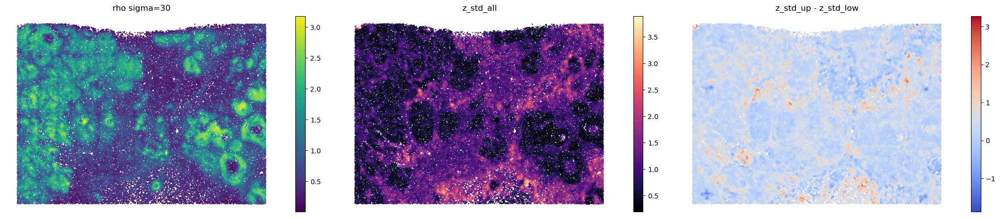

In [2]:
# %%
# ===========================================================================
# Geometry baseline correction + continuous fields (multi-scale) - faster core
#   - merge rho + z-stats in one pass per sigma
#   - avoid pandas scalar .at in inner loop
#   - compute multiple weighted quantiles with single sort
# ===========================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import polars as pl
import time
from scipy.spatial import cKDTree
from scipy.stats import norm
from sklearn.linear_model import LinearRegression, HuberRegressor, RANSACRegressor

BIN_SIZE_UM = float(globals().get("BIN_SIZE_UM", 10.0))
MIN_TRANSCRIPTS_PER_GRID = int(globals().get("MIN_TRANSCRIPTS_PER_GRID", 10))

BASELINE_ORDER_MODE = str(globals().get("BASELINE_ORDER_MODE", "auto")).lower()
BASELINE_FIT_REGION_Q = float(globals().get("BASELINE_FIT_REGION_Q", 0.60))
BASELINE_AIC_DELTA_MIN = float(globals().get("BASELINE_AIC_DELTA_MIN", 2.0))
BASELINE_PILOT_SIGMA_UM = float(globals().get("BASELINE_PILOT_SIGMA_UM", 50.0))

MORAN_KNN_K = int(globals().get("MORAN_KNN_K", 8))
MORAN_PERM_N = int(globals().get("MORAN_PERM_N", 999))
MORAN_MAX_POINTS = int(globals().get("MORAN_MAX_POINTS", 25000))

KDE_EDGE_MODE = str(globals().get("KDE_EDGE_MODE", "reflect_bbox"))
SIGMA_LIST_UM = [float(s) for s in globals().get("SIGMA_LIST_UM", [15, 30, 45])]

MIN_POINTS_NEIGHBOR = int(globals().get("MIN_POINTS_NEIGHBOR", 30))
MIN_POINTS_HALF = int(globals().get("MIN_POINTS_HALF", 8))
RANDOM_SEED = int(globals().get("RANDOM_SEED", 412))
BUILD_GEOM_FIELD_DF = bool(globals().get("BUILD_GEOM_FIELD_DF", False))
GEOM_PLOT_MAX_POINTS = int(globals().get("GEOM_PLOT_MAX_POINTS", 150000))
BASELINE_LOCAL_TREND_Q = float(globals().get("BASELINE_LOCAL_TREND_Q", 0.75))
IMBALANCE_ENHANCE_ALPHA = float(globals().get("IMBALANCE_ENHANCE_ALPHA", 1.5))
CONF_REF_QUANTILE = float(globals().get("CONF_REF_QUANTILE", 0.90))
CONF_SOFT_EXPONENT = float(globals().get("CONF_SOFT_EXPONENT", 0.50))
CONF_RANK_BLEND = float(globals().get("CONF_RANK_BLEND", 0.50))

try:
    from numba import njit
    NUMBA_OK = True
except Exception:
    NUMBA_OK = False
    print("Numba not available, falling back to python.")


def _edge_corr(coords, s, bbox, mode):
    if mode not in {"reflect_bbox", "renorm_mask"}:
        return np.ones(len(coords), np.float32)
    xmin, xmax, ymin, ymax = bbox
    mx = norm.cdf((xmax - coords[:, 0]) / s) - norm.cdf((xmin - coords[:, 0]) / s)
    my = norm.cdf((ymax - coords[:, 1]) / s) - norm.cdf((ymin - coords[:, 1]) / s)
    return np.clip(mx * my, 1e-3, 1.0)


def _nb_to_csr(nb, n):
    # Flatten python list-of-lists to CSR arrays (indptr, indices)
    indptr = np.zeros(n + 1, dtype=np.int64)
    total = 0
    for i in range(n):
        L = nb[i]
        total += (len(L) if L else 1)
        indptr[i + 1] = total
    indices = np.empty(total, dtype=np.int64)
    p = 0
    for i in range(n):
        L = nb[i]
        if not L:
            indices[p] = i
            p += 1
            continue
        for j in L:
            indices[p] = j
            p += 1
    return indptr, indices


if NUMBA_OK:
    @njit(cache=True, fastmath=True)
    def _weighted_std(z, w):
        sw = 0.0
        sz = 0.0
        for i in range(z.shape[0]):
            wi = w[i]
            if wi > 0.0 and np.isfinite(z[i]):
                sw += wi
                sz += wi * z[i]
        if sw <= 0.0:
            return np.nan
        mu = sz / sw
        s2 = 0.0
        for i in range(z.shape[0]):
            wi = w[i]
            if wi > 0.0 and np.isfinite(z[i]):
                d = z[i] - mu
                s2 += wi * d * d
        v = s2 / sw
        if v < 0.0:
            v = 0.0
        return np.sqrt(v)

    @njit(cache=True, fastmath=True)
    def _weighted_quantile_from_sorted(zs, ws, q):
        sw = 0.0
        for i in range(ws.shape[0]):
            sw += ws[i]
        if sw <= 0.0:
            return np.nan
        target = q * sw
        c = 0.0
        for i in range(ws.shape[0]):
            c += ws[i]
            if c >= target:
                return zs[i]
        return zs[zs.shape[0] - 1]

    @njit(cache=True, fastmath=True)
    def _compute_sigma_fields_csr(
        coords, counts, z_res, indptr, indices,
        s, inv, corr,
        min_points_neighbor, min_points_half,
        conf_local_scale, prior,
    ):
        n = coords.shape[0]
        rho = np.zeros(n, np.float32)
        zstd_all = np.empty(n, np.float32)
        zstd_up = np.empty(n, np.float32)
        zstd_lo = np.empty(n, np.float32)
        zstd_diff = np.empty(n, np.float32)
        mixing = np.empty(n, np.float32)
        conf = np.empty(n, np.float32)
        n_nbr = np.zeros(n, np.int64)
        n_up = np.zeros(n, np.int64)
        n_lo = np.zeros(n, np.int64)

        for i in range(n):
            a = indptr[i]
            b = indptr[i + 1]
            m = b - a
            n_nbr[i] = m

            # build weights and local z array
            zi = np.empty(m, np.float32)
            wi = np.empty(m, np.float32)
            xi = coords[i, 0]
            yi = coords[i, 1]

            sw = 0.0
            for t in range(m):
                j = indices[a + t]
                dx = coords[j, 0] - xi
                dy = coords[j, 1] - yi
                d2 = dx * dx + dy * dy
                w = counts[j] * np.exp(-0.5 * d2 / (s * s))
                wi[t] = w
                zi[t] = z_res[j]
                sw += w

            if sw <= 0.0 or not np.isfinite(sw):
                sw = float(m)
                for t in range(m):
                    wi[t] = 1.0

            rho[i] = (sw * inv) / corr[i]

            zstd_all[i] = _weighted_std(zi, wi)

            # sort by zi (simple argsort via numpy in numba is limited; do insertion sort for m~small)
            # For typical neighbor sizes (tens to low hundreds), insertion sort is OK.
            for u in range(1, m):
                zkey = zi[u]
                wkey = wi[u]
                v = u - 1
                while v >= 0 and zi[v] > zkey:
                    zi[v + 1] = zi[v]
                    wi[v + 1] = wi[v]
                    v -= 1
                zi[v + 1] = zkey
                wi[v + 1] = wkey

            med = _weighted_quantile_from_sorted(zi, wi, 0.5)
            q1 = _weighted_quantile_from_sorted(zi, wi, 1.0 / 3.0)
            q2 = _weighted_quantile_from_sorted(zi, wi, 2.0 / 3.0)

            # split up/low by med (need counts)
            cu = 0
            cl = 0
            for t in range(m):
                if zi[t] >= med:
                    cu += 1
                else:
                    cl += 1
            n_up[i] = cu
            n_lo[i] = cl

            # compute std on halves with shrinkage
            if cu > 0:
                zu = np.empty(cu, np.float32)
                wu = np.empty(cu, np.float32)
                p = 0
                for t in range(m):
                    if zi[t] >= med:
                        zu[p] = zi[t]
                        wu[p] = wi[t]
                        p += 1
                su = _weighted_std(zu, wu)
                su2 = su * su if np.isfinite(su) else prior
                frac = cu / max(min_points_half, 1)
                if frac > 1.0:
                    frac = 1.0
                zstd_up[i] = np.sqrt(frac * su2 + (1.0 - frac) * prior)
            else:
                zstd_up[i] = np.sqrt(prior)

            if cl > 0:
                zl = np.empty(cl, np.float32)
                wl = np.empty(cl, np.float32)
                p = 0
                for t in range(m):
                    if zi[t] < med:
                        zl[p] = zi[t]
                        wl[p] = wi[t]
                        p += 1
                sl = _weighted_std(zl, wl)
                sl2 = sl * sl if np.isfinite(sl) else prior
                frac = cl / max(min_points_half, 1)
                if frac > 1.0:
                    frac = 1.0
                zstd_lo[i] = np.sqrt(frac * sl2 + (1.0 - frac) * prior)
            else:
                zstd_lo[i] = np.sqrt(prior)

            zstd_diff[i] = zstd_up[i] - zstd_lo[i]

            # mixing via terciles
            if np.isfinite(q1) and np.isfinite(q2) and q2 > q1:
                s1 = 0.0
                s2 = 0.0
                sw2 = 0.0
                for t in range(m):
                    wt = wi[t]
                    sw2 += wt
                    if zi[t] < q1:
                        s1 += wt
                    elif zi[t] < q2:
                        s2 += wt
                if sw2 > 0.0:
                    p1 = s1 / sw2
                    p2 = s2 / sw2
                    p3 = 1.0 - p1 - p2
                    if p3 < 0.0:
                        p3 = 0.0
                    mixing[i] = 1.0 - (p1 * p1 + p2 * p2 + p3 * p3)
                else:
                    mixing[i] = np.nan
            else:
                mixing[i] = np.nan

            cnb = m / max(min_points_neighbor, 1)
            if cnb > 1.0:
                cnb = 1.0
            mh = cu if cu < cl else cl
            ch = mh / max(min_points_half, 1)
            if ch > 1.0:
                ch = 1.0
            conf[i] = cnb * ch * conf_local_scale[i]

        return rho, zstd_all, zstd_up, zstd_lo, zstd_diff, mixing, conf, n_nbr, n_up, n_lo


def compute_sigma_fields_fast(coords, counts, z_res, tree, bbox, sigma_um, conf_local_scale):
    s = float(sigma_um)
    inv = 1.0 / (2.0 * np.pi * s * s)
    corr = _edge_corr(coords, s, bbox, KDE_EDGE_MODE)

    nb = tree.query_ball_point(coords, r=3.0 * s)
    n = len(coords)

    indptr, indices = _nb_to_csr(nb, n)

    prior = max(float(np.nanvar(z_res)), 1e-6)

    if NUMBA_OK:
        rho, zstd_all, zstd_up, zstd_lo, zstd_diff, mixing, conf, n_nbr, n_up, n_lo = _compute_sigma_fields_csr(
            coords.astype(np.float32),
            counts.astype(np.float32),
            z_res.astype(np.float32),
            indptr,
            indices,
            s,
            inv,
            corr.astype(np.float32),
            int(MIN_POINTS_NEIGHBOR),
            int(MIN_POINTS_HALF),
            conf_local_scale.astype(np.float32),
            float(prior),
        )
    else:
        # fallback: call your previous python version (not included here)
        raise RuntimeError("numba not available; install numba for speed")

    return {
        "sigma_um": s,
        "rho_sigma": rho,
        "z_std_all_sigma": zstd_all,
        "z_std_up_sigma": zstd_up,
        "z_std_low_sigma": zstd_lo,
        "z_std_diff_sigma": zstd_diff,
        "mixing_sigma": mixing,
        "confidence_weight": np.clip(conf, 0.0, 1.0),
        "n_neighbor": n_nbr,
        "n_up": n_up,
        "n_low": n_lo,
    }
def dm(x, y, order):
    if order == "linear":
        return np.c_[x, y]
    return np.c_[x, y, x * x, x * y, y * y]


def mk_ransac(thr, seed):
    kw = dict(
        random_state=seed,
        max_trials=2000,
        min_samples=0.2,
        residual_threshold=float(thr),
    )
    try:
        return RANSACRegressor(estimator=LinearRegression(), **kw)
    except TypeError:
        return RANSACRegressor(base_estimator=LinearRegression(), **kw)


def fit_model(x, y, z, w, order, seed):
    xm, xs = x.mean(), (x.std() or 1.0)
    ym, ys = y.mean(), (y.std() or 1.0)
    xx = (x - xm) / xs
    yy = (y - ym) / ys
    X = dm(xx, yy, order)

    mad = np.median(np.abs(z - np.median(z)))
    r = mk_ransac(max(1e-6, 1.5 * mad), seed)
    try:
        r.fit(X, z, sample_weight=w)
    except TypeError:
        r.fit(X, z)

    inl = r.inlier_mask_ if r.inlier_mask_ is not None else np.ones(len(z), bool)

    h = HuberRegressor(max_iter=300, epsilon=1.35)
    try:
        h.fit(X[inl], z[inl], sample_weight=w[inl])
    except TypeError:
        h.fit(X[inl], z[inl])

    pred = h.predict(X)
    rss = np.sum(w * (z - pred) ** 2) / max(np.mean(w), 1e-12)
    k = X.shape[1] + 1
    n = len(z)
    return {
        "order": order,
        "h": h,
        "xm": xm,
        "xs": xs,
        "ym": ym,
        "ys": ys,
        "inl": inl,
        "aic": float(2 * k + n * np.log(max(rss / n, 1e-12))),
    }


def pred_model(m, x, y):
    xx = (x - m["xm"]) / m["xs"]
    yy = (y - m["ym"]) / m["ys"]
    return m["h"].predict(dm(xx, yy, m["order"]))


def wstd(v, w):
    m = np.isfinite(v) & np.isfinite(w) & (w > 0)
    v = v[m]
    w = w[m]
    if v.size == 0:
        return np.nan
    mu = np.average(v, weights=w)
    return float(np.sqrt(max(np.average((v - mu) ** 2, weights=w), 0.0)))


def weighted_quantiles_sorted(v_sorted, w_sorted, qs):
    """
    v_sorted ascending, w_sorted aligned. Return quantiles at qs (list of floats in [0,1]).
    Use cumulative weight CDF with linear interpolation.
    """
    ws = float(w_sorted.sum())
    if ws <= 0:
        return [np.nan for _ in qs]
    c = np.cumsum(w_sorted) / ws
    out = []
    for q in qs:
        out.append(float(np.interp(float(q), c, v_sorted)))
    return out


def moran(res, coords, k, nperm, maxp, seed, w=None):
    x = np.asarray(res, np.float32)
    c = np.asarray(coords, np.float32)
    m = np.isfinite(x) & np.isfinite(c[:, 0]) & np.isfinite(c[:, 1])
    x = x[m]
    c = c[m]
    if w is not None:
        w = np.asarray(w, np.float32)[m]

    if len(x) > maxp:
        rng = np.random.default_rng(seed)
        p = (w / w.sum()) if (w is not None and w.sum() > 0) else None
        keep = np.sort(rng.choice(len(x), size=maxp, replace=False, p=p))
        x = x[keep]
        c = c[keep]

    if len(x) < k + 3:
        return np.nan, np.nan

    nn = cKDTree(c).query(c, k=min(k + 1, len(x)))[1]
    nn = nn[:, 1:] if nn.ndim > 1 else np.empty((len(x), 0), int)
    if nn.shape[1] == 0:
        return np.nan, np.nan

    z = x - x.mean()
    den = np.sum(z * z)
    if den <= 0:
        return np.nan, np.nan

    kk = nn.shape[1]
    obs = float(np.sum(z[:, None] * z[nn]) / kk / den)

    rng = np.random.default_rng(seed + 17)
    per = np.empty(int(nperm), np.float32)
    for i in range(int(nperm)):
        zp = z[rng.permutation(len(z))]
        per[i] = np.sum(zp[:, None] * zp[nn]) / kk / den

    p = float((1 + np.sum(np.abs(per) >= abs(obs))) / (len(per) + 1))
    return obs, p


def compute_edge_correction(coords, s, bbox, mode):
    if mode not in {"reflect_bbox", "renorm_mask"}:
        return np.ones(len(coords), np.float32)
    xmin, xmax, ymin, ymax = bbox
    mx = norm.cdf((xmax - coords[:, 0]) / s) - norm.cdf((xmin - coords[:, 0]) / s)
    my = norm.cdf((ymax - coords[:, 1]) / s) - norm.cdf((ymin - coords[:, 1]) / s)
    return np.clip(mx * my, 1e-3, 1.0)



# ---------------------------------------------------------------------------
# Build grids
# ---------------------------------------------------------------------------
df_binned = df.with_columns(
    (pl.col("x_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("x_bin"),
    (pl.col("y_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("y_bin"),
)

grid_tmp = (
    df_binned.group_by(["x_bin", "y_bin"])
    .agg(
        pl.len().alias("transcript_count"),
        pl.col("z_location").mean().alias("z_mean_um"),
    )
    .filter(pl.col("transcript_count") >= MIN_TRANSCRIPTS_PER_GRID)
    .with_columns(
        (pl.col("x_bin") * BIN_SIZE_UM + BIN_SIZE_UM / 2.0).alias("x_um"),
        (pl.col("y_bin") * BIN_SIZE_UM + BIN_SIZE_UM / 2.0).alias("y_um"),
    )
)

grid_base = grid_tmp.to_pandas().sort_values(["x_bin", "y_bin"]).reset_index(drop=True)

if grid_base.empty:
    raise ValueError("No grids after filtering")

coords = grid_base[["x_um", "y_um"]].to_numpy(np.float32)
counts = grid_base["transcript_count"].to_numpy(np.float32)
z = grid_base["z_mean_um"].to_numpy(np.float32)

bbox = (coords[:, 0].min(), coords[:, 0].max(), coords[:, 1].min(), coords[:, 1].max())
tree = cKDTree(coords)

_t0 = time.perf_counter()

# ---------------------------------------------------------------------------
# Pilot density for baseline fit region
# ---------------------------------------------------------------------------
pilot_fields = compute_sigma_fields_fast(
    coords=coords,
    counts=counts,
    z_res=np.zeros_like(z),
    tree=tree,
    bbox=bbox,
    sigma_um=BASELINE_PILOT_SIGMA_UM,
    conf_local_scale=np.ones_like(z, dtype=np.float32),
)
pilot = pilot_fields["rho_sigma"]
del pilot_fields
_t_pilot = time.perf_counter()
print(f"[perf] pilot density: {_t_pilot - _t0:.2f}s")

thr = float(np.quantile(pilot[np.isfinite(pilot)], BASELINE_FIT_REGION_Q))
fit = pilot >= thr
if fit.sum() < 50:
    fit[np.argsort(-pilot)[: min(len(pilot), 5000)]] = True

lin = fit_model(coords[fit, 0], coords[fit, 1], z[fit], counts[fit], "linear", RANDOM_SEED)
qua = fit_model(coords[fit, 0], coords[fit, 1], z[fit], counts[fit], "quadratic", RANDOM_SEED + 1)

if BASELINE_ORDER_MODE == "linear":
    m = lin
elif BASELINE_ORDER_MODE == "quadratic":
    m = qua
else:
    m = qua if qua["aic"] <= lin["aic"] - BASELINE_AIC_DELTA_MIN else lin

z_base = pred_model(m, coords[:, 0], coords[:, 1])
z_res = z - z_base

mi, mp = moran(z_res, coords, MORAN_KNN_K, MORAN_PERM_N, MORAN_MAX_POINTS, RANDOM_SEED, counts)
if (
    BASELINE_ORDER_MODE == "auto"
    and m["order"] == "linear"
    and np.isfinite(mi)
    and np.isfinite(mp)
    and mp < 0.01
    and abs(mi) >= 0.03
):
    m = qua
    z_base = pred_model(m, coords[:, 0], coords[:, 1])
    z_res = z - z_base
    mi, mp = moran(z_res, coords, MORAN_KNN_K, MORAN_PERM_N, MORAN_MAX_POINTS, RANDOM_SEED + 23, counts)

trend = bool(np.isfinite(mi) and np.isfinite(mp) and mp < 0.01 and abs(mi) >= 0.03)
if trend:
    _down = float(globals().get("BASELINE_CONFIDENCE_DOWNSCALE", 0.7))
    _q = float(np.clip(BASELINE_LOCAL_TREND_Q, 0.5, 0.99))
    _thr = float(np.quantile(np.abs(z_res), _q))
    conf_local_scale = np.where(np.abs(z_res) >= _thr, _down, 1.0).astype(np.float32)
else:
    conf_local_scale = np.ones_like(z_res, dtype=np.float32)

# ---------------------------------------------------------------------------
# Base point table (numpy-friendly)
# ---------------------------------------------------------------------------
point_df = grid_base.copy()
point_df["z_baseline"] = z_base
point_df["z_residual"] = z_res
point_df["baseline_fit_weight"] = np.where(fit, counts, 0.0)

tmp = np.zeros(len(point_df), int)
inl_idx = np.where(fit)[0]
tmp[inl_idx[m["inl"]]] = 1
point_df["baseline_inlier"] = tmp

# Pre-extract metadata arrays to avoid pandas .at in loops
x_bin_arr = point_df["x_bin"].to_numpy(int)
y_bin_arr = point_df["y_bin"].to_numpy(int)
x_um_arr = point_df["x_um"].to_numpy(np.float32)
y_um_arr = point_df["y_um"].to_numpy(np.float32)
tc_arr = point_df["transcript_count"].to_numpy(np.float32)

# ---------------------------------------------------------------------------
# Multi-scale fields (main heavy part, streaming to reduce memory)
# ---------------------------------------------------------------------------
wide = point_df[
    [
        "x_bin",
        "y_bin",
        "x_um",
        "y_um",
        "transcript_count",
        "z_baseline",
        "z_residual",
        "baseline_inlier",
        "baseline_fit_weight",
    ]
].copy()

geom_chunks = [] if BUILD_GEOM_FIELD_DF else None
for s in SIGMA_LIST_UM:
    _t_sigma_start = time.perf_counter()
    s = float(s)
    tag = f"s{int(s)}"
    f = compute_sigma_fields_fast(
        coords=coords,
        counts=counts,
        z_res=z_res,
        tree=tree,
        bbox=bbox,
        sigma_um=s,
        conf_local_scale=conf_local_scale,
    )

    wide[f"rho_sigma_{tag}"] = f["rho_sigma"]
    wide[f"z_std_all_sigma_{tag}"] = f["z_std_all_sigma"]
    wide[f"z_std_up_sigma_{tag}"] = f["z_std_up_sigma"]
    wide[f"z_std_low_sigma_{tag}"] = f["z_std_low_sigma"]
    wide[f"z_std_diff_sigma_{tag}"] = f["z_std_diff_sigma"]
    wide[f"mixing_sigma_{tag}"] = f["mixing_sigma"]
    _n_nb = f["n_neighbor"].astype(np.float32)
    _n_half = np.minimum(f["n_up"], f["n_low"]).astype(np.float32)

    _q = float(np.clip(CONF_REF_QUANTILE, 0.5, 0.99))
    _nb_ref = float(np.quantile(_n_nb[_n_nb > 0], _q)) if np.any(_n_nb > 0) else 1.0
    _hf_ref = float(np.quantile(_n_half[_n_half > 0], _q)) if np.any(_n_half > 0) else 1.0
    _nb_ref = max(_nb_ref, 1.0)
    _hf_ref = max(_hf_ref, 1.0)

    _exp = float(max(CONF_SOFT_EXPONENT, 1e-6))
    _c_nb = np.clip((_n_nb / _nb_ref) ** _exp, 0.0, 1.0)
    _c_hf = np.clip((_n_half / _hf_ref) ** _exp, 0.0, 1.0)
    _conf = np.clip(_c_nb * _c_hf * conf_local_scale, 0.0, 1.0)

    _rb = float(np.clip(CONF_RANK_BLEND, 0.0, 1.0))
    if _rb > 0.0 and len(_conf) > 1:
        _ord = np.argsort(_conf)
        _rank = np.empty_like(_conf)
        _rank[_ord] = np.linspace(0.0, 1.0, len(_conf), endpoint=True)
        _conf = (1.0 - _rb) * _conf + _rb * _rank

    wide[f"confidence_weight_{tag}"] = np.clip(_conf, 0.0, 1.0)
    wide[f"n_neighbor_{tag}"] = f["n_neighbor"]
    wide[f"n_up_{tag}"] = f["n_up"]
    wide[f"n_low_{tag}"] = f["n_low"]

    _den = f["n_up"] + f["n_low"]
    _imb_signed = np.divide(
        f["n_up"] - f["n_low"],
        _den,
        out=np.zeros_like(f["z_std_diff_sigma"], dtype=np.float32),
        where=_den > 0,
    )
    _imb_abs = np.abs(_imb_signed)
    _enh = f["z_std_diff_sigma"] * (1.0 + IMBALANCE_ENHANCE_ALPHA * _imb_abs)

    wide[f"imbalance_signed_{tag}"] = _imb_signed
    wide[f"imbalance_abs_{tag}"] = _imb_abs
    wide[f"z_std_diff_enhanced_{tag}"] = _enh

    print(f"[perf] sigma={int(s)} done in {time.perf_counter() - _t_sigma_start:.2f}s")

    if BUILD_GEOM_FIELD_DF:
        geom_chunks.append(
            pd.DataFrame(
                {
                    "x_bin": x_bin_arr,
                    "y_bin": y_bin_arr,
                    "x_um": x_um_arr,
                    "y_um": y_um_arr,
                    "transcript_count": tc_arr,
                    "sigma_um": np.full(len(point_df), s, dtype=np.float32),
                    "rho_sigma": f["rho_sigma"],
                    "z_std_all_sigma": f["z_std_all_sigma"],
                    "z_std_up_sigma": f["z_std_up_sigma"],
                    "z_std_low_sigma": f["z_std_low_sigma"],
                    "z_std_diff_sigma": f["z_std_diff_sigma"],
                    "mixing_sigma": f["mixing_sigma"],
                    "confidence_weight": np.clip(_conf, 0.0, 1.0),
                    "n_neighbor": f["n_neighbor"],
                    "n_up": f["n_up"],
                    "n_low": f["n_low"],
                    "imbalance_signed": _imb_signed,
                    "imbalance_abs": _imb_abs,
                    "z_std_diff_enhanced": _enh,
                }
            )
        )

if BUILD_GEOM_FIELD_DF:
    geom_field_df = pd.concat(geom_chunks, axis=0, ignore_index=True) if geom_chunks else pd.DataFrame()
else:
    geom_field_df = None

ref = min(SIGMA_LIST_UM, key=lambda t: abs(float(t) - 30.0))
tag = f"s{int(float(ref))}"

grid_pd = wide.copy()
grid_pd["z_std_all_ref"] = grid_pd[f"z_std_all_sigma_{tag}"]
grid_pd["mixing_ref"] = grid_pd[f"mixing_sigma_{tag}"]
grid_pd["z_std_diff_ref"] = grid_pd[f"z_std_diff_sigma_{tag}"]
grid_pd["z_std_diff_enhanced"] = grid_pd[f"z_std_diff_enhanced_{tag}"]
grid_pd["confidence_weight"] = grid_pd[f"confidence_weight_{tag}"].clip(0, 1)

GEOMETRY_FEATURE_COLUMNS = [
    c
    for c in grid_pd.columns
    if c.startswith("rho_sigma_")
    or c.startswith("z_std_all_sigma_")
    or c.startswith("z_std_diff_enhanced_")
]
CLASSIFICATION_FEATURE_COLUMNS = tuple(GEOMETRY_FEATURE_COLUMNS)
CLASSIFICATION_GEOMETRY_ONLY = True

qc_df = pd.DataFrame(
    [
        {
            "AIC_linear": lin["aic"],
            "AIC_quad": qua["aic"],
            "delta_AIC": lin["aic"] - qua["aic"],
            "Moran_I": mi,
            "Moran_p": mp,
            "baseline_qc_flag": "trend_remaining" if trend else "ok",
        }
    ]
)

_t_end = time.perf_counter()
print(f"[perf] total geometry cell: {_t_end - _t0:.2f}s")

print("=" * 72)
print("Geometry preprocessing summary")
print("=" * 72)
print(f"Grid count: {len(grid_pd):,}")
print(f"Selected baseline order: {m['order']}")
print(f"AIC linear/quadratic: {lin['aic']:.3f}/{qua['aic']:.3f}")
print(f"Moran's I residual: {mi:.4f} (p={mp:.4g})")
print(f"Geometry feature columns: {len(GEOMETRY_FEATURE_COLUMNS)}")
print(f"Imbalance enhance alpha: {IMBALANCE_ENHANCE_ALPHA}")
print(f"Confidence tuning: q={CONF_REF_QUANTILE}, exp={CONF_SOFT_EXPONENT}, rank_blend={CONF_RANK_BLEND}")
print(f"Confidence weight quantiles: p10={np.nanquantile(grid_pd['confidence_weight'],0.10):.3f}, p50={np.nanquantile(grid_pd['confidence_weight'],0.50):.3f}, p90={np.nanquantile(grid_pd['confidence_weight'],0.90):.3f}")
print("=" * 72)

if len(grid_pd) > GEOM_PLOT_MAX_POINTS:
    _idx = np.random.default_rng(RANDOM_SEED).choice(len(grid_pd), size=GEOM_PLOT_MAX_POINTS, replace=False)
    _plot_df = grid_pd.iloc[np.sort(_idx)]
else:
    _plot_df = grid_pd

fig, ax = plt.subplots(1, 3, figsize=(21, 6))
sc = ax[0].scatter(
    _plot_df["x_um"],
    _plot_df["y_um"],
    c=_plot_df[f"rho_sigma_{tag}"],
    s=2,
    cmap="viridis",
    edgecolors="none",
    rasterized=True,
)
ax[0].set_title(f"rho sigma={int(ref)}")
sc1 = ax[1].scatter(
    _plot_df["x_um"],
    _plot_df["y_um"],
    c=_plot_df[f"z_std_all_sigma_{tag}"],
    s=2,
    cmap="magma",
    edgecolors="none",
    rasterized=True,
)
ax[1].set_title("z_std_all")
sc2 = ax[2].scatter(
    _plot_df["x_um"],
    _plot_df["y_um"],
    c=_plot_df[f"z_std_diff_sigma_{tag}"],
    s=2,
    cmap="coolwarm",
    edgecolors="none",
    rasterized=True,
)
ax[2].set_title("z_std_up - z_std_low")

for s_, a_ in [(sc, ax[0]), (sc1, ax[1]), (sc2, ax[2])]:
    plt.colorbar(s_, ax=a_, shrink=0.7)

for a in ax:
    a.set_aspect("equal")
    a.invert_yaxis()
    a.axis("off")

plt.tight_layout()
plt.show()

# 注意：这玩意吃内存
# Note: This thing eats a lot of memory





Z-layer diagnostics summary
Reference sigma (um)                 : 30.0
Diff column used                     : z_std_diff_sigma_s30
Rows analyzed                        : 387,778
|z_std_diff| 95% quantile threshold : 0.8840
Extreme points fraction              : 5.00%
Extreme & low-confidence (<0.4) : 1.88%
Extreme & high-confidence (>=0.7) : 0.86%
abs(z_std_diff) by confidence bin:
   conf_bin  count   median     mean
 [0.0, 0.4)  63054 0.373837 0.455110
 [0.4, 0.7) 139179 0.340416 0.394061
[0.7, 1.01) 185545 0.221733 0.270052


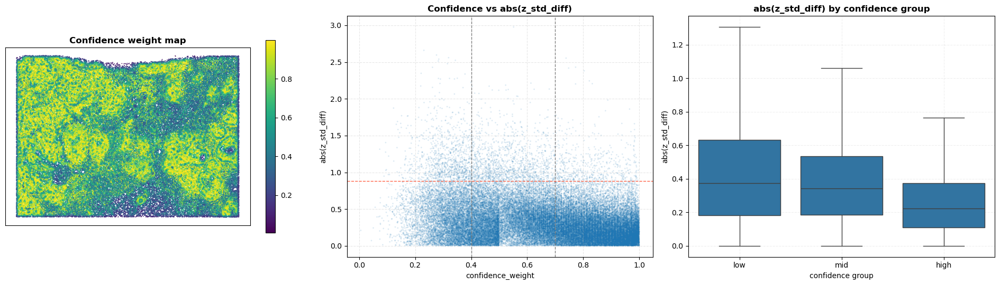

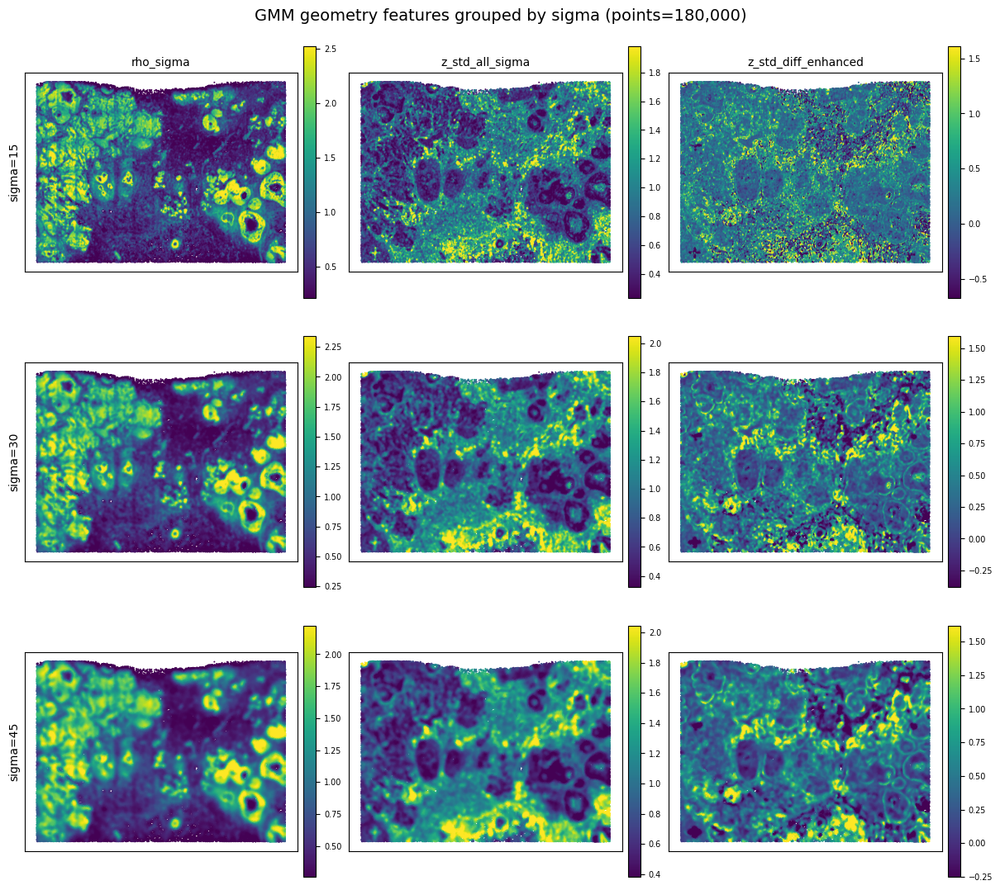

In [3]:
# ===========================================================================
# Z-layer diagnostics: confidence checks + sigma-grouped geometry feature maps
# ===========================================================================

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

if "grid_pd" not in globals():
    raise NameError("Missing grid_pd. Run geometry preprocessing cell first.")

if "confidence_weight" not in grid_pd.columns:
    raise ValueError("grid_pd missing confidence_weight")

ref_sigma = min([float(s) for s in globals().get("SIGMA_LIST_UM", [30])], key=lambda t: abs(t - 30.0))
tag = f"s{int(ref_sigma)}"

diff_col = f"z_std_diff_sigma_{tag}" if f"z_std_diff_sigma_{tag}" in grid_pd.columns else "z_std_diff"
if diff_col not in grid_pd.columns:
    raise ValueError("Missing z_std_diff column in grid_pd")

qc = grid_pd[["x_um", "y_um", "confidence_weight", diff_col]].copy()
qc = qc.replace([np.inf, -np.inf], np.nan).dropna(subset=["confidence_weight", diff_col])

if qc.empty:
    raise ValueError("No valid rows for z-layer diagnostics")

qc = qc.rename(columns={diff_col: "z_std_diff_use"})
qc["abs_diff"] = qc["z_std_diff_use"].abs()

CONF_HIGH = 0.70
CONF_LOW = 0.40
EXTREME_Q = 0.95

ext_thr = float(qc["abs_diff"].quantile(EXTREME_Q))
ext_mask = qc["abs_diff"] >= ext_thr

frac_extreme = float(ext_mask.mean())
frac_extreme_low_conf = float((ext_mask & (qc["confidence_weight"] < CONF_LOW)).mean())
frac_extreme_high_conf = float((ext_mask & (qc["confidence_weight"] >= CONF_HIGH)).mean())

print("=" * 72)
print("Z-layer diagnostics summary")
print("=" * 72)
print(f"Reference sigma (um)                 : {ref_sigma}")
print(f"Diff column used                     : {diff_col}")
print(f"Rows analyzed                        : {len(qc):,}")
print(f"|z_std_diff| {EXTREME_Q:.0%} quantile threshold : {ext_thr:.4f}")
print(f"Extreme points fraction              : {frac_extreme:.2%}")
print(f"Extreme & low-confidence (<{CONF_LOW}) : {frac_extreme_low_conf:.2%}")
print(f"Extreme & high-confidence (>={CONF_HIGH}) : {frac_extreme_high_conf:.2%}")
print("=" * 72)

bins = pd.IntervalIndex.from_tuples([(0.0, 0.4), (0.4, 0.7), (0.7, 1.01)], closed="left")
qc["conf_bin"] = pd.cut(qc["confidence_weight"], bins=bins).astype(str)
qc.loc[qc["conf_bin"] == "nan", "conf_bin"] = "other"

stat_df = (
    qc.groupby("conf_bin", observed=True)["abs_diff"]
    .agg(["count", "median", "mean"])
    .reset_index()
)
print("abs(z_std_diff) by confidence bin:")
print(stat_df[["conf_bin", "count", "median", "mean"]].to_string(index=False))

plot_df = qc
if len(plot_df) > 150000:
    idx = np.random.default_rng(412).choice(len(plot_df), 150000, replace=False)
    plot_df = plot_df.iloc[np.sort(idx)].copy()

# --- Keep confidence diagnostics plots ---
fig, axes = plt.subplots(1, 3, figsize=(19, 5.5))

sc0 = axes[0].scatter(
    plot_df["x_um"],
    plot_df["y_um"],
    c=plot_df["confidence_weight"],
    s=1.5,
    cmap="viridis",
    edgecolors="none",
    rasterized=True,
)
axes[0].set_title("Confidence weight map", fontweight="bold")
plt.colorbar(sc0, ax=axes[0], shrink=0.8)
axes[0].set_aspect("equal")
axes[0].invert_yaxis()
axes[0].set_xticks([])
axes[0].set_yticks([])

sample_n = min(60000, len(plot_df))
ss = plot_df.sample(n=sample_n, random_state=412) if len(plot_df) > sample_n else plot_df
axes[1].scatter(
    ss["confidence_weight"],
    ss["abs_diff"],
    s=4,
    alpha=0.15,
    color="tab:blue",
    edgecolors="none",
)
axes[1].axvline(CONF_LOW, ls="--", lw=1, color="gray")
axes[1].axvline(CONF_HIGH, ls="--", lw=1, color="gray")
axes[1].axhline(ext_thr, ls="--", lw=1, color="tomato")
axes[1].set_xlabel("confidence_weight")
axes[1].set_ylabel("abs(z_std_diff)")
axes[1].set_title("Confidence vs abs(z_std_diff)", fontweight="bold")
axes[1].grid(True, ls="--", alpha=0.3)

sns.boxplot(
    data=plot_df.assign(
        conf_group=pd.cut(
            plot_df["confidence_weight"],
            bins=[0, CONF_LOW, CONF_HIGH, 1.0],
            labels=["low", "mid", "high"],
            include_lowest=True,
        )
    ),
    x="conf_group",
    y="abs_diff",
    ax=axes[2],
    showfliers=False,
)
axes[2].set_xlabel("confidence group")
axes[2].set_ylabel("abs(z_std_diff)")
axes[2].set_title("abs(z_std_diff) by confidence group", fontweight="bold")
axes[2].grid(True, ls="--", alpha=0.2)

plt.tight_layout()
plt.show()

# --- Replace diff map with sigma-grouped feature maps used by GMM ---
if "GEOMETRY_FEATURE_COLUMNS" in globals():
    feat_cols = [c for c in GEOMETRY_FEATURE_COLUMNS if c in grid_pd.columns]
else:
    prefixes = (
        "rho_sigma_",
        "z_std_all_sigma_",
        "z_std_diff_enhanced_",
    )
    feat_cols = [c for c in grid_pd.columns if c.startswith(prefixes)]

pairs = []
for c in feat_cols:
    m = re.match(r"^(.*)_s(\d+)$", c)
    if m:
        base = m.group(1)
        sigma = int(m.group(2))
        pairs.append((c, base, sigma))

if not pairs:
    raise ValueError("No *_sXX geometry columns found for sigma-grouped plotting.")

bases_all = sorted({b for _, b, _ in pairs})
sigmas = sorted({s for _, _, s in pairs})

base_order_pref = [
    "rho_sigma",
    "z_std_all_sigma",
    "z_std_diff_enhanced",
]
base_order = [b for b in base_order_pref if b in bases_all] + [b for b in bases_all if b not in base_order_pref]

col_map = {(b, s): c for c, b, s in pairs}

need = ["x_um", "y_um"] + [c for c, _, _ in pairs]
map_df = grid_pd[need].copy()
xy_ok = np.isfinite(map_df["x_um"].to_numpy(np.float32)) & np.isfinite(map_df["y_um"].to_numpy(np.float32))
map_df = map_df.loc[xy_ok].reset_index(drop=True)

MAX_POINTS = 180000
if len(map_df) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = np.sort(rng.choice(len(map_df), size=MAX_POINTS, replace=False))
    map_df = map_df.iloc[keep].reset_index(drop=True)

x = map_df["x_um"].to_numpy(np.float32)
y = map_df["y_um"].to_numpy(np.float32)

nrow = len(sigmas)
ncol = len(base_order)
fig, axes = plt.subplots(
    nrow,
    ncol,
    figsize=(4.0 * ncol, 3.6 * nrow),
    sharex=True,
    sharey=True,
    constrained_layout=True,
)

if nrow == 1 and ncol == 1:
    axes = np.array([[axes]])
elif nrow == 1:
    axes = axes[np.newaxis, :]
elif ncol == 1:
    axes = axes[:, np.newaxis]

for i, s in enumerate(sigmas):
    for j, b in enumerate(base_order):
        ax = axes[i, j]
        c = col_map.get((b, s), None)

        if c is None:
            ax.axis("off")
            continue

        v = map_df[c].to_numpy(np.float32)
        ok = np.isfinite(v)
        if ok.sum() == 0:
            ax.set_title(f"{b}\n(no finite)", fontsize=9)
            ax.axis("off")
            continue

        lo, hi = np.nanpercentile(v[ok], [2, 98])
        if (not np.isfinite(lo)) or (not np.isfinite(hi)) or (lo == hi):
            lo, hi = float(np.nanmin(v[ok])), float(np.nanmax(v[ok]))
            if lo == hi:
                lo -= 1e-9
                hi += 1e-9

        sc = ax.scatter(
            x[ok],
            y[ok],
            c=v[ok],
            s=2,
            cmap="viridis",
            vmin=lo,
            vmax=hi,
            edgecolors="none",
            rasterized=True,
        )
        if i == 0:
            ax.set_title(b, fontsize=10)
        if j == 0:
            ax.set_ylabel(f"sigma={s}", fontsize=10)
        ax.set_aspect("equal", adjustable="box")
        ax.invert_yaxis()
        ax.set_xticks([])
        ax.set_yticks([])

        cb = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.02)
        cb.ax.tick_params(labelsize=7)

fig.suptitle(
    f"GMM geometry features grouped by sigma (points={len(map_df):,})",
    fontsize=14,
)
plt.show()


Geometry-only segmentation summary (FAST)
Valid points: 387,778
Feature count: 9
GMM covariance_type: diag
Selected K: 8
Lambda mode: stability
Selected lambda: 4.75476
Solver used: icm_numba
Edge count: 1,514,874
Connectivity: 8
Tau: 0.479842
K stability eval subset: 120,000
Numba ICM enabled: True
Compare clusters: 6 vs 7


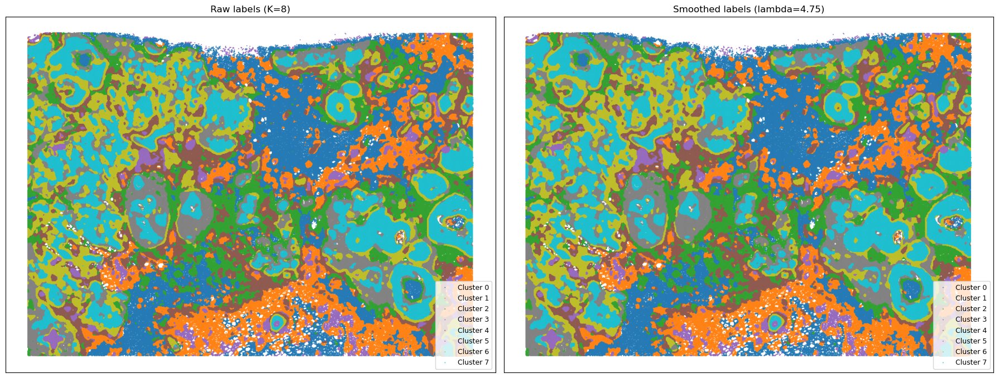

In [4]:
# %%
# ===========================================================================
# Geometry-only clustering (FAST): GMM (diag) data term + Potts MRF smoothing
#   - vectorized grid edges via 2D index map
#   - GMM covariance_type=diag (much faster)
#   - stability eval uses fixed eval subset (no full predict per bootstrap)
#   - CSR neighbors + numba ICM (fallback to python if numba missing)
#   - optional pygco alpha-expansion if installed
# ===========================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import adjusted_rand_score

RANDOM_SEED = int(globals().get("RANDOM_SEED", 412))
K_RANGE = [int(k) for k in globals().get("K_RANGE", list(range(2, 9)))]

# K selection
K_SELECTION_BOOTSTRAPS = int(globals().get("K_SELECTION_BOOTSTRAPS", 8))
K_SELECTION_SUBSAMPLE_FRAC = float(globals().get("K_SELECTION_SUBSAMPLE_FRAC", 0.8))
K_STABILITY_MIN = float(globals().get("K_STABILITY_MIN", 0.70))

# Lambda selection
LAMBDA_MODE = str(globals().get("LAMBDA_MODE", "stability")).lower()
LAMBDA_GRID_CFG = globals().get("LAMBDA_GRID", None)
LAMBDA_MANUAL = globals().get("LAMBDA_MANUAL", None)
LAMBDA_STABILITY_REPEATS = int(globals().get("LAMBDA_STABILITY_REPEATS", 12))  # lowered default
LAMBDA_STABILITY_SUBSAMPLE_FRAC = float(globals().get("LAMBDA_STABILITY_SUBSAMPLE_FRAC", 0.8))

MRF_SOLVER = str(globals().get("MRF_SOLVER", "alpha_expansion")).lower()
ICM_RESTARTS = int(globals().get("ICM_RESTARTS", 6))  # lowered default
ICM_MAX_ITER = int(globals().get("ICM_MAX_ITER", 25))  # lowered default

# Performance knobs
GMM_COV = str(globals().get("GMM_COVARIANCE_TYPE", "diag")).lower()  # "diag" recommended
EVAL_N = int(globals().get("K_STABILITY_EVAL_N", 120000))  # subset used to compare bootstrap labelings
EDGE_CONNECTIVITY = int(globals().get("EDGE_CONNECTIVITY", 8))  # 4 or 8
LAMBDA_STABILITY_TOPN = int(globals().get("LAMBDA_STABILITY_TOPN", 3))  # only run stability on best few lambdas

if "grid_pd" not in globals() or "GEOMETRY_FEATURE_COLUMNS" not in globals():
    raise NameError("Run geometry cell first (need grid_pd and GEOMETRY_FEATURE_COLUMNS).")

seg_input = grid_pd.copy()
feature_cols = [c for c in GEOMETRY_FEATURE_COLUMNS if c in seg_input.columns]
if not feature_cols:
    raise ValueError("No geometry features found.")

X_all = seg_input[feature_cols].to_numpy(np.float32)
valid = np.all(np.isfinite(X_all), axis=1)
if int(valid.sum()) < max(K_RANGE) * 50:
    raise ValueError("Too few valid rows for clustering.")

seg_valid = seg_input.loc[valid].reset_index().rename(columns={"index": "_orig_idx"}).copy()
X = X_all[valid]

conf = seg_valid["confidence_weight"].to_numpy(np.float32) if "confidence_weight" in seg_valid.columns else np.ones(len(seg_valid), np.float32)
conf = np.clip(np.nan_to_num(conf, nan=0.5, posinf=1.0, neginf=0.0), 0.0, 1.0)

Xs = StandardScaler().fit_transform(X).astype(np.float32, copy=False)

# ----------------------------
# Optional numba acceleration
# ----------------------------
try:
    from numba import njit
    NUMBA_OK = True
except Exception:
    NUMBA_OK = False
    print("Numba not available, falling back to python.")

# ----------------------------
# Build edges (vectorized, no dict loop)
# ----------------------------
def build_grid_edges_vectorized(bin_xy, connectivity=8):
    """
    bin_xy: (n,2) int (x_bin,y_bin) for VALID points only.
    Returns ei, ej arrays with i<j, undirected edges.
    Uses a dense 2D index map on [xmin..xmax] x [ymin..ymax].
    """
    bx = bin_xy[:, 0].astype(np.int32)
    by = bin_xy[:, 1].astype(np.int32)
    xmin, xmax = int(bx.min()), int(bx.max())
    ymin, ymax = int(by.min()), int(by.max())
    W = (xmax - xmin + 1)
    H = (ymax - ymin + 1)

    # 2D map: index in [0..n-1], else -1
    idx_map = -np.ones((W, H), dtype=np.int32)
    ix = (bx - xmin).astype(np.int32)
    iy = (by - ymin).astype(np.int32)
    idx_map[ix, iy] = np.arange(len(bin_xy), dtype=np.int32)

    if connectivity == 4:
        offs = [(1, 0), (0, 1)]
    else:
        offs = [(1, 0), (0, 1), (1, 1), (1, -1)]

    ei_list = []
    ej_list = []
    for dx, dy in offs:
        x2 = ix + dx
        y2 = iy + dy
        m = (x2 >= 0) & (x2 < W) & (y2 >= 0) & (y2 < H)
        if not np.any(m):
            continue
        j = idx_map[x2[m], y2[m]]
        m2 = j >= 0
        if not np.any(m2):
            continue
        i = np.where(m)[0][m2].astype(np.int32)
        j = j[m2].astype(np.int32)
        # ensure i<j
        swap = i > j
        if np.any(swap):
            ii = i.copy()
            i[swap] = j[swap]
            j[swap] = ii[swap]
        ei_list.append(i)
        ej_list.append(j)

    if not ei_list:
        return np.array([], dtype=np.int32), np.array([], dtype=np.int32)

    ei = np.concatenate(ei_list).astype(np.int32)
    ej = np.concatenate(ej_list).astype(np.int32)

    # unique edges (optional; can contain duplicates from swaps)
    # Use structured view for fast unique
    edges = np.stack([ei, ej], axis=1)
    edges = np.unique(edges, axis=0)
    return edges[:, 0].astype(np.int32), edges[:, 1].astype(np.int32)

bin_xy = seg_valid[["x_bin", "y_bin"]].to_numpy(int)
ei, ej = build_grid_edges_vectorized(bin_xy, connectivity=EDGE_CONNECTIVITY)

# ----------------------------
# Edge weights from feature distance
# ----------------------------
def compute_edge_weights(X_feat, ei, ej):
    if len(ei) == 0:
        return np.array([], dtype=np.float32), 1.0
    d = np.linalg.norm(X_feat[ei] - X_feat[ej], axis=1)
    dpos = d[d > 0]
    tau = float(np.median(dpos)) if dpos.size else 1.0
    tau = max(tau, 1e-6)
    w = np.exp(-(d * d) / (tau * tau)).astype(np.float32)
    return w, tau

w_ij, tau = compute_edge_weights(Xs, ei, ej)

# ----------------------------
# CSR neighbors
# ----------------------------
def edges_to_csr(n, ei, ej, w):
    deg = np.zeros(n, dtype=np.int32)
    np.add.at(deg, ei, 1)
    np.add.at(deg, ej, 1)
    indptr = np.zeros(n + 1, dtype=np.int32)
    indptr[1:] = np.cumsum(deg, dtype=np.int64).astype(np.int32)
    indices = np.empty(indptr[-1], dtype=np.int32)
    weights = np.empty(indptr[-1], dtype=np.float32)
    cur = indptr[:-1].copy()

    for a, b, ww in zip(ei.tolist(), ej.tolist(), w.tolist()):
        pa = cur[a]
        indices[pa] = b
        weights[pa] = ww
        cur[a] += 1

        pb = cur[b]
        indices[pb] = a
        weights[pb] = ww
        cur[b] += 1

    return indptr, indices, weights

n = len(seg_valid)
indptr, indices, weights = edges_to_csr(n, ei, ej, w_ij)

# ----------------------------
# Energies / solver
# ----------------------------
def compute_total_energy(lbl, Dp, ei, ej, w, lam):
    data = float(np.sum(Dp[np.arange(len(lbl)), lbl]))
    if len(ei) == 0:
        return data, 0.0, data
    smooth = float(lam * np.sum(w[lbl[ei] != lbl[ej]]))
    return data, smooth, data + smooth

def compute_total_energy_csr(lbl, Dp, indptr, indices, weights, lam):
    data = float(np.sum(Dp[np.arange(len(lbl)), lbl]))
    smooth_raw = 0.0
    n = len(lbl)
    for i in range(n):
        li = int(lbl[i])
        a = int(indptr[i])
        b = int(indptr[i + 1])
        for p in range(a, b):
            j = int(indices[p])
            if j <= i:
                continue
            if li != int(lbl[j]):
                smooth_raw += float(weights[p])
    smooth = float(lam) * smooth_raw
    return data, smooth, data + smooth

if NUMBA_OK:
    @njit(cache=True, fastmath=True)
    def icm_optimize_csr(init_lbl, Dp, indptr, indices, weights, lam, max_iter, seed):
        np.random.seed(seed)
        lbl = init_lbl.copy()
        n, k = Dp.shape
        order = np.arange(n)
        for _ in range(max_iter):
            np.random.shuffle(order)
            changed = 0
            for t in range(n):
                i = order[t]
                a = indptr[i]
                b = indptr[i + 1]
                if b <= a:
                    continue
                pen = np.zeros(k, np.float32)
                for p in range(a, b):
                    j = indices[p]
                    w = weights[p]
                    lj = lbl[j]
                    # Potts: +w for all labels, -w for neighbor label
                    for c in range(k):
                        pen[c] += w
                    pen[lj] -= w
                # choose best label
                best = 0
                bestv = Dp[i, 0] + lam * pen[0]
                for c in range(1, k):
                    v = Dp[i, c] + lam * pen[c]
                    if v < bestv:
                        bestv = v
                        best = c
                if best != lbl[i]:
                    lbl[i] = best
                    changed += 1
            if changed == 0:
                break
        return lbl

    def icm_multistart(Dp, indptr, indices, weights, lam, restarts, max_iter, seed, init_labels=None):
        rng = np.random.default_rng(seed)
        n, k = Dp.shape
        best_lbl = None
        best_e = np.inf
        for r in range(max(1, int(restarts))):
            if r == 0 and init_labels is not None:
                init = init_labels.astype(np.int32, copy=True)
            else:
                init = rng.integers(0, k, size=n, endpoint=False, dtype=np.int32)
            lbl = icm_optimize_csr(init, Dp, indptr, indices, weights, float(lam), int(max_iter), int(seed + 100 + r))
            _, _, e = compute_total_energy_csr(lbl, Dp, indptr, indices, weights, float(lam))
            if e < best_e:
                best_e = e
                best_lbl = lbl.copy()
        return best_lbl.astype(int), float(best_e)
else:
    def icm_multistart(Dp, indptr, indices, weights, lam, restarts, max_iter, seed, init_labels=None):
        rng = np.random.default_rng(seed)
        n, k = Dp.shape
        best_lbl = None
        best_e = np.inf
        for r in range(max(1, int(restarts))):
            if r == 0 and init_labels is not None:
                lbl = init_labels.copy().astype(int)
            else:
                lbl = rng.integers(0, k, size=n, endpoint=False).astype(int)
            for _ in range(int(max_iter)):
                changed = 0
                for i in rng.permutation(n):
                    a = int(indptr[i])
                    b = int(indptr[i + 1])
                    if b <= a:
                        continue
                    pen = np.zeros(k, np.float32)
                    for p in range(a, b):
                        j = int(indices[p])
                        ww = float(weights[p])
                        pen += ww
                        pen[int(lbl[j])] -= ww
                    new = int(np.argmin(Dp[i] + float(lam) * pen))
                    if new != int(lbl[i]):
                        lbl[i] = new
                        changed += 1
                if changed == 0:
                    break
            _, _, e = compute_total_energy_csr(lbl, Dp, indptr, indices, weights, float(lam))
            if e < best_e:
                best_e = e
                best_lbl = lbl.copy()
        return best_lbl.astype(int), float(best_e)

def try_alpha_expansion(Dp, ei, ej, w, lam):
    try:
        import pygco  # type: ignore
        n, k = Dp.shape
        unary = np.ascontiguousarray(np.round(Dp * 1000).astype(np.int32))
        pair = np.ones((k, k), dtype=np.int32)
        np.fill_diagonal(pair, 0)
        edges = np.column_stack([ei, ej]).astype(np.int32)
        ew = np.maximum(1, np.round(lam * w * 1000).astype(np.int32))
        lbl = pygco.cut_general_graph(edges, ew, unary, pair, algorithm="expansion")
        return np.asarray(lbl, dtype=int)
    except Exception:
        return None
        print("pygco not available, falling back to ICM")

def run_mrf_solver(Dp, indptr, indices, weights, ei, ej, w_ij, lam, mode, restarts, max_iter, seed, init_labels):
    used = "icm"
    lbl = None
    if mode == "alpha_expansion":
        lbl = try_alpha_expansion(Dp, ei, ej, w_ij, float(lam))
        if lbl is not None:
            used = "alpha_expansion"
    if lbl is None:
        lbl, _ = icm_multistart(Dp, indptr, indices, weights, float(lam), restarts, max_iter, seed, init_labels)
        used = "icm_numba" if NUMBA_OK else "icm_python"
    return lbl.astype(int), used

def boundary_ratio(lbl, ei, ej, w):
    if len(ei) == 0:
        return 0.0
    return float(np.sum(w[lbl[ei] != lbl[ej]]) / max(np.sum(w), 1e-12))

def conditional_pseudolikelihood_subsample(lbl, Dp, indptr, indices, weights, lam, seed, n_eval=60000):
    rng = np.random.default_rng(seed)
    n, k = Dp.shape
    take = min(int(n_eval), n)
    idx = np.sort(rng.choice(n, size=take, replace=False))
    tot = 0.0
    for i in idx.tolist():
        a = int(indptr[i])
        b = int(indptr[i + 1])
        e = Dp[i].astype(np.float32).copy()
        if b > a:
            pen = np.zeros(k, np.float32)
            for p in range(a, b):
                j = int(indices[p])
                ww = float(weights[p])
                pen += ww
                pen[int(lbl[j])] -= ww
            e = e + float(lam) * pen
        # log softmax at lbl[i]
        m = float(np.max(-e))
        lse = m + float(np.log(np.sum(np.exp(-e - m))))
        tot += (-float(e[int(lbl[i])]) - lse)
    return float(tot / max(take, 1))

def evaluate_lambda_stability_light(Dp, indptr, indices, weights, ei, ej, w_ij, lam, repeats, frac, seed, init_labels):
    # light version: fewer restarts/iters inside, and compare on overlaps only
    n, k = Dp.shape
    if n < max(300, 5 * k) or repeats < 2:
        return np.nan
    rng = np.random.default_rng(seed)
    runs = []
    take = min(n, max(int(frac * n), max(5 * k, 300)))
    for r in range(int(repeats)):
        idx = np.sort(rng.choice(n, size=take, replace=False))
        # remap to subgraph CSR
        keep = np.zeros(n, dtype=bool)
        keep[idx] = True
        em = keep[ei] & keep[ej]
        if int(em.sum()) < max(200, 5 * k):
            continue
        rem = np.full(n, -1, dtype=np.int32)
        rem[idx] = np.arange(len(idx), dtype=np.int32)
        sei = rem[ei[em]]
        sej = rem[ej[em]]
        sw = w_ij[em]
        sindptr, sindices, sweights = edges_to_csr(len(idx), sei.astype(int), sej.astype(int), sw.astype(np.float32))
        sub_init = init_labels[idx].astype(int, copy=True)
        sub_lbl, _ = icm_multistart(Dp[idx], sindptr, sindices, sweights, float(lam),
                                   restarts=max(2, ICM_RESTARTS // 3),
                                   max_iter=max(8, ICM_MAX_ITER // 2),
                                   seed=int(seed + 1000 + r),
                                   init_labels=sub_init)
        runs.append((idx, sub_lbl))
    if len(runs) < 2:
        return np.nan
    aris = []
    for i in range(len(runs)):
        ia, la = runs[i]
        for j in range(i + 1, len(runs)):
            ib, lb = runs[j]
            common, a, b = np.intersect1d(ia, ib, return_indices=True)
            if common.size >= max(200, 5 * k):
                aris.append(adjusted_rand_score(la[a], lb[b]))
    return float(np.mean(aris)) if aris else np.nan

# ----------------------------
# GMM utilities
# ----------------------------
def fit_gmm_for_k(X, k, seed, cov_type):
    g = GaussianMixture(
        n_components=int(k),
        covariance_type=str(cov_type),
        reg_covar=1e-6,
        random_state=int(seed),
    )
    g.fit(X)
    resp = g.predict_proba(X).astype(np.float32, copy=False)
    bic = float(g.bic(X))
    ent = float(-np.sum(resp * np.log(resp + 1e-12)))
    icl = float(bic + 2.0 * ent)
    return g, resp, bic, icl

def estimate_k_stability_fast(X, k, nbt, frac, seed, cov_type, eval_n=120000):
    n = X.shape[0]
    if nbt < 2:
        return np.nan
    rng = np.random.default_rng(seed + int(k) * 31)

    eval_take = min(n, int(eval_n))
    eval_idx = np.sort(rng.choice(n, size=eval_take, replace=False))

    take = min(n, max(int(frac * n), max(8 * k, 800)))
    preds = []
    for b in range(int(nbt)):
        idx = np.sort(rng.choice(n, size=take, replace=False))
        g = GaussianMixture(
            n_components=int(k),
            covariance_type=str(cov_type),
            reg_covar=1e-6,
            random_state=int(seed + 1000 + b),
        )
        g.fit(X[idx])
        preds.append(g.predict(X[eval_idx]))

    a = []
    for i in range(len(preds)):
        for j in range(i + 1, len(preds)):
            a.append(adjusted_rand_score(preds[i], preds[j]))
    return float(np.mean(a)) if a else np.nan

# ----------------------------
# Select K
# ----------------------------
krows = []
for k in sorted(set(K_RANGE)):
    if k < 2 or k >= len(seg_valid):
        continue
    _, _, bic, icl = fit_gmm_for_k(Xs, k, RANDOM_SEED + k, GMM_COV)
    st = estimate_k_stability_fast(Xs, k, K_SELECTION_BOOTSTRAPS, K_SELECTION_SUBSAMPLE_FRAC,
                                   RANDOM_SEED, GMM_COV, eval_n=EVAL_N)
    krows.append({"k": int(k), "bic": bic, "icl": icl, "stability": st if np.isfinite(st) else np.nan})

if not krows:
    raise ValueError("No K candidate.")

k_eval_df = pd.DataFrame(krows).sort_values("k").reset_index(drop=True)
cand = k_eval_df[k_eval_df["stability"] >= K_STABILITY_MIN]
selected_k = int(
    cand.sort_values(["icl", "k"]).iloc[0]["k"]
    if not cand.empty
    else k_eval_df.sort_values(["stability", "k"], ascending=[False, True]).iloc[0]["k"]
)
N_COMPONENTS = int(selected_k)

# ----------------------------
# Fit final GMM, build data term Dp
# ----------------------------
gmm = GaussianMixture(
    n_components=int(N_COMPONENTS),
    covariance_type=str(GMM_COV),
    reg_covar=1e-6,
    random_state=RANDOM_SEED,
)
gmm.fit(Xs)
resp = gmm.predict_proba(Xs).astype(np.float32, copy=False)

D = (-np.log(resp + 1e-12)).astype(np.float32, copy=False)
# Confidence-weighted data term; low-conf -> use per-row mean (so it doesn't force a label)
Dp = (conf[:, None] * D + (1.0 - conf[:, None]) * D.mean(axis=1, keepdims=True)).astype(np.float32, copy=False)
raw = np.argmin(Dp, axis=1).astype(int)

# Lambda grid
srt = np.sort(Dp, axis=1)
marg = (srt[:, 1] - srt[:, 0]) if srt.shape[1] >= 2 else np.ones(len(srt), np.float32)
marg = marg[np.isfinite(marg) & (marg > 0)]
lambda0 = max(float(np.median(marg)) if marg.size else 1.0, 1e-6)

if LAMBDA_GRID_CFG is None:
    lambda_grid = np.unique(np.round(lambda0 * np.array([0.25, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0]), 8))
else:
    lambda_grid = np.unique(np.asarray(LAMBDA_GRID_CFG, np.float32))
lambda_grid = lambda_grid[np.isfinite(lambda_grid) & (lambda_grid > 0)]
if lambda_grid.size == 0:
    lambda_grid = np.array([lambda0], np.float32)

# ----------------------------
# Evaluate lambdas (fast path)
# ----------------------------
lrows = []
tmp_results = []
for lam in lambda_grid.tolist():
    lbl, used = run_mrf_solver(Dp, indptr, indices, weights, ei, ej, w_ij,
                               float(lam), MRF_SOLVER, ICM_RESTARTS, ICM_MAX_ITER,
                               RANDOM_SEED + int(round(lam * 1000)), raw)
    br = boundary_ratio(lbl, ei, ej, w_ij)
    pl = conditional_pseudolikelihood_subsample(lbl, Dp, indptr, indices, weights, float(lam),
                                               seed=RANDOM_SEED + 71 + int(round(lam * 1000)),
                                               n_eval=60000)
    # objective placeholder; stability computed only for top-N if needed
    lrows.append({
        "lambda": float(lam),
        "boundary_ratio": float(br),
        "stability": np.nan,
        "pseudo_likelihood": float(pl),
        "objective": np.nan,
        "solver_used": str(used),
    })
    tmp_results.append((float(lam), lbl, used))

lambda_eval_df = pd.DataFrame(lrows).sort_values("lambda").reset_index(drop=True)

if LAMBDA_MODE == "manual" and LAMBDA_MANUAL is not None:
    selected_lambda = float(LAMBDA_MANUAL)
else:
    # choose candidate set for stability if requested
    if LAMBDA_MODE == "pseudolikelihood":
        selected_lambda = float(lambda_eval_df.sort_values(["pseudo_likelihood", "lambda"], ascending=[False, True]).iloc[0]["lambda"])
    else:
        # stability mode: compute stability only on best few by boundary_ratio (prefer smoother) + pseudolikelihood (prefer fit)
        # heuristic pre-ranking: maximize (pseudo_likelihood - 0.10*boundary_ratio)
        pre = lambda_eval_df.copy()
        pre["pre_obj"] = pre["pseudo_likelihood"] - 0.10 * pre["boundary_ratio"]
        top = pre.sort_values(["pre_obj", "lambda"], ascending=[False, True]).head(max(1, int(LAMBDA_STABILITY_TOPN)))
        stab_map = {}
        for lam in top["lambda"].tolist():
            st = evaluate_lambda_stability_light(Dp, indptr, indices, weights, ei, ej, w_ij,
                                                 float(lam),
                                                 repeats=int(LAMBDA_STABILITY_REPEATS),
                                                 frac=float(LAMBDA_STABILITY_SUBSAMPLE_FRAC),
                                                 seed=RANDOM_SEED + 9000 + int(round(lam * 1000)),
                                                 init_labels=raw)
            stab_map[float(lam)] = st

        lambda_eval_df["stability"] = lambda_eval_df["lambda"].map(stab_map).astype(np.float32)
        # final objective: stability - 0.1*boundary_ratio (same as you had)
        lambda_eval_df["objective"] = lambda_eval_df["stability"] - 0.10 * lambda_eval_df["boundary_ratio"]
        vo = lambda_eval_df[np.isfinite(lambda_eval_df["objective"])]
        selected_lambda = float(
            vo.sort_values(["objective", "lambda"], ascending=[False, True]).iloc[0]["lambda"]
            if not vo.empty
            else pre.sort_values(["pre_obj", "lambda"], ascending=[False, True]).iloc[0]["lambda"]
        )

# ----------------------------
# Final solve at selected lambda
# ----------------------------
labels, solver_final = run_mrf_solver(Dp, indptr, indices, weights, ei, ej, w_ij,
                                      float(selected_lambda), MRF_SOLVER,
                                      ICM_RESTARTS, ICM_MAX_ITER,
                                      RANDOM_SEED + 999, raw)

# ----------------------------
# Sorting labels by transcript_count (as in your code)
# ----------------------------
def sort_map(lbl, c):
    r = pd.DataFrame({"l": lbl, "c": c}).groupby("l")["c"].median().sort_values()
    return {int(old): int(new) for new, old in enumerate(r.index.tolist())}

map_raw = sort_map(raw, seg_valid["transcript_count"].to_numpy(np.float32))
map_s = sort_map(labels, seg_valid["transcript_count"].to_numpy(np.float32))
raw_s = np.array([map_raw[int(v)] for v in raw], int)
sm = np.array([map_s[int(v)] for v in labels], int)

# energies / confidence
de = Dp[np.arange(n), labels]
se = np.zeros(n, np.float32)
if len(ei):
    diff = labels[ei] != labels[ej]
    ep = float(selected_lambda) * w_ij * diff.astype(np.float32)
    np.add.at(se, ei, 0.5 * ep)
    np.add.at(se, ej, 0.5 * ep)

conf_lbl = resp.max(axis=1) * conf

# write back to full grid_pd
full = len(seg_input)
raw_full = np.full(full, -1, int)
sm_full = np.full(full, -1, int)
de_full = np.full(full, np.nan, float)
se_full = np.full(full, np.nan, float)
cf_full = np.full(full, np.nan, float)
ix = np.where(valid)[0]
raw_full[ix] = raw_s
sm_full[ix] = sm
de_full[ix] = de
se_full[ix] = se
cf_full[ix] = conf_lbl

grid_pd["cluster_id_raw"] = raw_full
grid_pd["cluster_sorted"] = sm_full
grid_pd["region"] = np.where(sm_full >= 0, "Cluster " + sm_full.astype(str), "Unassigned")
grid_pd["label_raw"] = raw_full
grid_pd["label_smooth"] = sm_full
grid_pd["data_energy"] = de_full
grid_pd["smooth_energy"] = se_full
grid_pd["total_energy"] = de_full + se_full
grid_pd["label_confidence"] = cf_full

seg_df = grid_pd[["x_bin", "y_bin", "label_raw", "label_smooth", "data_energy", "smooth_energy", "total_energy", "label_confidence"]].copy()

valid_clusters = sorted([int(c) for c in np.unique(sm_full) if int(c) >= 0])
if len(valid_clusters) < 2:
    raise ValueError("Need >=2 clusters.")

COMPARE_CLUSTER_A = int(globals().get("COMPARE_CLUSTER_A", valid_clusters[-2]))
COMPARE_CLUSTER_B = int(globals().get("COMPARE_CLUSTER_B", valid_clusters[-1]))
if COMPARE_CLUSTER_A not in valid_clusters:
    COMPARE_CLUSTER_A = valid_clusters[-2]
if COMPARE_CLUSTER_B not in valid_clusters:
    COMPARE_CLUSTER_B = valid_clusters[-1]

cm10 = cm.get_cmap("tab10", max(valid_clusters) + 1)
GMM_CLUSTER_PALETTE = {i: cm10(i) for i in valid_clusters}
GMM_REGION_PALETTE = {f"Cluster {i}": GMM_CLUSTER_PALETTE[i] for i in valid_clusters}

COMPARE_COLOR_A = GMM_CLUSTER_PALETTE[COMPARE_CLUSTER_A]
COMPARE_COLOR_B = GMM_CLUSTER_PALETTE[COMPARE_CLUSTER_B]
COMPARE_CMAP_AB = LinearSegmentedColormap.from_list("compare_ab", [COMPARE_COLOR_B, "#f7f7f7", COMPARE_COLOR_A])

def get_compare_context():
    a, b = int(COMPARE_CLUSTER_A), int(COMPARE_CLUSTER_B)
    return {
        "cluster_a": a,
        "cluster_b": b,
        "region_a": f"Cluster {a}",
        "region_b": f"Cluster {b}",
        "group_a": f"Cluster_{a}_Group",
        "group_b": f"Cluster_{b}_Group",
        "cpm_col_a": f"Cluster_{a}_Group_CPM",
        "cpm_col_b": f"Cluster_{b}_Group_CPM",
        "color_a": GMM_CLUSTER_PALETTE[a],
        "color_b": GMM_CLUSTER_PALETTE[b],
        "palette_cluster": GMM_CLUSTER_PALETTE,
        "palette_region": GMM_REGION_PALETTE,
        "cmap_ab": COMPARE_CMAP_AB,
        "gmm_feature_keys": tuple(feature_cols),
        "selected_k": int(N_COMPONENTS),
        "selected_lambda": float(selected_lambda),
        "gmm_covariance_type": str(GMM_COV),
        "numba_ok": bool(NUMBA_OK),
    }

COMPARE_CONTEXT = get_compare_context()
target_grids = grid_pd.copy()
CLASSIFICATION_FEATURE_COLUMNS = tuple(feature_cols)
CLASSIFICATION_GEOMETRY_ONLY = True

print("=" * 74)
print("Geometry-only segmentation summary (FAST)")
print("=" * 74)
print(f"Valid points: {len(seg_valid):,}")
print(f"Feature count: {len(feature_cols)}")
print(f"GMM covariance_type: {GMM_COV}")
print(f"Selected K: {N_COMPONENTS}")
print(f"Lambda mode: {LAMBDA_MODE}")
print(f"Selected lambda: {selected_lambda:.6g}")
print(f"Solver used: {solver_final}")
print(f"Edge count: {len(ei):,}")
print(f"Connectivity: {EDGE_CONNECTIVITY}")
print(f"Tau: {tau:.6g}")
print(f"K stability eval subset: {min(EVAL_N, len(seg_valid)):,}")
print(f"Numba ICM enabled: {NUMBA_OK}")
print(f"Compare clusters: {COMPARE_CLUSTER_A} vs {COMPARE_CLUSTER_B}")
print("=" * 74)

# Plot raw vs smoothed
fig, ax = plt.subplots(1, 2, figsize=(18, 7))
for c in valid_clusters:
    s = seg_valid.loc[raw_s == c]
    ax[0].scatter(s["x_um"], s["y_um"], s=2, alpha=0.8, edgecolors="none",
                  c=[GMM_CLUSTER_PALETTE[c]], label=f"Cluster {c}", rasterized=True)
for c in valid_clusters:
    s = seg_valid.loc[sm == c]
    ax[1].scatter(s["x_um"], s["y_um"], s=2, alpha=0.8, edgecolors="none",
                  c=[GMM_CLUSTER_PALETTE[c]], label=f"Cluster {c}", rasterized=True)

ax[0].set_title(f"Raw labels (K={N_COMPONENTS})")
ax[1].set_title(f"Smoothed labels (lambda={selected_lambda:.3g})")
for a in ax:
    a.set_aspect("equal")
    a.invert_yaxis()
    a.set_xticks([])
    a.set_yticks([])
    a.legend(loc="lower right", frameon=True, fontsize=9)

plt.tight_layout()
plt.show()


Sigma x lambda sensitivity summary (optimized)
 sigma_um  lambda  stability  boundary_ratio  data_energy  smooth_energy  total_energy  objective gmm_cov  n_points  n_edges  n_stab_runs
       15 0.79246   0.895401        0.086273  1459988.750   41791.242188  1.501780e+06   0.886774    diag    387778  1514874            6
       15 1.58492   0.862120        0.079779  1463313.750   77290.664062  1.540604e+06   0.854142    diag    387778  1514874            6
       15 2.37738   0.843213        0.076652  1465627.875  111391.609375  1.577019e+06   0.835548    diag    387778  1514874            6
       15 3.16984   0.832026        0.074800  1467434.250  144934.125000  1.612368e+06   0.824546    diag    387778  1514874            6
       15 4.75476   0.816564        0.072673  1470253.500  211219.734375  1.681473e+06   0.809296    diag    387778  1514874            6
       15 6.33968   0.806721        0.071443  1472218.875  276857.687500  1.749077e+06   0.799576    diag    387778  1514874 

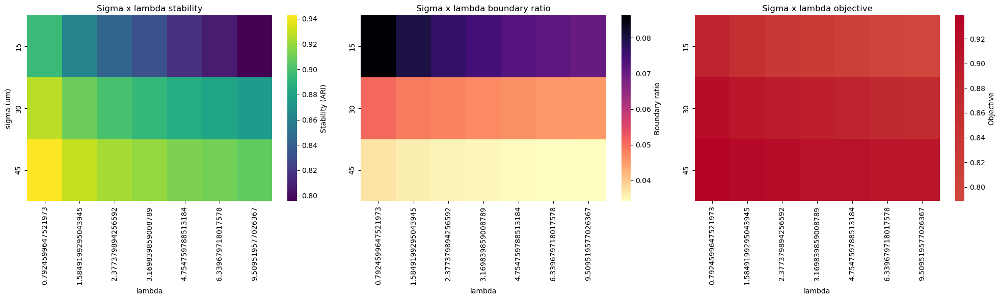

In [7]:
# ===========================================================================
# Sigma x lambda sensitivity curves (geometry-only) - optimized
#   - GMM covariance_type defaults to "diag" (fast)
#   - Precompute bootstrap subgraphs + pairwise overlap indices ONCE per sigma
#   - Lambda loop only runs solvers + ARI (no repeated subgraph extraction)
# ===========================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import adjusted_rand_score

if "grid_pd" not in globals():
    raise NameError("Missing grid_pd")
if "SIGMA_LIST_UM" not in globals() or "N_COMPONENTS" not in globals():
    raise NameError("Run clustering cell first")

required_helpers = [
    "build_grid_edges_vectorized",
    "compute_edge_weights",
    "edges_to_csr",
    "icm_multistart",
    "compute_total_energy",
    "boundary_ratio",
]
missing_helpers = [name for name in required_helpers if name not in globals()]
if missing_helpers:
    raise NameError("Missing helper(s): " + ", ".join(missing_helpers) + ". Run clustering cell first.")

RANDOM_SEED = int(globals().get("RANDOM_SEED", 412))
EDGE_CONNECTIVITY = int(globals().get("EDGE_CONNECTIVITY", 8))
ICM_RESTARTS = int(globals().get("ICM_RESTARTS", 6))
ICM_MAX_ITER = int(globals().get("ICM_MAX_ITER", 25))

# bootstrap/stability knobs for this sensitivity cell
STAB_RUNS = int(globals().get("SENS_STAB_RUNS", 6))         # number of subsample runs per (sigma, lambda)
STAB_FRAC = float(globals().get("SENS_STAB_FRAC", 0.80))    # subsample fraction
STAB_MIN_COMMON = int(globals().get("SENS_STAB_MIN_COMMON", 200))

# GMM covariance (fast default)
GMM_COV_SENS = str(globals().get("GMM_COV_SENS", globals().get("GMM_COVARIANCE_TYPE", "diag"))).lower()
if GMM_COV_SENS not in {"diag", "full", "tied", "spherical"}:
    GMM_COV_SENS = "diag"

sigma_list = [int(float(s)) for s in sorted(SIGMA_LIST_UM)]
if "lambda_eval_df" in globals() and isinstance(lambda_eval_df, pd.DataFrame) and (not lambda_eval_df.empty):
    lambda_grid = np.sort(lambda_eval_df["lambda"].astype(np.float32).unique())
else:
    lambda_grid = np.array([0.25, 0.5, 0.75, 1.0, 1.5, 2.0], dtype=np.float32)

rows = []

for sigma in sigma_list:
    cols = [f"rho_sigma_s{sigma}", f"z_std_all_sigma_s{sigma}", f"z_std_diff_enhanced_s{sigma}"]
    if any(c not in grid_pd.columns for c in cols):
        continue

    work = grid_pd[["x_bin", "y_bin", "confidence_weight"] + cols].dropna(subset=cols).reset_index(drop=True)
    if len(work) < max(200, 20 * int(N_COMPONENTS)):
        continue

    X = work[cols].to_numpy(np.float32)
    conf = np.clip(work["confidence_weight"].to_numpy(np.float32), 0.0, 1.0)
    X_scaled = StandardScaler().fit_transform(X).astype(np.float32, copy=False)

    # ----- GMM (once per sigma) -----
    gmm = GaussianMixture(
        n_components=int(N_COMPONENTS),
        covariance_type=str(GMM_COV_SENS),
        reg_covar=1e-6,
        random_state=RANDOM_SEED + int(sigma),
    )
    gmm.fit(X_scaled)
    resp = gmm.predict_proba(X_scaled).astype(np.float32, copy=False)

    D = (-np.log(resp + 1e-12)).astype(np.float32, copy=False)
    Dp = (conf[:, None] * D + (1.0 - conf[:, None]) * D.mean(axis=1, keepdims=True)).astype(np.float32, copy=False)
    raw = np.argmin(Dp, axis=1).astype(np.int32, copy=False)

    # ----- Graph build (once per sigma) -----
    bxy = work[["x_bin", "y_bin"]].to_numpy(np.int32, copy=False)
    ei, ej = build_grid_edges_vectorized(bxy, connectivity=int(EDGE_CONNECTIVITY))
    w, _ = compute_edge_weights(X_scaled, ei, ej)
    indptr, indices, weights = edges_to_csr(len(work), ei, ej, w)

    # ----- Precompute subsamples/subgraphs ONCE per sigma -----
    rng = np.random.default_rng(RANDOM_SEED + 10_000 + int(sigma))
    n = len(work)
    take = min(n, max(int(STAB_FRAC * n), max(5 * int(N_COMPONENTS), 300)))

    subs = []
    for r in range(int(STAB_RUNS)):
        idx = np.sort(rng.choice(n, size=take, replace=False)).astype(np.int32, copy=False)

        keep = np.zeros(n, dtype=bool)
        keep[idx] = True
        em = keep[ei] & keep[ej]
        if int(em.sum()) < max(200, 5 * int(N_COMPONENTS)):
            continue

        rem = np.full(n, -1, dtype=np.int32)
        rem[idx] = np.arange(len(idx), dtype=np.int32)

        sei = rem[ei[em]]
        sej = rem[ej[em]]
        sw = w[em].astype(np.float32, copy=False)

        sindptr, sindices, sweights = edges_to_csr(len(idx), sei.astype(int), sej.astype(int), sw)
        subs.append(
            {
                "idx": idx,
                "indptr": sindptr,
                "indices": sindices,
                "weights": sweights,
                "raw_sub": raw[idx].astype(np.int32, copy=False),
            }
        )

    # pairwise overlap indices cached (so we don't intersect every lambda)
    overlap_pairs = []
    for i in range(len(subs)):
        ia = subs[i]["idx"]
        for j in range(i + 1, len(subs)):
            ib = subs[j]["idx"]
            common, a, b = np.intersect1d(ia, ib, return_indices=True)
            if int(common.size) >= int(STAB_MIN_COMMON):
                overlap_pairs.append((i, j, a.astype(np.int32, copy=False), b.astype(np.int32, copy=False)))

    # If subsampling failed (rare), we still compute energy/boundary and skip stability
    have_stab = (len(subs) >= 2) and (len(overlap_pairs) >= 1)

    # ----- Lambda loop (cheap: just solve, no more subgraph extraction) -----
    for lam in lambda_grid.tolist():
        lam = float(lam)

        labels, _ = icm_multistart(
            Dp, indptr, indices, weights,
            lam,
            max(3, ICM_RESTARTS // 2),
            max(8, ICM_MAX_ITER // 2),
            RANDOM_SEED + int(1000 * lam) + int(sigma),
            init_labels=raw,
        )

        de, se, te = compute_total_energy(labels, Dp, ei, ej, w, lam)
        br = boundary_ratio(labels, ei, ej, w)

        st = np.nan
        if have_stab:
            sub_labels = []
            for r, s in enumerate(subs):
                lsub, _ = icm_multistart(
                    Dp[s["idx"]],
                    s["indptr"],
                    s["indices"],
                    s["weights"],
                    lam,
                    2,
                    10,
                    RANDOM_SEED + 20_000 + int(sigma) + int(1000 * lam) + int(r),
                    init_labels=s["raw_sub"],
                )
                sub_labels.append(lsub.astype(np.int32, copy=False))

            aris = []
            for (i, j, a, b) in overlap_pairs:
                aris.append(adjusted_rand_score(sub_labels[i][a], sub_labels[j][b]))
            st = float(np.mean(aris)) if aris else np.nan

        rows.append(
            {
                "sigma_um": int(sigma),
                "lambda": float(lam),
                "stability": st,
                "boundary_ratio": float(br),
                "data_energy": float(de),
                "smooth_energy": float(se),
                "total_energy": float(te),
                "objective": float(st - 0.1 * br) if np.isfinite(st) else np.nan,
                "gmm_cov": str(GMM_COV_SENS),
                "n_points": int(n),
                "n_edges": int(len(ei)),
                "n_stab_runs": int(len(subs)),
            }
        )

sigma_lambda_df = pd.DataFrame(rows)
if sigma_lambda_df.empty:
    raise ValueError("No sigma-lambda sensitivity results generated")

print("=" * 70)
print("Sigma x lambda sensitivity summary (optimized)")
print("=" * 70)
print(sigma_lambda_df.head(20).to_string(index=False))
print("=" * 70)

stab_mat = sigma_lambda_df.pivot(index="sigma_um", columns="lambda", values="stability")
bnd_mat = sigma_lambda_df.pivot(index="sigma_um", columns="lambda", values="boundary_ratio")
obj_mat = sigma_lambda_df.pivot(index="sigma_um", columns="lambda", values="objective")

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
sns.heatmap(stab_mat, cmap="viridis", ax=axes[0], cbar_kws={"label": "Stability (ARI)"})
axes[0].set_title("Sigma x lambda stability")
axes[0].set_xlabel("lambda")
axes[0].set_ylabel("sigma (um)")

sns.heatmap(bnd_mat, cmap="magma_r", ax=axes[1], cbar_kws={"label": "Boundary ratio"})
axes[1].set_title("Sigma x lambda boundary ratio")
axes[1].set_xlabel("lambda")
axes[1].set_ylabel("")

sns.heatmap(obj_mat, cmap="coolwarm", center=0, ax=axes[2], cbar_kws={"label": "Objective"})
axes[2].set_title("Sigma x lambda objective")
axes[2].set_xlabel("lambda")
axes[2].set_ylabel("")

plt.tight_layout()
plt.show()

In [23]:
# Geometry-only classification leakage guard + compare cluster selector
if "CLASSIFICATION_GEOMETRY_ONLY" not in globals() or not bool(CLASSIFICATION_GEOMETRY_ONLY):
    raise AssertionError("Classification stage must be geometry-only.")
if "CLASSIFICATION_FEATURE_COLUMNS" not in globals():
    raise NameError("Missing CLASSIFICATION_FEATURE_COLUMNS; run clustering cell first.")

_banned = ("gene", "feature_name", "marker", "pathway", "cpm", "expr", "embedding", "cell_type")
_leak = [c for c in CLASSIFICATION_FEATURE_COLUMNS if any(tok in str(c).lower() for tok in _banned)]
if _leak:
    raise AssertionError(f"Feature leakage detected in classification inputs: {_leak[:10]}")

if "grid_pd" not in globals():
    raise NameError("Missing grid_pd; run clustering cell first.")
if "get_compare_context" not in globals():
    raise NameError("Missing get_compare_context; run clustering cell first.")

valid_clusters = sorted(int(v) for v in np.unique(grid_pd["cluster_sorted"].to_numpy(np.int32)) if int(v) >= 0)
if len(valid_clusters) < 2:
    raise ValueError("Need at least two valid clusters for downstream biological validation.")

SELECT_CLUSTER_A = int(globals().get("SELECT_CLUSTER_A", globals().get("COMPARE_CLUSTER_A", valid_clusters[-2])))
SELECT_CLUSTER_B = int(globals().get("SELECT_CLUSTER_B", globals().get("COMPARE_CLUSTER_B", valid_clusters[-1])))

if SELECT_CLUSTER_A == SELECT_CLUSTER_B:
    raise ValueError("SELECT_CLUSTER_A and SELECT_CLUSTER_B must be different.")
if SELECT_CLUSTER_A not in valid_clusters or SELECT_CLUSTER_B not in valid_clusters:
    raise ValueError(
        f"Selected clusters must be in valid clusters: {valid_clusters}. "
        f"Got A={SELECT_CLUSTER_A}, B={SELECT_CLUSTER_B}."
    )

COMPARE_CLUSTER_A = int(SELECT_CLUSTER_A)
COMPARE_CLUSTER_B = int(SELECT_CLUSTER_B)
COMPARE_CONTEXT = get_compare_context()
ctx = COMPARE_CONTEXT

_sizes = grid_pd.loc[grid_pd["cluster_sorted"].isin([COMPARE_CLUSTER_A, COMPARE_CLUSTER_B]), "cluster_sorted"].value_counts().to_dict()
print("=" * 70)
print("Compare cluster selection")
print("=" * 70)
print(f"Selected cluster A: {COMPARE_CLUSTER_A} (n={int(_sizes.get(COMPARE_CLUSTER_A, 0)):,})")
print(f"Selected cluster B: {COMPARE_CLUSTER_B} (n={int(_sizes.get(COMPARE_CLUSTER_B, 0)):,})")
print(f"Region A/B: {ctx['region_a']} vs {ctx['region_b']}")
print("=" * 70)


Compare cluster selection
Selected cluster A: 6 (n=53,517)
Selected cluster B: 7 (n=62,386)
Region A/B: Cluster 6 vs Cluster 7


In [24]:
# ===========================================================================
# Grid-level count matrix, marker ranking, and differential expression
# 网格级计数矩阵、标记基因排序与差异表达
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
import polars as pl
from scipy import stats
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Configuration
# 配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
CLUSTER_A, CLUSTER_B = ctx["cluster_a"], ctx["cluster_b"]
GROUP_A, GROUP_B = ctx["group_a"], ctx["group_b"]
CPM_COL_A, CPM_COL_B = ctx["cpm_col_a"], ctx["cpm_col_b"]

MARKER_TOP_N = 20

DISPLAY_LFC_THRESHOLD = 1.0
DISPLAY_PCT_THRESHOLD = 0.20
DISPLAY_FDR_THRESHOLD = 0.05

DGE_FC_THRESHOLD = 0.25
DGE_MEAN_CPM_THRESHOLD = 5.0
DGE_Q_THRESHOLD = 0.05

PSEUDOCOUNT = 1.0

# ---------------------------------------------------------------------------
# Grid count matrix construction (all clustered grids)
# 网格计数矩阵构建（覆盖所有已聚类网格）
# ---------------------------------------------------------------------------
print("=" * 70)
print("Building grid-level count matrix and CPM")
print("=" * 70)

valid_grids = grid_pd.loc[grid_pd["cluster_sorted"] >= 0, ["x_bin", "y_bin", "cluster_sorted", "region"]].copy()

if "df_binned" not in globals():
    df_binned = df.with_columns(
        (pl.col("x_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("x_bin"),
        (pl.col("y_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("y_bin"),
    )

df_binned_lf = df_binned.lazy() if isinstance(df_binned, pl.DataFrame) else df_binned
valid_grids_pl = pl.from_pandas(valid_grids[["x_bin", "y_bin", "cluster_sorted"]])

counts_all = (
    df_binned_lf
    .join(valid_grids_pl.lazy(), on=["x_bin", "y_bin"], how="inner")
    .group_by(["x_bin", "y_bin", "cluster_sorted", "feature_name"])
    .agg(pl.len().alias("count"))
    .collect()
    .to_pandas()
)

grid_matrix = (
    counts_all
    .pivot(index=["x_bin", "y_bin", "cluster_sorted"], columns="feature_name", values="count")
    .fillna(0)
)

lib_size = grid_matrix.sum(axis=1)
grid_cpm = grid_matrix.div(lib_size.replace(0, np.nan), axis=0).fillna(0) * 1e6

n_grids = len(grid_matrix)
n_genes = grid_matrix.shape[1]
gene_names = grid_matrix.columns.tolist()
print(f"Grid matrix: {n_grids:,} grids x {n_genes:,} genes")

# ---------------------------------------------------------------------------
# Per-cluster marker ranking (vectorized Wilcoxon, one-vs-rest)
# 逐簇标记基因排序（向量化 Wilcoxon，一对其余）
# ---------------------------------------------------------------------------
print("-" * 70)
print(f"Running per-cluster marker ranking (method=Wilcoxon, top_n={MARKER_TOP_N})")
print("-" * 70)

cluster_ids = sorted(grid_matrix.index.get_level_values("cluster_sorted").unique().tolist())

grid_log1p = np.log1p(grid_cpm)

# Pre-extract numpy arrays for speed.
# 预提取 numpy 数组以加速。
grid_log1p_vals = grid_log1p.values
grid_cpm_vals = grid_cpm.values
grid_matrix_vals = grid_matrix.values
cluster_index = grid_matrix.index.get_level_values("cluster_sorted").values

marker_table_data = {}

for cid in cluster_ids:
    in_mask = cluster_index == cid
    out_mask = ~in_mask

    n_in = int(in_mask.sum())
    n_out = int(out_mask.sum())
    if n_in < 3 or n_out < 3:
        continue

    in_log1p = grid_log1p_vals[in_mask]   # (n_in, n_genes)
    out_log1p = grid_log1p_vals[out_mask]  # (n_out, n_genes)

    # Vectorized Mann-Whitney U across all genes at once.
    # 向量化 Mann-Whitney U，一次处理所有基因。
    _, p_vals = stats.mannwhitneyu(in_log1p, out_log1p, alternative="two-sided", axis=0)
    u_greater, _ = stats.mannwhitneyu(in_log1p, out_log1p, alternative="greater", axis=0)
    scores = (u_greater / (n_in * n_out) - 0.5) * 2.0

    # Vectorized means, log2FC, pct.
    # 向量化计算均值、log2FC、表达比例。
    cpm_in_mean = grid_cpm_vals[in_mask].mean(axis=0)
    cpm_out_mean = grid_cpm_vals[out_mask].mean(axis=0)
    log2fc = np.log2((cpm_in_mean + PSEUDOCOUNT) / (cpm_out_mean + PSEUDOCOUNT))
    pct = (grid_matrix_vals[in_mask] > 0).mean(axis=0)
    mean_log1p_in = in_log1p.mean(axis=0)
    mean_log1p_out = out_log1p.mean(axis=0)

    # Handle zero-variance genes: set p=1.0.
    # 处理零方差基因：p 设为 1.0。
    var_in = in_log1p.var(axis=0)
    var_out = out_log1p.var(axis=0)
    zero_var_mask = (var_in == 0.0) & (var_out == 0.0)
    p_vals[zero_var_mask] = 1.0

    cluster_df = pd.DataFrame({
        "gene": gene_names,
        "score": scores,
        "log2fc": log2fc,
        "pct": pct,
        "pval": p_vals,
        "mean_log1p_in": mean_log1p_in,
        "mean_log1p_out": mean_log1p_out,
    })

    _, qvals, _, _ = multipletests(cluster_df["pval"].fillna(1.0), method="fdr_bh")
    cluster_df["fdr"] = qvals
    cluster_df = cluster_df.sort_values("score", ascending=False).reset_index(drop=True)

    top = cluster_df.head(MARKER_TOP_N)
    formatted_rows = []
    for _, row in top.iterrows():
        lfc_flag = f" [LFC>{DISPLAY_LFC_THRESHOLD}]" if row["log2fc"] > DISPLAY_LFC_THRESHOLD else ""
        pct_flag = f" [PCT>{DISPLAY_PCT_THRESHOLD}]" if row["pct"] > DISPLAY_PCT_THRESHOLD else ""
        fdr_flag = f" [FDR<{DISPLAY_FDR_THRESHOLD}]" if row["fdr"] < DISPLAY_FDR_THRESHOLD else ""

        row_text = (
            f"{row['gene']}{lfc_flag}{pct_flag}{fdr_flag}\n"
            f"(LFC:{row['log2fc']:.2f}, Score:{row['score']:.2f}, "
            f"PCT:{row['pct']:.2f}, FDR:{row['fdr']:.2e})"
        )
        formatted_rows.append(row_text)

    marker_table_data[f"Cluster {cid}"] = formatted_rows

df_markers = pd.DataFrame(marker_table_data)
df_markers.index = [f"Rank {i + 1}" for i in range(MARKER_TOP_N)]

pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", 1000)
pd.set_option("display.max_columns", None)

print(f"Top {MARKER_TOP_N} markers per cluster (ordered by score)")
print(
    "Metrics: LFC=log2 fold change; Score=normalized U statistic; "
    "PCT=expression fraction in cluster; FDR=BH-adjusted p-value"
)
print(
    f"Flags: [LFC>{DISPLAY_LFC_THRESHOLD}], "
    f"[PCT>{DISPLAY_PCT_THRESHOLD}], "
    f"[FDR<{DISPLAY_FDR_THRESHOLD}] (display annotations)"
)
print("-" * 100)

try:
    from tabulate import tabulate
    print(
        tabulate(
            df_markers,
            headers="keys",
            tablefmt="grid",
            stralign="left",
            showindex=True,
            maxcolwidths=[None] * (len(df_markers.columns) + 1),
        )
    )
except ImportError:
    print(df_markers.to_string())

# ---------------------------------------------------------------------------
# Pairwise DGE between compare clusters (vectorized)
# 对比簇之间的差异表达（向量化）
# ---------------------------------------------------------------------------
print("=" * 70)
print(f"Pairwise DGE: {GROUP_A} vs {GROUP_B}")
print("=" * 70)

idx = grid_cpm.index.get_level_values("cluster_sorted")
cpm_a = grid_cpm.loc[idx == CLUSTER_A]
cpm_b = grid_cpm.loc[idx == CLUSTER_B]

if len(cpm_a) == 0 or len(cpm_b) == 0:
    raise ValueError(f"Empty compare groups: {GROUP_A}={len(cpm_a)}, {GROUP_B}={len(cpm_b)}")

print(f"Grid count: {GROUP_A}={len(cpm_a):,}, {GROUP_B}={len(cpm_b):,}")
print(f"Running Mann-Whitney U on {n_genes:,} genes...")

x_mat = cpm_a.values  # (n_a, n_genes)
y_mat = cpm_b.values  # (n_b, n_genes)

mean_a_arr = x_mat.mean(axis=0)
mean_b_arr = y_mat.mean(axis=0)
log2fc_arr = np.log2((mean_a_arr + PSEUDOCOUNT) / (mean_b_arr + PSEUDOCOUNT))

# Vectorized Mann-Whitney U.
# 向量化 Mann-Whitney U。
_, p_arr = stats.mannwhitneyu(x_mat, y_mat, alternative="two-sided", axis=0)

# Handle zero-variance genes.
# 处理零方差基因。
var_x = x_mat.var(axis=0)
var_y = y_mat.var(axis=0)
p_arr[(var_x == 0.0) & (var_y == 0.0)] = 1.0

dge_results = pd.DataFrame({
    CPM_COL_A: mean_a_arr,
    CPM_COL_B: mean_b_arr,
    "Mean_CPM": 0.5 * (mean_a_arr + mean_b_arr),
    "log2FC": log2fc_arr,
    "pval": p_arr,
}, index=gene_names)
dge_results.index.name = "feature_name"

_, qvals, _, _ = multipletests(dge_results["pval"].fillna(1.0), method="fdr_bh")
dge_results["qval"] = qvals
dge_results["nlog10_qval"] = -np.log10(dge_results["qval"] + 1e-300)

dge_results["is_stat_sig"] = dge_results["qval"] < DGE_Q_THRESHOLD
dge_results["is_practical_sig"] = (
    dge_results["is_stat_sig"]
    & (dge_results["log2FC"].abs() >= DGE_FC_THRESHOLD)
    & (dge_results["Mean_CPM"] >= DGE_MEAN_CPM_THRESHOLD)
)

grid_pd["dge_group"] = np.where(
    grid_pd["cluster_sorted"] == CLUSTER_A,
    GROUP_A,
    np.where(grid_pd["cluster_sorted"] == CLUSTER_B, GROUP_B, ""),
)

# ---------------------------------------------------------------------------
# DGE summary
# 差异表达汇总
# ---------------------------------------------------------------------------
dge_practical = dge_results.loc[dge_results["is_practical_sig"]].copy()
n_up = int((dge_practical["log2FC"] > 0).sum())
n_down = int((dge_practical["log2FC"] < 0).sum())

top_a = dge_practical.sort_values("log2FC", ascending=False).head(MARKER_TOP_N)
top_b = dge_practical.sort_values("log2FC", ascending=True).head(MARKER_TOP_N)

summary = (
    pd.concat([top_a, top_b])
    .reset_index()
    .drop_duplicates(subset=["feature_name"], keep="first")
)
summary["Direction"] = np.where(summary["log2FC"] > 0, GROUP_A, GROUP_B)
summary["q-value"] = summary["qval"].apply(
    lambda q: f"{q:.2e}" if q > 1e-300 else "< 1e-300"
)

dge_summary = summary[
    ["feature_name", "Direction", "log2FC", "Mean_CPM", CPM_COL_A, CPM_COL_B, "q-value"]
].rename(columns={"feature_name": "Gene"})

for c in ["log2FC", "Mean_CPM", CPM_COL_A, CPM_COL_B]:
    dge_summary[c] = dge_summary[c].round(2)

print(f"Thresholds: |log2FC| >= {DGE_FC_THRESHOLD}, Mean_CPM >= {DGE_MEAN_CPM_THRESHOLD}, FDR < {DGE_Q_THRESHOLD}")
print(f"Genes passing thresholds: {int(dge_results['is_practical_sig'].sum())} ({n_up} up in {GROUP_A}, {n_down} up in {GROUP_B})")
print("-" * 70)
print(f"Top markers for {GROUP_A}:")
if not top_a.empty:
    print(dge_summary.loc[dge_summary["Direction"] == GROUP_A].to_string(index=False))
else:
    print("  (none)")
print("-" * 70)
print(f"Top markers for {GROUP_B}:")
if not top_b.empty:
    print(dge_summary.loc[dge_summary["Direction"] == GROUP_B].to_string(index=False))
else:
    print("  (none)")
print("=" * 70)


Building grid-level count matrix and CPM
Grid matrix: 387,778 grids x 321 genes
----------------------------------------------------------------------
Running per-cluster marker ranking (method=Wilcoxon, top_n=20)
----------------------------------------------------------------------
Top 20 markers per cluster (ordered by score)
Metrics: LFC=log2 fold change; Score=normalized U statistic; PCT=expression fraction in cluster; FDR=BH-adjusted p-value
Flags: [LFC>1.0], [PCT>0.2], [FDR<0.05] (display annotations)
----------------------------------------------------------------------------------------------------
                                                                                      Cluster 0                                                                              Cluster 1                                                                     Cluster 2                                                                             Cluster 3                                       

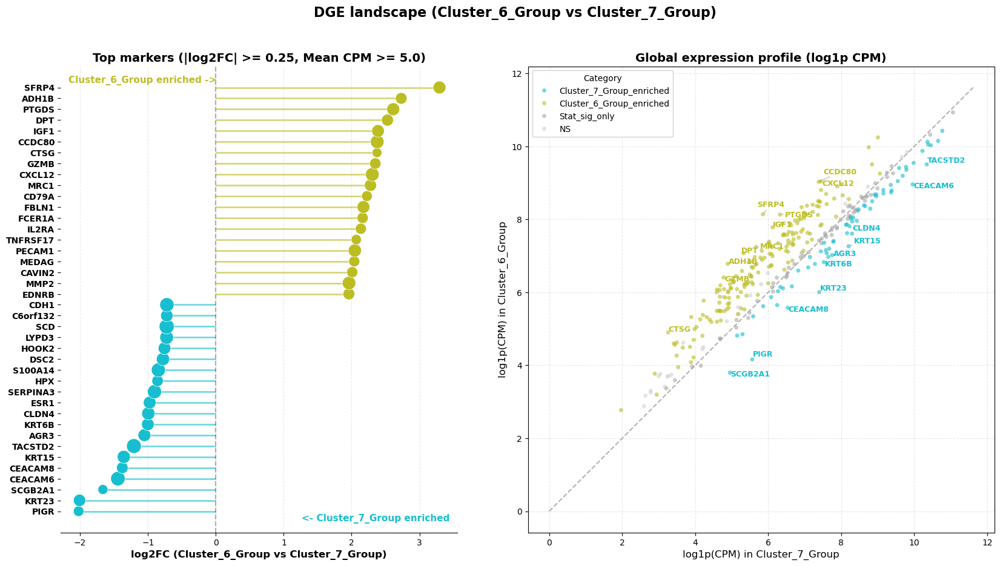

In [25]:
# ===========================================================================
# DGE visualization (lollipop + expression scatter)
# 差异表达可视化（棒棒糖图 + 表达散点图）
# ===========================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from adjustText import adjust_text

# ---------------------------------------------------------------------------
# Context and thresholds
# 上下文与阈值
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]
colA, colB = ctx["cpm_col_a"], ctx["cpm_col_b"]

# Visualization thresholds (should match or be looser than DGE thresholds).
# 可视化阈值（应与 DGE 阈值一致或更宽松）。
FC_THRESH_VIS = DGE_FC_THRESHOLD
MEAN_CPM_THRESH_VIS = DGE_MEAN_CPM_THRESHOLD
Q_THRESH_VIS = DGE_Q_THRESHOLD

# Number of top genes to show per direction.
# 每个方向展示的基因数。
TOP_N_VIS = 20

# Number of gene labels on scatter plot per direction.
# 散点图上每个方向标注的基因数。
LABEL_N_VIS = 10

# ---------------------------------------------------------------------------
# Input check
# 输入检查
# ---------------------------------------------------------------------------
req = {"log2FC", "qval", "Mean_CPM", colA, colB}
miss = req - set(dge_results.columns)
if miss:
    raise ValueError(f"dge_results missing columns: {sorted(miss)}")

# ---------------------------------------------------------------------------
# Gene categorization
# 基因分类
# ---------------------------------------------------------------------------
is_stat = dge_results["qval"] < Q_THRESH_VIS
is_eff = dge_results["log2FC"].abs() >= FC_THRESH_VIS
is_abund = dge_results["Mean_CPM"] >= MEAN_CPM_THRESH_VIS
is_prac = is_stat & is_eff & is_abund

catA = f"{gA}_enriched"
catB = f"{gB}_enriched"

cat = np.full(len(dge_results), "NS", dtype=object)
cat[is_stat.to_numpy()] = "Stat_sig_only"
cat[(is_prac & (dge_results["log2FC"] > 0)).to_numpy()] = catA
cat[(is_prac & (dge_results["log2FC"] < 0)).to_numpy()] = catB

dge_vis = dge_results.copy()
dge_vis["category"] = cat

topA = dge_vis.loc[dge_vis["category"] == catA].sort_values("log2FC", ascending=False).head(TOP_N_VIS)
topB = dge_vis.loc[dge_vis["category"] == catB].sort_values("log2FC", ascending=True).head(TOP_N_VIS)

plot_data = (
    pd.concat([topA, topB])
    .reset_index()
    .rename(columns={"feature_name": "Gene"})
    .sort_values("log2FC")
)

# ---------------------------------------------------------------------------
# Figure
# 作图
# ---------------------------------------------------------------------------
fig = plt.figure(figsize=(20, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 1.2], wspace=0.15)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])

# Left: lollipop chart of top markers.
# 左：排名靠前的标记基因棒棒糖图。
if not plot_data.empty:
    y = np.arange(len(plot_data))
    colors = [cB if v < 0 else cA for v in plot_data["log2FC"]]

    ax0.hlines(y=y, xmin=0, xmax=plot_data["log2FC"], color=colors, alpha=0.6, linewidth=2)
    sizes = np.log1p(plot_data["Mean_CPM"]) * 30.0
    ax0.scatter(
        plot_data["log2FC"], y,
        color=colors, s=sizes, edgecolors="white", linewidth=0.5, zorder=3,
    )

    ax0.axvline(0, color="black", alpha=0.3, linestyle="--")
    ax0.set_yticks(y)
    ax0.set_yticklabels(plot_data["Gene"], fontsize=10, fontweight="bold")
    ax0.set_xlabel(f"log2FC ({gA} vs {gB})", fontsize=12, fontweight="bold")
    ax0.set_title(
        f"Top markers (|log2FC| >= {FC_THRESH_VIS}, Mean CPM >= {MEAN_CPM_THRESH_VIS})",
        fontsize=14,
        fontweight="bold",
    )

    ax0.text(0.02, 0.98, f"{gA} enriched ->", transform=ax0.transAxes, color=cA, ha="left", va="top", fontsize=11, fontweight="bold")
    ax0.text(0.98, 0.02, f"<- {gB} enriched", transform=ax0.transAxes, color=cB, ha="right", va="bottom", fontsize=11, fontweight="bold")

    for sp in ["top", "right", "left"]:
        ax0.spines[sp].set_visible(False)
    ax0.grid(axis="x", linestyle="--", alpha=0.3)
else:
    ax0.text(0.5, 0.5, "No genes passed thresholds", ha="center", va="center", fontsize=14)

# Right: scatter plot of mean CPM per group.
# 右：各组均值 CPM 散点图。
pdf = dge_vis.copy()
pdf["x_val"] = np.log1p(pdf[colB])
pdf["y_val"] = np.log1p(pdf[colA])

palette = {
    catA: cA,
    catB: cB,
    "Stat_sig_only": "darkgray",
    "NS": "lightgray",
}

sns.scatterplot(
    data=pdf, x="x_val", y="y_val", hue="category",
    palette=palette, s=20, alpha=0.6, edgecolor=None,
    ax=ax1, legend=True, rasterized=True,
)

lim = max(pdf["x_val"].max(), pdf["y_val"].max()) * 1.05
ax1.plot([0, lim], [0, lim], "k--", alpha=0.3, zorder=0)

texts = []
for _, row in topA.head(LABEL_N_VIS).iterrows():
    if row["Mean_CPM"] >= MEAN_CPM_THRESH_VIS:
        texts.append(ax1.text(np.log1p(row[colB]), np.log1p(row[colA]), row.name, color=cA, fontsize=9, fontweight="bold"))

for _, row in topB.head(LABEL_N_VIS).iterrows():
    if row["Mean_CPM"] >= MEAN_CPM_THRESH_VIS:
        texts.append(ax1.text(np.log1p(row[colB]), np.log1p(row[colA]), row.name, color=cB, fontsize=9, fontweight="bold"))

if texts:
    adjust_text(texts, ax=ax1, arrowprops=dict(arrowstyle="-", color="gray", alpha=0.5))

ax1.set_title("Global expression profile (log1p CPM)", fontsize=14, fontweight="bold")
ax1.set_xlabel(f"log1p(CPM) in {gB}", fontsize=12)
ax1.set_ylabel(f"log1p(CPM) in {gA}", fontsize=12)
ax1.legend(loc="upper left", fontsize=10, framealpha=0.9, title="Category")
ax1.grid(True, linestyle="--", alpha=0.3)
ax1.set_aspect("equal")

fig.suptitle(
    f"DGE landscape ({gA} vs {gB})",
    fontsize=16,
    fontweight="bold",
    y=0.98,
)
plt.tight_layout()
plt.show()


Multi-scale biological validation setup
Compare clusters: 6 vs 7
Compare groups  : Cluster_6_Group vs Cluster_7_Group
Sigma scales    : [15, 30, 45]
Gene count      : 75 (top sig + manual)
[scale 15] done: genes=75, grids=(90974,53782)
[scale 30] done: genes=75, grids=(44682,60597)
[scale 45] done: genes=75, grids=(40384,62192)
Multi-scale DGE summary
Scales completed : [15, 30, 45]
Rows in res_df   : 225
Genes in plot_df : 75


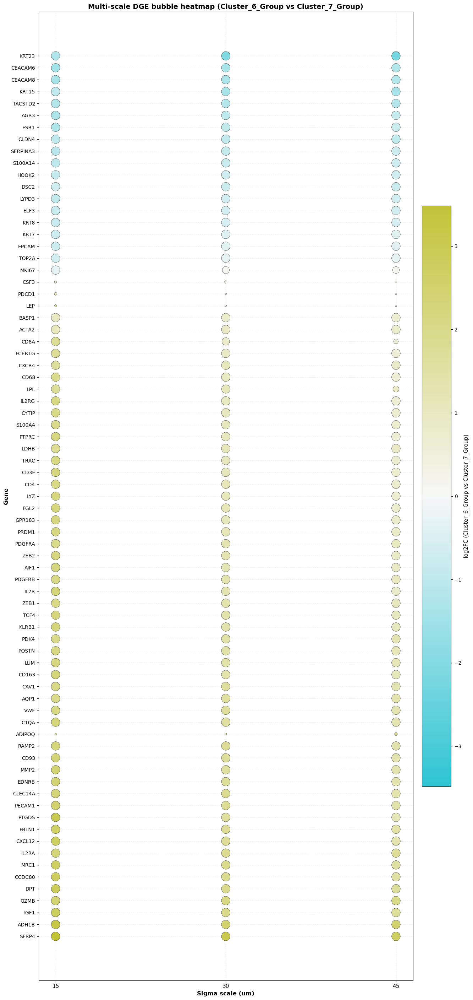

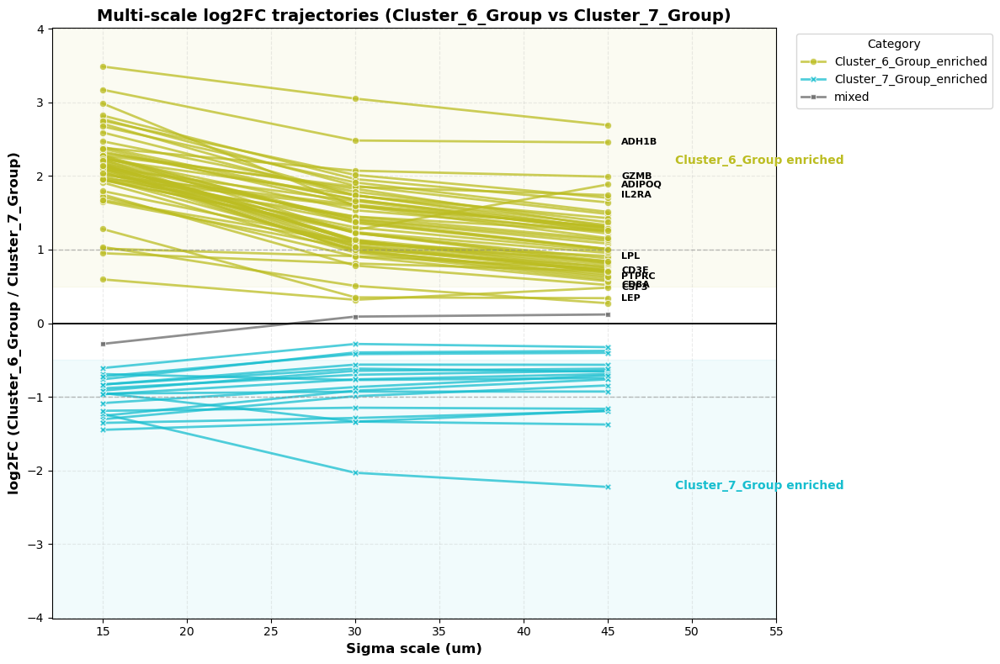

In [26]:
# ===========================================================================
# Multi-scale biological validation (real per-scale DGE)
# ===========================================================================

import numpy as np
import pandas as pd
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.multitest import multipletests
from matplotlib.colors import Normalize

ctx = get_compare_context()
cluster_a, cluster_b = int(ctx["cluster_a"]), int(ctx["cluster_b"])
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]
colA, colB = ctx["cpm_col_a"], ctx["cpm_col_b"]

SIG_GENE_TOP_N = 60
CATEGORY_FC_THRESHOLD = 0.25
MIN_GRIDS_PER_SCALE = 100
MIN_GRIDS_PER_GROUP = 25
MAX_SCORE_VIS = 50.0

MANUAL_CANDIDATE_GENES = [
    "ADIPOQ", "LEP", "LPL", "ADH1B",
    "GZMB", "IL2RA", "CSF3", "PTPRC", "CD3E", "CD8A", "PDCD1",
    "EPCAM", "KRT8", "KRT7", "ELF3",
    "MKI67", "TOP2A", "PCNA", "VIM", "FN1",
]

required_globals = ["grid_pd", "df_binned", "SIGMA_LIST_UM", "N_COMPONENTS", "RANDOM_SEED", "dge_results"]
missing_globals = [name for name in required_globals if name not in globals()]
if missing_globals:
    raise NameError("Missing required globals: " + ", ".join(missing_globals) + ". Run previous cells first.")
if "PSEUDOCOUNT" not in globals():
    raise NameError("Missing PSEUDOCOUNT from DGE cell.")

req_dge_cols = {"qval", "log2FC", "Mean_CPM"}
miss_dge_cols = req_dge_cols - set(dge_results.columns)
if miss_dge_cols:
    raise ValueError(f"dge_results missing required columns: {sorted(miss_dge_cols)}")

dge_rank = dge_results.copy()
dge_rank["abs_log2FC"] = dge_rank["log2FC"].abs()
sig_tbl = dge_rank.loc[
    (dge_rank["qval"] < float(globals().get("DGE_Q_THRESHOLD", 0.05)))
    & (dge_rank["Mean_CPM"] >= float(globals().get("DGE_MEAN_CPM_THRESHOLD", 5.0)))
].sort_values(["qval", "abs_log2FC"], ascending=[True, False])
sig_genes = sig_tbl.index.astype(str).tolist()[: int(SIG_GENE_TOP_N)]

if isinstance(df_binned, pl.DataFrame):
    df_binned_lf = df_binned.lazy()
    available_genes = set(df_binned["feature_name"].unique().to_list())
else:
    df_binned_lf = df_binned
    available_genes = set(df_binned_lf.select(pl.col("feature_name").unique()).collect().to_series().to_list())

genes = []
_seen = set()
for g in sig_genes + MANUAL_CANDIDATE_GENES:
    gs = str(g)
    if gs in available_genes and gs not in _seen:
        genes.append(gs)
        _seen.add(gs)
if not genes:
    raise ValueError("No genes available for multi-scale DGE (after top-N + manual candidate filtering).")

print("=" * 72)
print("Multi-scale biological validation setup")
print("=" * 72)
print(f"Compare clusters: {cluster_a} vs {cluster_b}")
print(f"Compare groups  : {gA} vs {gB}")
print(f"Sigma scales    : {[int(float(s)) for s in SIGMA_LIST_UM]}")
print(f"Gene count      : {len(genes)} (top sig + manual)")
print("=" * 72)

rows = []
scales_done = []
cov_type = str(ctx.get("gmm_covariance_type", "diag"))

for sigma in sorted(int(float(s)) for s in SIGMA_LIST_UM):
    cols = [f"rho_sigma_s{sigma}", f"z_std_all_sigma_s{sigma}", f"z_std_diff_enhanced_s{sigma}"]
    if any(c not in grid_pd.columns for c in cols):
        print(f"[scale {sigma}] skipped: missing columns")
        continue

    work = grid_pd[["x_bin", "y_bin", "transcript_count"] + cols].dropna(subset=cols).reset_index(drop=True)
    if len(work) < MIN_GRIDS_PER_SCALE:
        print(f"[scale {sigma}] skipped: too few grids ({len(work)})")
        continue

    X = work[cols].to_numpy(np.float32)
    Xs = StandardScaler().fit_transform(X).astype(np.float32, copy=False)

    gmm = GaussianMixture(
        n_components=int(N_COMPONENTS),
        covariance_type=cov_type,
        reg_covar=1e-6,
        random_state=int(RANDOM_SEED + sigma),
    )
    work["cluster_raw"] = gmm.fit_predict(Xs).astype(np.int32)

    rank = work.groupby("cluster_raw")["transcript_count"].median().sort_values()
    remap = {int(old): int(new) for new, old in enumerate(rank.index.tolist())}
    work["cluster_sorted"] = work["cluster_raw"].map(remap).astype(np.int32)

    comp = work.loc[
        work["cluster_sorted"].isin([cluster_a, cluster_b]),
        ["x_bin", "y_bin", "transcript_count", "cluster_sorted"],
    ].copy()
    if comp.empty:
        print(f"[scale {sigma}] skipped: compare clusters absent")
        continue

    comp["dge_group"] = np.where(comp["cluster_sorted"] == cluster_a, gA, gB)
    n_a = int((comp["dge_group"] == gA).sum())
    n_b = int((comp["dge_group"] == gB).sum())
    if n_a < MIN_GRIDS_PER_GROUP or n_b < MIN_GRIDS_PER_GROUP:
        print(f"[scale {sigma}] skipped: too few compare grids ({gA}={n_a}, {gB}={n_b})")
        continue

    comp_pl = pl.from_pandas(comp[["x_bin", "y_bin", "dge_group", "transcript_count"]])
    counts_scale = (
        df_binned_lf
        .filter(pl.col("feature_name").is_in(genes))
        .join(comp_pl.lazy(), on=["x_bin", "y_bin"], how="inner")
        .group_by(["x_bin", "y_bin", "dge_group", "transcript_count", "feature_name"])
        .agg(pl.len().alias("gene_count"))
        .collect()
        .to_pandas()
    )
    if counts_scale.empty:
        print(f"[scale {sigma}] skipped: no gene counts after join")
        continue

    mat = (
        counts_scale
        .pivot(index=["x_bin", "y_bin", "dge_group", "transcript_count"], columns="feature_name", values="gene_count")
        .fillna(0)
    )

    gene_cols = [g for g in genes if g in mat.columns]
    if not gene_cols:
        print(f"[scale {sigma}] skipped: no overlap genes in pivot")
        continue

    meta = mat.index.to_frame(index=False)
    lib = meta["transcript_count"].to_numpy(np.float32)
    cpm = mat[gene_cols].div(lib, axis=0).fillna(0.0) * 1e6

    grp = meta["dge_group"].astype(str).to_numpy()
    x_mat = cpm.loc[grp == gA].to_numpy(np.float32)
    y_mat = cpm.loc[grp == gB].to_numpy(np.float32)

    if len(x_mat) < MIN_GRIDS_PER_GROUP or len(y_mat) < MIN_GRIDS_PER_GROUP:
        print(f"[scale {sigma}] skipped: insufficient matrices after CPM")
        continue

    mean_a = x_mat.mean(axis=0)
    mean_b = y_mat.mean(axis=0)
    log2fc = np.log2((mean_a + float(PSEUDOCOUNT)) / (mean_b + float(PSEUDOCOUNT)))

    _, p_arr = stats.mannwhitneyu(x_mat, y_mat, alternative="two-sided", axis=0)
    var_x = x_mat.var(axis=0)
    var_y = y_mat.var(axis=0)
    p_arr[(var_x == 0.0) & (var_y == 0.0)] = 1.0
    p_arr = np.where(np.isnan(p_arr), 1.0, p_arr)

    for j, gene in enumerate(gene_cols):
        rows.append({
            "scale_um": int(sigma),
            "gene": str(gene),
            "log2FC": float(log2fc[j]),
            "pval": float(p_arr[j]),
            colA: float(mean_a[j]),
            colB: float(mean_b[j]),
        })

    scales_done.append(int(sigma))
    print(f"[scale {sigma}] done: genes={len(gene_cols)}, grids=({n_a},{n_b})")

if not rows:
    raise ValueError("No multi-scale DGE results generated.")

res_df = pd.DataFrame(rows)
_, qvals, _, _ = multipletests(res_df["pval"].fillna(1.0), method="fdr_bh")
res_df["qval"] = qvals
res_df["significance_score"] = -np.log10(res_df["qval"] + 1e-300)
res_df["vis_size"] = res_df["significance_score"].clip(upper=MAX_SCORE_VIS)

mean_fc = res_df.groupby("gene")["log2FC"].mean()
catA = f"{gA}_enriched"
catB = f"{gB}_enriched"
catM = "mixed"

plot_df = res_df.copy()
plot_df["category"] = plot_df["gene"].map(
    lambda g: catA if mean_fc[g] > CATEGORY_FC_THRESHOLD
    else (catB if mean_fc[g] < -CATEGORY_FC_THRESHOLD else catM)
)
category_colors = {catA: cA, catB: cB, catM: "dimgray"}

print("=" * 72)
print("Multi-scale DGE summary")
print("=" * 72)
print(f"Scales completed : {sorted(set(scales_done))}")
print(f"Rows in res_df   : {len(res_df):,}")
print(f"Genes in plot_df : {plot_df['gene'].nunique():,}")
print("=" * 72)

pfc = res_df.pivot(index="gene", columns="scale_um", values="log2FC")
psig = res_df.pivot(index="gene", columns="scale_um", values="vis_size")
if pfc.empty:
    raise ValueError("Empty pivot for bubble heatmap.")

order = pfc.mean(axis=1).sort_values(ascending=False).index
pfc = pfc.loc[order]
psig = psig.loc[order]

fig, ax = plt.subplots(figsize=(14, max(6, len(pfc) * 0.35 + 2)))
xx, yy = np.meshgrid(np.arange(len(pfc.columns)), np.arange(len(pfc.index)))
fc = pfc.to_numpy(np.float32).ravel()
sig = psig.to_numpy(np.float32).ravel()
size = (np.nan_to_num(sig, nan=0.0) / MAX_SCORE_VIS) * 300.0 + 10.0

abs_fc = np.abs(fc[np.isfinite(fc)])
lim = float(np.max(abs_fc)) if abs_fc.size else 1.0

sc = ax.scatter(
    xx.ravel(),
    yy.ravel(),
    s=size,
    c=fc,
    cmap=ctx["cmap_ab"],
    norm=Normalize(vmin=-lim, vmax=lim),
    edgecolors="black",
    linewidth=0.4,
    alpha=0.9,
)

ax.set_xticks(np.arange(len(pfc.columns)))
ax.set_xticklabels([str(x) for x in pfc.columns], fontsize=11)
ax.set_yticks(np.arange(len(pfc.index)))
ax.set_yticklabels(pfc.index, fontsize=10)
ax.set_xlabel("Sigma scale (um)", fontsize=12, fontweight="bold")
ax.set_ylabel("Gene", fontsize=12, fontweight="bold")
ax.set_title(f"Multi-scale DGE bubble heatmap ({gA} vs {gB})", fontsize=14, fontweight="bold")
ax.grid(True, linestyle="--", alpha=0.2)
ax.set_axisbelow(True)

cb = plt.colorbar(sc, ax=ax, shrink=0.6, pad=0.02)
cb.set_label(f"log2FC ({gA} vs {gB})", fontsize=11)

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(12, 8))

sns.lineplot(
    data=plot_df,
    x="scale_um",
    y="log2FC",
    hue="category",
    style="category",
    units="gene",
    estimator=None,
    palette=category_colors,
    linewidth=2.0,
    alpha=0.75,
    ax=ax,
    markers=True,
    dashes=False,
)

absmax = float(max(2.0, np.nanmax(np.abs(plot_df["log2FC"].to_numpy(np.float32))) * 1.15))
scale_min = float(plot_df["scale_um"].min())
scale_max = float(plot_df["scale_um"].max())

ax.set_ylim(-absmax, absmax)
ax.set_xlim(scale_min - 3, scale_max + 10)

ax.axhline(0.0, color="black", linewidth=1.4)
ax.axhline(1.0, color="gray", linewidth=1.0, linestyle="--", alpha=0.5)
ax.axhline(-1.0, color="gray", linewidth=1.0, linestyle="--", alpha=0.5)

ax.axhspan(0.5, absmax, color=cA, alpha=0.06)
ax.axhspan(-absmax, -0.5, color=cB, alpha=0.06)

ax.text(ax.get_xlim()[1] - 6, absmax * 0.55, f"{gA} enriched", color=cA, fontsize=10, fontweight="bold", va="center")
ax.text(ax.get_xlim()[1] - 6, -absmax * 0.55, f"{gB} enriched", color=cB, fontsize=10, fontweight="bold", va="center")

label_genes = [g for g in MANUAL_CANDIDATE_GENES if g in plot_df["gene"].unique()]
for gene in label_genes[:10]:
    sub = plot_df[(plot_df["gene"] == gene) & (plot_df["scale_um"] == scale_max)]
    if not sub.empty:
        ax.text(scale_max + 0.8, float(sub["log2FC"].iloc[0]), gene, fontsize=8, fontweight="bold", va="center")

ax.set_title(f"Multi-scale log2FC trajectories ({gA} vs {gB})", fontsize=14, fontweight="bold")
ax.set_xlabel("Sigma scale (um)", fontsize=12, fontweight="bold")
ax.set_ylabel(f"log2FC ({gA} / {gB})", fontsize=12, fontweight="bold")
ax.grid(True, linestyle="--", alpha=0.25)

leg = ax.legend(title="Category", bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
if leg is not None:
    leg.get_title().set_fontsize(10)

plt.tight_layout()
plt.show()


Pathway enrichment input summary
Background genes : 321
Cluster_6_Group gene count   : 165
Cluster_7_Group gene count   : 61
Thresholds: q < 0.05, |log2FC| >= 0.3, Mean_CPM >= 10.0
----------------------------------------------------------------------
Running enrichment for Cluster_6_Group (165 genes)...
Running enrichment for Cluster_7_Group (61 genes)...


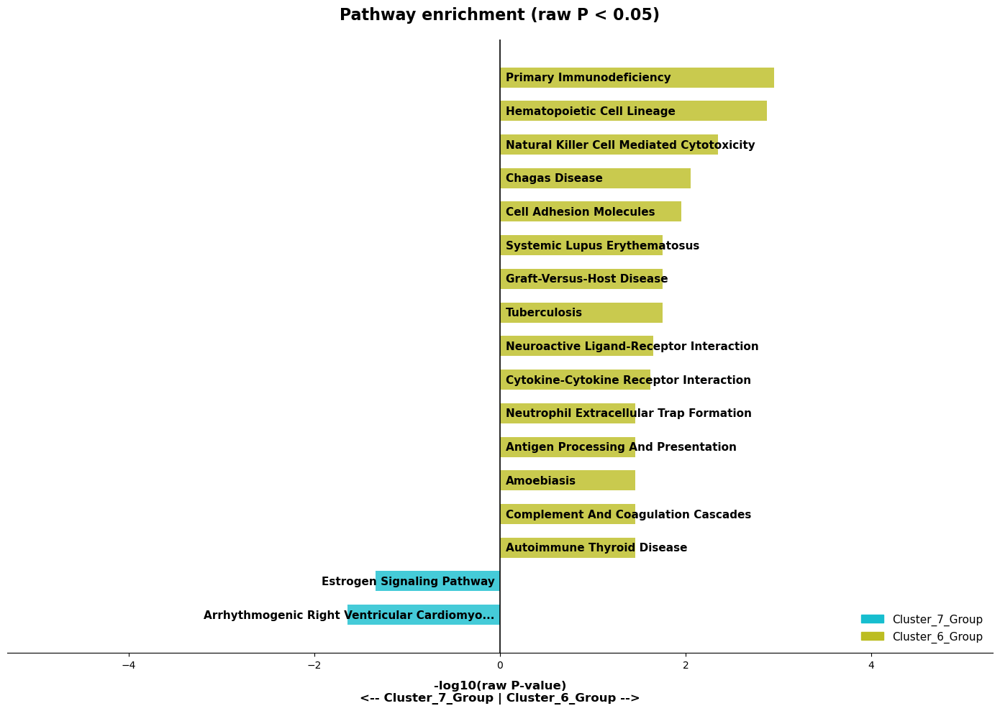

Top terms (Cluster_6_Group):
                                     Term  P-value  Adjusted P-value  Odds Ratio  Combined Score
                 Primary immunodeficiency 0.001123          0.115556         inf             inf
               Hematopoietic cell lineage 0.001328          0.115556         7.7       51.004094
Natural killer cell mediated cytotoxicity 0.004479          0.259772         inf             inf
                           Chagas disease 0.008901          0.383542         inf             inf
                  Cell adhesion molecules 0.011090          0.383542         3.8       17.106513
----------------------------------------------------------------------
Top terms (Cluster_7_Group):
                                           Term  P-value  Adjusted P-value  Odds Ratio  Combined Score
Arrhythmogenic right ventricular cardiomyopathy 0.022754          0.919257   13.396552       50.679301
                     Estrogen signaling pathway 0.045419          0.919257    4.491

In [35]:
# ===========================================================================
# Pathway enrichment analysis
# 通路富集分析
# ===========================================================================

import re
import gseapy as gp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ---------------------------------------------------------------------------
# Context and thresholds
# 上下文与阈值
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Gene selection thresholds for enrichment input.
# 用于富集输入的基因筛选阈值。
ENRICH_FC_THRESHOLD = 0.3
ENRICH_Q_THRESHOLD = 0.05
ENRICH_CPM_THRESHOLD = 10.0

# Display filter: only show terms with raw P below this cutoff.
# 展示过滤：仅显示原始 P 值低于此阈值的条目。
DISPLAY_RAW_P_CUTOFF = 0.05

# Maximum number of terms to display per group.
# 每组展示的最大条目数。
DISPLAY_TOP_N = 15

# Gene set libraries used by gseapy.
# gseapy 使用的基因集库。
GENE_SET_LIBS = ["MSigDB_Hallmark_2020", "GO_Biological_Process_2023", "KEGG_2021_Human"]

# ---------------------------------------------------------------------------
# Input check
# 输入检查
# ---------------------------------------------------------------------------
req = {"qval", "log2FC", "Mean_CPM"}
miss = req - set(dge_results.columns)
if miss:
    raise ValueError(f"dge_results missing: {sorted(miss)}")

# ---------------------------------------------------------------------------
# Select significant genes
# 筛选显著基因
# ---------------------------------------------------------------------------
sig = dge_results.loc[
    (dge_results["qval"] < ENRICH_Q_THRESHOLD)
    & (dge_results["log2FC"].abs() >= ENRICH_FC_THRESHOLD)
    & (dge_results["Mean_CPM"] >= ENRICH_CPM_THRESHOLD)
].copy()

a_genes = sig.index[sig["log2FC"] > 0].tolist()
b_genes = sig.index[sig["log2FC"] < 0].tolist()
bg = dge_results.index.tolist()

print("=" * 70)
print("Pathway enrichment input summary")
print("=" * 70)
print(f"Background genes : {len(bg)}")
print(f"{gA} gene count   : {len(a_genes)}")
print(f"{gB} gene count   : {len(b_genes)}")
print(
    f"Thresholds: q < {ENRICH_Q_THRESHOLD}, "
    f"|log2FC| >= {ENRICH_FC_THRESHOLD}, "
    f"Mean_CPM >= {ENRICH_CPM_THRESHOLD}"
)
print("-" * 70)

# ---------------------------------------------------------------------------
# Run enrichment
# 执行富集
# ---------------------------------------------------------------------------
enrA = enrB = None
try:
    if a_genes:
        print(f"Running enrichment for {gA} ({len(a_genes)} genes)...")
        enrA = gp.enrich(gene_list=a_genes, gene_sets=GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gA}: no genes passed thresholds")

    if b_genes:
        print(f"Running enrichment for {gB} ({len(b_genes)} genes)...")
        enrB = gp.enrich(gene_list=b_genes, gene_sets=GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gB}: no genes passed thresholds")
except Exception as e:
    print(f"gseapy error: {e}")
    enrA = enrB = None


# ---------------------------------------------------------------------------
# Helper functions
# 辅助函数
# ---------------------------------------------------------------------------
def extract_top_terms(enr, label, color, raw_p_cutoff, top_n):
    """
    Extract top enrichment terms filtered by raw P-value.
    按原始 P 值筛选并提取排名靠前的富集条目。
    """
    if enr is None or getattr(enr, "results", None) is None or enr.results.empty:
        return pd.DataFrame()

    r = enr.results.copy().drop_duplicates(subset=["Term"])
    if "P-value" not in r.columns:
        return pd.DataFrame()

    r["P-value"] = pd.to_numeric(r["P-value"], errors="coerce")
    r = r.loc[r["P-value"].notna() & (r["P-value"] < raw_p_cutoff)].copy()
    if r.empty:
        return pd.DataFrame()

    r["score_rawp"] = -np.log10(r["P-value"] + 1e-10)
    r["group"] = label
    # Broadcast color to match row count; avoids length mismatch when color is an RGBA tuple.
    # 将颜色广播为与行数等长的列表，避免 RGBA 元组被误解为序列。
    r["color"] = [color] * len(r)
    return r.sort_values("score_rawp", ascending=False).head(top_n)


def format_top_terms(terms_df, n=5):
    """
    Format top terms for text display.
    格式化排名靠前的条目用于文本展示。
    """
    if terms_df.empty:
        return "  (none passed display filter)"
    cols = [c for c in ["Term", "P-value", "Adjusted P-value", "Overlap", "Odds Ratio", "Combined Score"] if c in terms_df.columns]
    return (terms_df[cols] if cols else terms_df).head(n).to_string(index=False)


def clean_term_label(t, max_len=45):
    """
    Shorten and clean pathway term labels for plotting.
    缩短并清理通路条目标签用于绘图。
    """
    t = str(t)
    t = re.sub(r"\s*\(GO:\d+\)", "", t)
    t = re.sub(r"\s*Homo sapiens\s*hsa\d+", "", t)
    t = t.replace("HALLMARK_", "").replace("_", " ").title()
    return (t[:max_len - 3] + "...") if len(t) > max_len else t


# ---------------------------------------------------------------------------
# Process results
# 处理结果
# ---------------------------------------------------------------------------
dfA = extract_top_terms(enrA, gA, cA, DISPLAY_RAW_P_CUTOFF, DISPLAY_TOP_N)
dfB = extract_top_terms(enrB, gB, cB, DISPLAY_RAW_P_CUTOFF, DISPLAY_TOP_N)

if dfA.empty and dfB.empty:
    print("No terms passed display filter.")
else:
    # ---------------------------------------------------------------------------
    # Visualization
    # 可视化
    # ---------------------------------------------------------------------------
    enrich_plot_df = pd.concat([dfB, dfA], ignore_index=True)
    enrich_plot_df["plot_score"] = np.where(
        enrich_plot_df["group"] == gB,
        -enrich_plot_df["score_rawp"],
        enrich_plot_df["score_rawp"],
    )
    enrich_plot_df = enrich_plot_df.sort_values("plot_score").reset_index(drop=True)

    fig, ax = plt.subplots(figsize=(14, 10))
    y = np.arange(len(enrich_plot_df))

    ax.barh(y, enrich_plot_df["plot_score"], color=enrich_plot_df["color"], alpha=0.8, height=0.6)
    ax.axvline(0, color="black", linewidth=1.2, zorder=3)

    m = float(enrich_plot_df["score_rawp"].max())
    off = m * 0.02 if np.isfinite(m) and m > 0 else 0.1
    ax.set_xlim(-m * 1.8, m * 1.8)

    for i, row in enrich_plot_df.iterrows():
        lab = clean_term_label(row["Term"])
        if row["plot_score"] > 0:
            ax.text(off, i, lab, va="center", ha="left", fontsize=11, fontweight="bold")
        else:
            ax.text(-off, i, lab, va="center", ha="right", fontsize=11, fontweight="bold")

    ax.set_title(
        f"Pathway enrichment (raw P < {DISPLAY_RAW_P_CUTOFF})",
        fontsize=16, fontweight="bold", pad=20,
    )
    ax.set_xlabel(
        f"-log10(raw P-value)\n<-- {gB} | {gA} -->",
        fontsize=12, fontweight="bold", labelpad=10,
    )
    ax.set_yticks([])
    for s in ["top", "right", "left"]:
        ax.spines[s].set_visible(False)

    ax.legend(
        handles=[mpatches.Patch(color=cB, label=gB), mpatches.Patch(color=cA, label=gA)],
        loc="lower right", frameon=False, fontsize=11,
    )

    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------------------------
    # Text summary
    # 文本汇总
    # ---------------------------------------------------------------------------
    print("=" * 70)
    print(f"Top terms ({gA}):")
    print(format_top_terms(dfA))
    print("-" * 70)
    print(f"Top terms ({gB}):")
    print(format_top_terms(dfB))
    print("=" * 70)


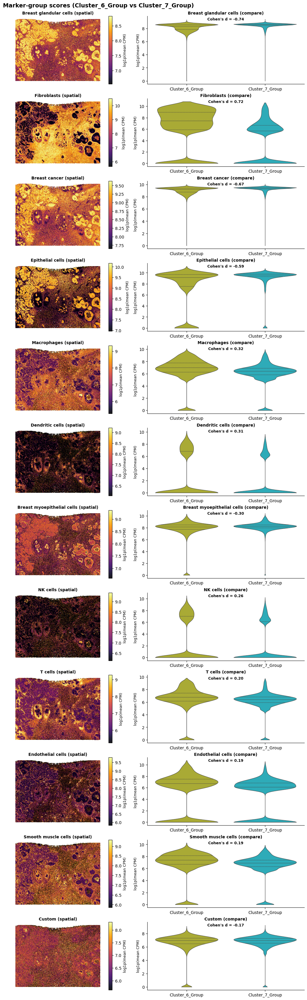

Marker-group score comparison summary (grid-level)
Regions compared: Cluster_6_Group vs Cluster_7_Group
              marker_group   n_a   n_b   mean_a   mean_b  median_a  median_b  cohens_d      pval_mwu     qval_mwu
    Breast glandular cells 53517 62386 8.183139 8.515162  8.344679  8.590747 -0.738941  0.000000e+00 0.000000e+00
               Fibroblasts 53517 62386 6.530076 4.043717  7.481906  5.686788  0.722721  0.000000e+00 0.000000e+00
             Breast cancer 53517 62386 9.037803 9.311090  9.195800  9.402795 -0.667721  0.000000e+00 0.000000e+00
          Epithelial cells 53517 62386 7.533758 9.142835  9.190639  9.601743 -0.587604  0.000000e+00 0.000000e+00
               Macrophages 53517 62386 6.738094 6.150114  6.974831  6.392425  0.322322  0.000000e+00 0.000000e+00
           Dendritic cells 53517 62386 2.653677 1.638197  0.000000  0.000000  0.313540  0.000000e+00 0.000000e+00
Breast myoepithelial cells 53517 62386 7.858567 8.215920  8.152838  8.239825 -0.300669  0.000000e+

In [36]:
# ===========================================================================
# Marker-group scoring and comparison
# 标记基因组评分与比较
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Maximum number of marker groups to plot (ranked by |Cohen's d|).
# 绘图展示的最大标记基因组数（按 |Cohen's d| 排序）。
TOP_N_GROUPS_TO_PLOT = 12

# Minimum number of genes per marker group required for scoring.
# 每个标记基因组用于评分所需的最小基因数。
MIN_GENES_PER_GROUP = 2


# ---------------------------------------------------------------------------
# Cohen's d (pooled standard deviation)
# Cohen's d（合并标准差）
# ---------------------------------------------------------------------------
def cohens_d(a, b):
    """
    Cohen's d with pooled standard deviation.
    使用合并标准差计算 Cohen's d。
    """
    a = np.asarray(a, np.float32)
    b = np.asarray(b, np.float32)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if len(a) < 2 or len(b) < 2:
        return np.nan
    va = np.var(a, ddof=1)
    vb = np.var(b, ddof=1)
    denom = len(a) + len(b) - 2
    if denom <= 0:
        return np.nan
    pooled = np.sqrt(((len(a) - 1) * va + (len(b) - 1) * vb) / denom)
    if pooled == 0 or not np.isfinite(pooled):
        return np.nan
    return float((a.mean() - b.mean()) / pooled)


# ---------------------------------------------------------------------------
# Input checks
# 输入检查
# ---------------------------------------------------------------------------
if "grid_cpm" not in globals():
    raise NameError("Missing grid_cpm. Run the grid-level count matrix block first.")

if "MARKER_CSV" not in globals():
    raise NameError("Missing MARKER_CSV")

# ---------------------------------------------------------------------------
# Marker-group scoring
# 标记基因组评分
# ---------------------------------------------------------------------------
# Each marker group score = log1p(mean CPM of member genes) per grid.
# 每个标记基因组的评分 = 每个网格中成员基因 CPM 均值的 log1p。
marker_df = pd.read_csv(MARKER_CSV).dropna(subset=["gene", "group"])

score_dict = {}
for grp, genes in marker_df.groupby("group")["gene"]:
    keep = [g for g in genes.unique() if g in grid_cpm.columns]
    if len(keep) >= MIN_GENES_PER_GROUP:
        score_dict[grp] = np.log1p(grid_cpm[keep].mean(axis=1))

if not score_dict:
    raise ValueError("No marker groups could be scored (too few overlapping genes)")

score_mat = pd.DataFrame(score_dict, index=grid_cpm.index)

# ---------------------------------------------------------------------------
# Attach spatial coordinates and region labels
# 关联空间坐标与区域标签
# ---------------------------------------------------------------------------
idx_df = score_mat.index.to_frame(index=False)

# grid_cpm index should contain cluster_sorted from the merged block.
# grid_cpm 的索引应包含合并段中的 cluster_sorted。
if "cluster_sorted" not in idx_df.columns:
    raise ValueError(f"grid_cpm index must include cluster_sorted, got: {idx_df.columns.tolist()}")

idx_df["region"] = np.where(
    idx_df["cluster_sorted"] == ctx["cluster_a"], gA,
    np.where(idx_df["cluster_sorted"] == ctx["cluster_b"], gB, ""),
)

x_col, y_col = "x_um", "y_um"
coord_map = grid_pd[["x_bin", "y_bin", x_col, y_col]].drop_duplicates(["x_bin", "y_bin"])

score_df = idx_df[["x_bin", "y_bin", "region"]].merge(coord_map, on=["x_bin", "y_bin"], how="left")
score_df = pd.concat([score_df.reset_index(drop=True), score_mat.reset_index(drop=True)], axis=1)
score_df_filtered = score_df.dropna(subset=["region", x_col, y_col]).copy()

sub = score_df_filtered.loc[score_df_filtered["region"].isin([gA, gB])].copy()
if sub.empty:
    raise ValueError(f"No rows for compare groups: {gA}, {gB}")

# ---------------------------------------------------------------------------
# Effect size ranking
# 效应量排序
# ---------------------------------------------------------------------------
meta_cols = {"x_bin", "y_bin", x_col, y_col, "region"}
marker_cols = [
    c for c in score_df_filtered.columns
    if c not in meta_cols and pd.api.types.is_numeric_dtype(score_df_filtered[c])
]

effect_df = pd.DataFrame({
    "marker_group": marker_cols,
    "cohens_d": [
        cohens_d(sub.loc[sub["region"] == gA, m], sub.loc[sub["region"] == gB, m])
        for m in marker_cols
    ],
}).dropna(subset=["cohens_d"])

sorted_groups = (
    effect_df
    .assign(abs_d=effect_df["cohens_d"].abs())
    .sort_values("abs_d", ascending=False)["marker_group"]
    .head(TOP_N_GROUPS_TO_PLOT)
    .tolist()
)

if not sorted_groups:
    raise ValueError("No marker groups with computable effect size")

d_map = dict(zip(effect_df["marker_group"], effect_df["cohens_d"]))

# ---------------------------------------------------------------------------
# Visualization: spatial map + violin per marker group
# 可视化：每个标记基因组的空间图 + 小提琴图
# ---------------------------------------------------------------------------
vio_df = score_df_filtered.loc[score_df_filtered["region"].isin([gA, gB])].copy()

fig, axes = plt.subplots(
    nrows=len(sorted_groups),
    ncols=2,
    figsize=(14, max(8, len(sorted_groups) * 2.8)),
    constrained_layout=True,
    gridspec_kw={"width_ratios": [1.35, 1.0]},
)
if len(sorted_groups) == 1:
    axes = np.array([axes])

for i, grp in enumerate(sorted_groups):
    axm, axv = axes[i, 0], axes[i, 1]

    # Spatial score map.
    # 空间评分图。
    vals = score_df_filtered[grp].to_numpy(np.float32)
    fp = vals[np.isfinite(vals) & (vals > 0)]
    if fp.size >= 2:
        vmin, vmax = np.percentile(fp, [2, 98])
        vmax = vmax if vmin != vmax else vmin + 1e-9
    else:
        vmin, vmax = 0.0, 1.0

    sc = axm.scatter(
        score_df_filtered[x_col], score_df_filtered[y_col],
        c=score_df_filtered[grp],
        s=0.8, cmap="inferno", alpha=0.9, edgecolors="none",
        vmin=vmin, vmax=vmax, rasterized=True,
    )
    axm.set_title(f"{grp} (spatial)", fontsize=10, fontweight="bold", pad=4)
    axm.set_aspect("equal")
    axm.invert_yaxis()
    axm.set_xticks([])
    axm.set_yticks([])
    for s in ["top", "right", "left", "bottom"]:
        axm.spines[s].set_visible(False)
    cb = fig.colorbar(sc, ax=axm, fraction=0.046, pad=0.02)
    cb.set_label("log1p(mean CPM)", fontsize=9)

    # Violin comparison.
    # 小提琴图比较。
    sns.violinplot(
        data=vio_df, x="region", y=grp, hue="region",
        order=[gA, gB], palette={gA: cA, gB: cB},
        inner="quartile", cut=0, linewidth=0.8, dodge=False, ax=axv,
    )
    if axv.legend_ is not None:
        axv.legend_.remove()
    axv.set_title(f"{grp} (compare)", fontsize=10, fontweight="bold", pad=4)
    axv.set_xlabel("")
    axv.set_ylabel("log1p(mean CPM)", fontsize=9)
    for s in ["top", "right"]:
        axv.spines[s].set_visible(False)

    d = d_map.get(grp, np.nan)
    if np.isfinite(d):
        axv.text(
            0.5, 0.98, f"Cohen's d = {d:.2f}",
            transform=axv.transAxes, ha="center", va="top",
            fontsize=9, fontweight="bold",
        )

fig.suptitle(
    f"Marker-group scores ({gA} vs {gB})",
    fontsize=14, fontweight="bold",
)
plt.show()

# ---------------------------------------------------------------------------
# Statistical comparison (all marker groups)
# 统计比较（全部标记基因组）
# ---------------------------------------------------------------------------
stat_rows = []
for grp in marker_cols:
    a = sub.loc[sub["region"] == gA, grp].to_numpy(np.float32)
    b = sub.loc[sub["region"] == gB, grp].to_numpy(np.float32)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]

    p = np.nan
    if len(a) >= 2 and len(b) >= 2 and (np.var(a) > 0 or np.var(b) > 0):
        p = float(stats.mannwhitneyu(a, b, alternative="two-sided")[1])

    stat_rows.append({
        "marker_group": grp,
        "region_a": gA,
        "region_b": gB,
        "n_a": int(len(a)),
        "n_b": int(len(b)),
        "mean_a": float(np.mean(a)) if len(a) else np.nan,
        "mean_b": float(np.mean(b)) if len(b) else np.nan,
        "median_a": float(np.median(a)) if len(a) else np.nan,
        "median_b": float(np.median(b)) if len(b) else np.nan,
        "cohens_d": cohens_d(a, b),
        "pval_mwu": p,
    })

effect_stats_table = pd.DataFrame(stat_rows)
_, q, _, _ = multipletests(effect_stats_table["pval_mwu"].fillna(1.0).to_numpy(np.float32), method="fdr_bh")
effect_stats_table["qval_mwu"] = q
effect_stats_table["neglog10_qval_mwu"] = -np.log10(effect_stats_table["qval_mwu"] + 1e-300)
effect_stats_table = (
    effect_stats_table
    .assign(abs_d=effect_stats_table["cohens_d"].abs())
    .sort_values("abs_d", ascending=False)
    .drop(columns=["abs_d"])
    .reset_index(drop=True)
)

print("=" * 80)
print("Marker-group score comparison summary (grid-level)")
print("=" * 80)
print(f"Regions compared: {gA} vs {gB}")
print(
    effect_stats_table[
        ["marker_group", "n_a", "n_b", "mean_a", "mean_b",
         "median_a", "median_b", "cohens_d", "pval_mwu", "qval_mwu"]
    ].head(30).to_string(index=False)
)
print("=" * 80)


Radius sensitivity sweep
 radius_um          region  rho_z_density  partial_rho_z_density  rho_z_heter_soft  partial_rho_z_heter_soft
        40 Cluster_6_Group      -0.240053              -0.193725          0.264615                  0.225155
        60 Cluster_6_Group      -0.206728              -0.167290          0.261811                  0.234941
        80 Cluster_6_Group      -0.162433              -0.128881          0.249506                  0.231165
       100 Cluster_6_Group      -0.116408              -0.088468          0.231349                  0.218784
       120 Cluster_6_Group      -0.086845              -0.062773          0.218216                  0.208364
        40 Cluster_7_Group      -0.296372              -0.259046          0.251930                  0.254500
        60 Cluster_7_Group      -0.300198              -0.286256          0.275870                  0.282179
        80 Cluster_7_Group      -0.272401              -0.267851          0.266570                  0.2

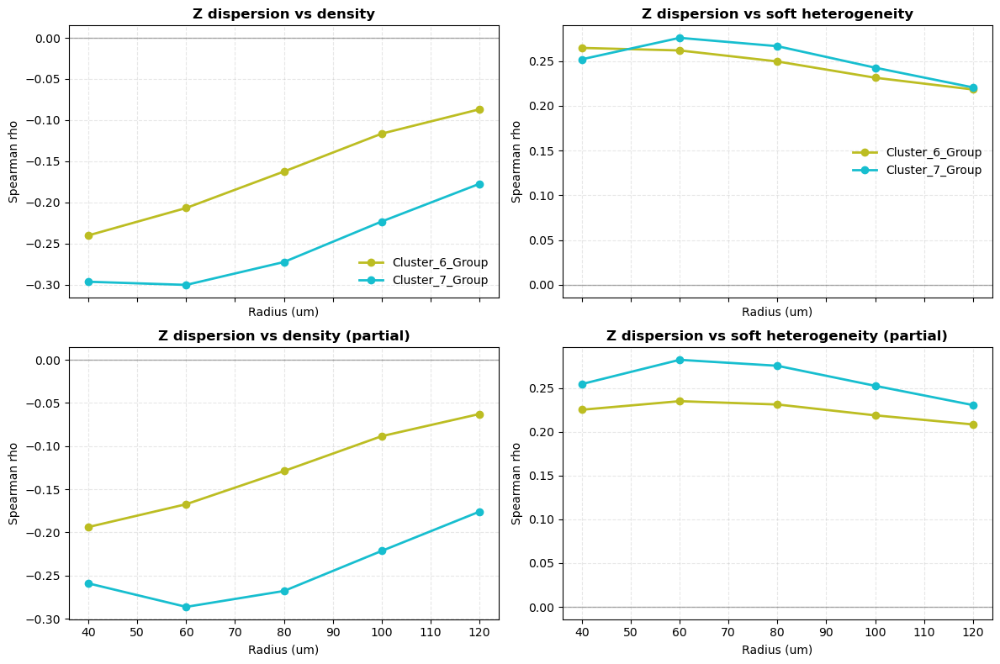

In [29]:
# ===========================================================================
# Radius sensitivity sweep with partial Spearman correlations
# 半径敏感性扫描与偏 Spearman 相关
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from scipy import stats
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Radii to sweep (um).
# 扫描的半径范围（微米）。
RADIUS_RANGE_UM = list(range(40, 121, 20))

# Minimum sample size for Spearman / partial Spearman.
# Spearman / 偏 Spearman 所需的最小样本量。
MIN_SAMPLES_CORR = 20

# ---------------------------------------------------------------------------
# Input checks
# 输入检查
# ---------------------------------------------------------------------------
if "grid_pd" not in globals():
    raise NameError("Missing grid_pd")
if "score_df_filtered" not in globals():
    raise NameError("Missing score_df_filtered")

x_col, y_col = "x_um", "y_um"
z_col = "z_std_all_ref"

req = {x_col, y_col, z_col, "transcript_count"}
miss = req - set(grid_pd.columns)
if miss:
    raise ValueError(f"grid_pd missing: {sorted(miss)}")

# ---------------------------------------------------------------------------
# Merge and prepare working table
# 合并并准备工作表
# ---------------------------------------------------------------------------
exclude = {x_col, y_col, "x_bin", "y_bin", "region"}
marker_cols = [
    c for c in score_df_filtered.columns
    if c not in exclude and pd.api.types.is_numeric_dtype(score_df_filtered[c])
]
if not marker_cols:
    raise ValueError("No marker-group columns found in score_df_filtered")

base = (
    score_df_filtered[[x_col, y_col, "region"] + marker_cols]
    .merge(grid_pd[[x_col, y_col, z_col, "transcript_count"]], on=[x_col, y_col], how="inner")
    .copy()
)
base = base.loc[base["region"].isin([gA, gB])].copy()
if base.empty:
    raise ValueError(f"No rows for {gA}/{gB}")

base = base.rename(columns={x_col: "x_coord", y_col: "y_coord", z_col: "z_dispersion"})
base["dominant_marker_group"] = base[marker_cols].idxmax(axis=1)

region_order = [gA, gB]
color_map = {gA: cA, gB: cB}

coords = base[["x_coord", "y_coord"]].to_numpy(np.float32)
tree = cKDTree(coords)
dom = base["dominant_marker_group"].to_numpy()
scores = np.clip(base[marker_cols].to_numpy(np.float32), 0.0, None)


# ---------------------------------------------------------------------------
# Correlation utilities
# 相关性工具函数
# ---------------------------------------------------------------------------
def spearman(x, y, min_n=MIN_SAMPLES_CORR):
    """
    Spearman rank correlation with minimum sample guard.
    带最小样本量保护的 Spearman 秩相关。
    """
    x = np.asarray(x, np.float32)
    y = np.asarray(y, np.float32)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if len(x) < min_n:
        return np.nan, np.nan, int(len(x))
    r, p = stats.spearmanr(x, y)
    return float(r), float(p), int(len(x))


def partial_spearman(x, y, c, min_n=MIN_SAMPLES_CORR):
    """
    Partial Spearman correlation controlling for covariate c.
    控制协变量 c 的偏 Spearman 相关。

    Residualize ranks of x and y on ranks of c via OLS, then correlate residuals.
    对 x 和 y 的秩在 c 的秩上做 OLS 残差化，再对残差求相关。
    """
    x = np.asarray(x, np.float32)
    y = np.asarray(y, np.float32)
    c = np.asarray(c, np.float32)
    m = np.isfinite(x) & np.isfinite(y) & np.isfinite(c)
    x, y, c = x[m], y[m], c[m]
    n = int(len(x))
    if n < min_n:
        return np.nan, np.nan, n

    rx = stats.rankdata(x, method="average")
    ry = stats.rankdata(y, method="average")
    rc = stats.rankdata(c, method="average")

    D = np.column_stack([np.ones(n, np.float32), rc]).astype(np.float32, copy=False)
    bx, *_ = np.linalg.lstsq(D, rx, rcond=None)
    by, *_ = np.linalg.lstsq(D, ry, rcond=None)

    r, p = stats.spearmanr(rx - D @ bx, ry - D @ by)
    return float(r), float(p), n


# ---------------------------------------------------------------------------
# Neighborhood metrics at a given radius
# 给定半径下的邻域指标
# ---------------------------------------------------------------------------
def compute_neighborhood_metrics(radius):
    """
    Compute density and soft heterogeneity for each grid at a given radius.
    在给定半径下计算每个网格的密度与软异质性。

    Soft heterogeneity: 1 - sum(p_i^2) where p_i is the proportion of
    aggregated marker-group score from neighbors assigned to group i.
    软异质性：1 - Σ(p_i²)，其中 p_i 是邻居中第 i 组聚合标记评分的占比。
    """
    nbrs = tree.query_ball_point(coords, r=float(radius))
    area = float(np.pi * (radius ** 2))

    den = np.empty(len(base), np.float32)
    soft = np.empty(len(base), np.float32)

    for i, idx in enumerate(nbrs):
        idx = [j for j in idx if j != i]
        k = len(idx)
        den[i] = k / area
        if k == 0:
            soft[i] = np.nan
            continue
        agg = scores[idx].sum(axis=0)
        tot = float(agg.sum())
        soft[i] = np.nan if tot <= 0 else float(1.0 - np.sum((agg / tot) ** 2))

    return den, soft


# ---------------------------------------------------------------------------
# Sweep across radii
# 跨半径扫描
# ---------------------------------------------------------------------------
cov = np.log1p(base["transcript_count"].to_numpy(np.float32))
rows = []

for radius in RADIUS_RANGE_UM:
    den, soft = compute_neighborhood_metrics(float(radius))
    tmp = base[["region", "z_dispersion"]].copy()
    tmp["cov"] = cov
    tmp["den"] = den
    tmp["soft"] = soft

    for reg in region_order:
        s = tmp.loc[tmp["region"] == reg]
        rho_d, _, _ = spearman(s["z_dispersion"], s["den"])
        rho_s, _, _ = spearman(s["z_dispersion"], s["soft"])
        prho_d, _, _ = partial_spearman(s["z_dispersion"], s["den"], s["cov"])
        prho_s, _, _ = partial_spearman(s["z_dispersion"], s["soft"], s["cov"])
        rows.append({
            "radius_um": int(radius),
            "region": reg,
            "rho_z_density": rho_d,
            "partial_rho_z_density": prho_d,
            "rho_z_heter_soft": rho_s,
            "partial_rho_z_heter_soft": prho_s,
        })

sens_df = pd.DataFrame(rows).sort_values(["region", "radius_um"]).reset_index(drop=True)

print("=" * 70)
print("Radius sensitivity sweep")
print("=" * 70)
print(
    sens_df[
        ["radius_um", "region", "rho_z_density", "partial_rho_z_density",
         "rho_z_heter_soft", "partial_rho_z_heter_soft"]
    ].to_string(index=False)
)
print("=" * 70)

# ---------------------------------------------------------------------------
# Visualization
# 可视化
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)

for reg in region_order:
    s = sens_df.loc[sens_df["region"] == reg]
    col = color_map.get(reg, "gray")
    axes[0, 0].plot(s["radius_um"], s["rho_z_density"], marker="o", lw=2, color=col, label=reg)
    axes[1, 0].plot(s["radius_um"], s["partial_rho_z_density"], marker="o", lw=2, color=col, label=reg)
    axes[0, 1].plot(s["radius_um"], s["rho_z_heter_soft"], marker="o", lw=2, color=col, label=reg)
    axes[1, 1].plot(s["radius_um"], s["partial_rho_z_heter_soft"], marker="o", lw=2, color=col, label=reg)

for ax in axes.ravel():
    ax.axhline(0, color="black", lw=1, alpha=0.3)
    ax.set_xlabel("Radius (um)")
    ax.set_ylabel("Spearman rho")
    ax.grid(True, ls="--", alpha=0.3)

axes[0, 0].set_title("Z dispersion vs density", fontweight="bold")
axes[1, 0].set_title("Z dispersion vs density (partial)", fontweight="bold")
axes[0, 1].set_title("Z dispersion vs soft heterogeneity", fontweight="bold")
axes[1, 1].set_title("Z dispersion vs soft heterogeneity (partial)", fontweight="bold")

axes[0, 0].legend(frameon=False)
axes[0, 1].legend(frameon=False)

plt.tight_layout()
plt.show()


Interface: negative=Cluster_7_Group, positive=Cluster_6_Group
Features to plot: 18


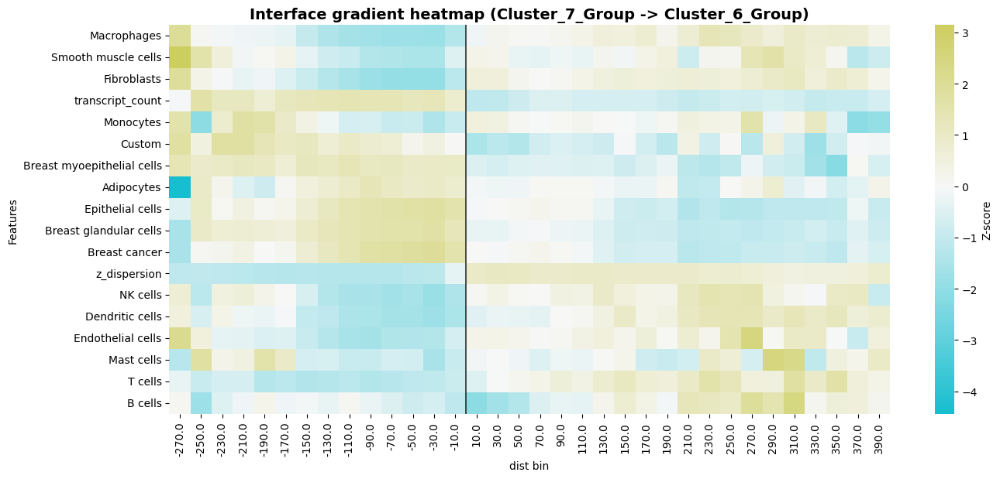

In [39]:
# ===========================================================================
# Signed distance to boundary and interface gradient heatmap
# 到边界的有符号距离与界面梯度热图
# ===========================================================================

import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
import seaborn as sns
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]

# Radius used to identify boundary grids (um).
# 用于识别边界网格的半径（微米）。
BOUNDARY_RADIUS_UM = 30.0

# Distance binning parameters for heatmap.
# 热图的距离分箱参数。
HEATMAP_BIN_WIDTH_UM = 20.0
HEATMAP_DIST_MIN_UM = -400.0
HEATMAP_DIST_MAX_UM = 400.0
HEATMAP_MIN_COUNT_PER_BIN = 20


# ---------------------------------------------------------------------------
# Signed distance computation
# 有符号距离计算
# ---------------------------------------------------------------------------
def compute_signed_distance_to_boundary(
    base_df, negative_label, positive_label,
    x_col, y_col, region_col="region",
    boundary_radius_um=BOUNDARY_RADIUS_UM,
):
    """
    Compute signed distance from each grid to the nearest boundary grid.
    计算每个网格到最近边界网格的有符号距离。

    Boundary grids are those within boundary_radius_um of the opposing region.
    边界网格定义为在 boundary_radius_um 范围内存在对侧区域网格的点。

    Sign convention: negative for grids in negative_label, positive for positive_label.
    符号约定：negative_label 侧为负，positive_label 侧为正。
    """
    df = base_df.copy()
    df = df[df[region_col].isin([negative_label, positive_label])].copy()
    if df.empty:
        raise ValueError("No rows left after region filter")

    coords = df[[x_col, y_col]].to_numpy(np.float32)
    regions = df[region_col].to_numpy()

    neg = regions == negative_label
    pos = regions == positive_label
    if neg.sum() == 0 or pos.sum() == 0:
        raise ValueError("One selected group is empty")

    ni = np.where(neg)[0]
    pi = np.where(pos)[0]

    ntree = cKDTree(coords[ni])
    ptree = cKDTree(coords[pi])

    # A grid is on the boundary if it has at least one neighbor from the other region.
    # 若一个网格在给定半径内存在至少一个对侧区域的邻居，则视为边界网格。
    neg_has_pos = ptree.query_ball_point(coords[ni], r=float(boundary_radius_um))
    pos_has_neg = ntree.query_ball_point(coords[pi], r=float(boundary_radius_um))

    is_boundary = np.zeros(len(df), dtype=bool)
    is_boundary[ni] = np.array([len(v) > 0 for v in neg_has_pos], dtype=bool)
    is_boundary[pi] = np.array([len(v) > 0 for v in pos_has_neg], dtype=bool)

    bcoords = coords[is_boundary]
    if bcoords.shape[0] == 0:
        raise ValueError("No boundary points found; consider increasing boundary_radius_um")

    d, _ = cKDTree(bcoords).query(coords, k=1)
    signed = d.astype(np.float32)
    signed[neg] *= -1.0

    df["signed_dist_um"] = signed
    df["is_boundary"] = is_boundary

    boundary_df = df.loc[df["is_boundary"], [x_col, y_col, region_col]].copy()
    return df, boundary_df


# ---------------------------------------------------------------------------
# Interface gradient heatmap
# 界面梯度热图
# ---------------------------------------------------------------------------
def plot_interface_heatmap(
    signed_df, features,
    dist_col="signed_dist_um",
    bin_width_um=HEATMAP_BIN_WIDTH_UM,
    dist_min_um=HEATMAP_DIST_MIN_UM,
    dist_max_um=HEATMAP_DIST_MAX_UM,
    min_count_per_bin=HEATMAP_MIN_COUNT_PER_BIN,
    zscore_by_feature=True,
    title="Interface gradient heatmap",
    cmap=None,
):
    """
    Bin grids by signed distance and plot feature means as a heatmap.
    按有符号距离对网格分箱，并将特征均值绘制为热图。

    If zscore_by_feature is True, each feature row is z-scored across distance bins.
    若 zscore_by_feature 为 True，则对每个特征行在距离分箱间做 z-score 标准化。
    """
    d = signed_df.copy()
    d = d[(d[dist_col] >= dist_min_um) & (d[dist_col] <= dist_max_um)].copy()
    if d.empty:
        raise ValueError("No data in distance window")

    miss = [f for f in features if f not in d.columns]
    if miss:
        raise ValueError(f"Missing features: {miss}")

    edges = np.arange(dist_min_um, dist_max_um + bin_width_um, bin_width_um)
    centers = (edges[:-1] + edges[1:]) / 2.0

    d["dist_bin"] = pd.cut(d[dist_col], bins=edges, labels=centers, include_lowest=True)
    mat = d.groupby("dist_bin", observed=False)[features].mean().T
    counts = d.groupby("dist_bin", observed=False).size().reindex(mat.columns, fill_value=0)

    valid = counts[counts >= min_count_per_bin].index
    mat = mat[valid]
    if mat.shape[1] == 0:
        raise ValueError("No bins remain after min_count_per_bin filter")

    if zscore_by_feature and mat.shape[1] > 1:
        mat = mat.sub(mat.mean(axis=1), axis=0)
        mat = mat.div(mat.std(axis=1).replace(0, np.nan), axis=0)

    # Order features by the distance bin where they peak.
    # 按特征达到峰值的距离分箱排序。
    xv = np.array([float(c) for c in mat.columns.astype(np.float32)])
    peak_positions = np.nanargmax(mat.to_numpy(), axis=1)
    order = np.argsort(xv[peak_positions])
    mat = mat.iloc[order]

    plt.figure(figsize=(14, max(5, 0.35 * len(features))))
    ax = sns.heatmap(
        mat,
        cmap=(ctx["cmap_ab"] if cmap is None else cmap),
        center=0.0 if zscore_by_feature else None,
        cbar_kws={"label": "Z-score" if zscore_by_feature else "Mean value"},
        yticklabels=1,
        xticklabels=1,
    )
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_ylabel("Features")
    ax.set_xlabel("dist bin")

    # Mark the boundary (distance ~ 0).
    # 标记边界位置（距离 ≈ 0）。
    xv = np.array([float(c) for c in mat.columns.astype(np.float32)])
    if xv.size:
        if np.any(xv < 0.0) and np.any(xv > 0.0):
            neg_idx = int(np.where(xv < 0.0)[0].max())
            pos_idx = int(np.where(xv > 0.0)[0].min())
            xline = float(pos_idx)
        else:
            xline = float(np.argmin(np.abs(xv)) + 0.5)
        ax.axvline(xline, color="black", lw=1.2, alpha=0.8)

    plt.tight_layout()
    plt.show()

    return mat, counts


# ---------------------------------------------------------------------------
# Execution
# 执行
# ---------------------------------------------------------------------------
if "base" not in globals():
    raise NameError("Missing base")

if not {"x_coord", "y_coord"}.issubset(base.columns):
    raise ValueError(f"base must contain x_coord and y_coord, got: {sorted(base.columns.tolist())}")
x_col, y_col = "x_coord", "y_coord"

if "region" not in base.columns:
    raise ValueError("base missing region column")

# Convention: negative side = gB, positive side = gA.
# 约定：负侧 = gB，正侧 = gA。
negative_label, positive_label = gB, gA

signed_base, boundary_points = compute_signed_distance_to_boundary(
    base_df=base,
    negative_label=negative_label,
    positive_label=positive_label,
    x_col=x_col,
    y_col=y_col,
    region_col="region",
    boundary_radius_um=BOUNDARY_RADIUS_UM,
)

# Select numeric features, excluding metadata and derived columns.
# 选择数值特征，排除元数据与派生列。
exclude = {
    x_col, y_col, "x_bin", "y_bin", "region",
    "dominant_marker_group",
    "neighbor_count", "neighbor_density_per_um2", "neighbor_density_per_area",
    "heterogeneity_index_hard", "heter_hard", "heter_soft",
    "signed_dist_um", "is_boundary",
}
features = [
    c for c in signed_base.columns
    if c not in exclude and pd.api.types.is_numeric_dtype(signed_base[c])
]
if not features:
    raise ValueError("No numeric features available for heatmap")

print(f"Interface: negative={negative_label}, positive={positive_label}")
print(f"Features to plot: {len(features)}")

mat, bin_counts = plot_interface_heatmap(
    signed_df=signed_base,
    features=features,
    dist_col="signed_dist_um",
    bin_width_um=HEATMAP_BIN_WIDTH_UM,
    dist_min_um=HEATMAP_DIST_MIN_UM,
    dist_max_um=HEATMAP_DIST_MAX_UM,
    min_count_per_bin=HEATMAP_MIN_COUNT_PER_BIN,
    zscore_by_feature=True,
    title=f"Interface gradient heatmap ({negative_label} -> {positive_label})",
    cmap=ctx["cmap_ab"],
)


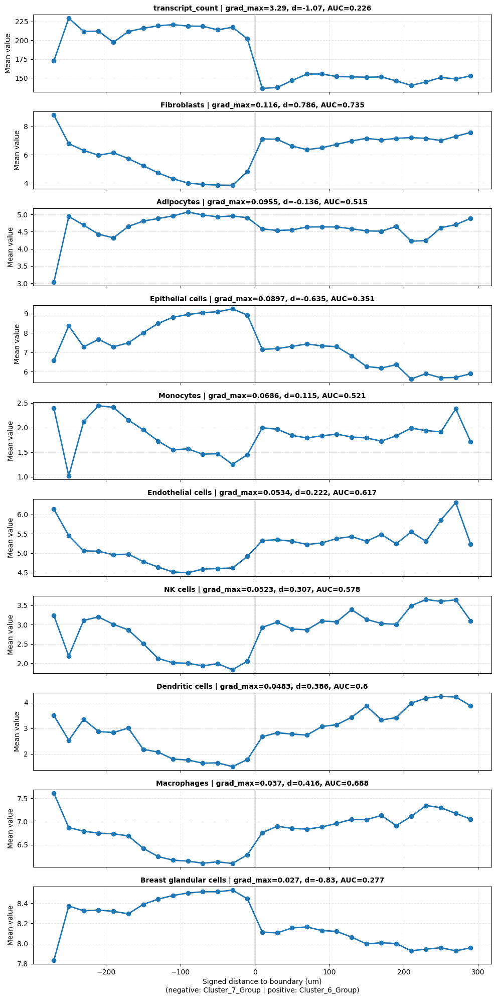

                   feature  contrast_d_pos_minus_neg  slope_near0_per_um  grad_max_abs_per_um  auc_sep_pos_vs_neg  n_total  n_neg_window  n_pos_window  n_slope_window
          transcript_count                 -1.067967           -0.983261             3.285940            0.225724   115903         25772         17575           88342
               Fibroblasts                  0.786192            0.041173             0.116271            0.735310   115903         25772         17575           88342
                Adipocytes                 -0.135750           -0.005279             0.095483            0.515063   115903         25772         17575           88342
          Epithelial cells                 -0.634652           -0.025161             0.089652            0.351429   115903         25772         17575           88342
                 Monocytes                  0.114587            0.007239             0.068613            0.521112   115903         25772         17575           8834

In [31]:
# ===========================================================================
# Interface strength and sharpness metrics
# 界面强度与锐度指标
# ===========================================================================

import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]

# Distance windows for contrast and slope estimation (um).
# 用于对比度和斜率估计的距离窗口（微米）。
NEG_WINDOW = (-150.0, -30.0)
POS_WINDOW = (30.0, 150.0)
SLOPE_WINDOW = (-60.0, 60.0)

# Distance range and bin width for profile construction (um).
# 用于构建 profile 的距离范围与分箱宽度（微米）。
PROFILE_DIST_MIN_UM = -300.0
PROFILE_DIST_MAX_UM = 300.0
PROFILE_BIN_WIDTH_UM = 20.0
PROFILE_MIN_COUNT_PER_BIN = 20

# Number of top features to plot.
# 绘制的排名靠前的特征数。
N_PLOT = 10

# Minimum data points per feature to compute metrics.
# 计算指标所需的每个特征最小数据点数。
MIN_POINTS_PER_FEATURE = 30

# Minimum data points for slope fitting within the slope window.
# 斜率窗口内拟合所需的最小数据点数。
MIN_POINTS_FOR_SLOPE = 30

# Minimum data points for AUC separation estimate.
# AUC 分离度估计所需的最小数据点数。
MIN_POINTS_FOR_AUC = 10


# ---------------------------------------------------------------------------
# Helper: Cohen's d (pooled)
# 辅助函数：Cohen's d（合并标准差）
# ---------------------------------------------------------------------------
def _cohens_d(a, b):
    a = np.asarray(a, np.float32)
    b = np.asarray(b, np.float32)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if len(a) < 2 or len(b) < 2:
        return np.nan
    va, vb = a.var(ddof=1), b.var(ddof=1)
    denom = len(a) + len(b) - 2
    if denom <= 0:
        return np.nan
    pooled = np.sqrt(((len(a) - 1) * va + (len(b) - 1) * vb) / denom)
    if not np.isfinite(pooled) or pooled == 0:
        return np.nan
    return float((a.mean() - b.mean()) / pooled)


# ---------------------------------------------------------------------------
# Helper: AUC-based separation (from Mann-Whitney U)
# 辅助函数：基于 AUC 的分离度（由 Mann-Whitney U 推导）
# ---------------------------------------------------------------------------
def _auc_separation(scores, labels):
    """
    AUC = U / (n1 * n0), derived from Mann-Whitney U statistic.
    AUC = U / (n1 * n0)，由 Mann-Whitney U 统计量推导。
    """
    s = np.asarray(scores, np.float32)
    y = np.asarray(labels, int)
    m = np.isfinite(s) & np.isfinite(y)
    s, y = s[m], y[m]
    if len(s) < MIN_POINTS_FOR_AUC or len(np.unique(y)) < 2:
        return np.nan
    u, _ = stats.mannwhitneyu(s[y == 1], s[y == 0], alternative="two-sided")
    n1 = int((y == 1).sum())
    n0 = int((y == 0).sum())
    return float(u / (n1 * n0))


# ---------------------------------------------------------------------------
# Main function
# 主函数
# ---------------------------------------------------------------------------
def compute_interface_metrics(
    signed_df, features,
    dist_col="signed_dist_um",
    neg_window=NEG_WINDOW,
    pos_window=POS_WINDOW,
    slope_window=SLOPE_WINDOW,
    dist_min_um=PROFILE_DIST_MIN_UM,
    dist_max_um=PROFILE_DIST_MAX_UM,
    bin_width_um=PROFILE_BIN_WIDTH_UM,
    min_n_per_bin=PROFILE_MIN_COUNT_PER_BIN,
    plot_profiles=True,
    n_plot=N_PLOT,
    sort_by="grad_max_abs_per_um",
    negative_label="Group_B",
    positive_label="Group_A",
):
    """
    Compute per-feature interface metrics from signed-distance data.
    从有符号距离数据中计算每个特征的界面指标。

    Metrics per feature:
    每个特征的指标：
      - contrast_d: Cohen's d between positive and negative windows.
        contrast_d：正窗与负窗之间的 Cohen's d。
      - slope_near0: linear slope within the slope window.
        slope_near0：斜率窗口内的线性斜率。
      - grad_max_abs: maximum absolute gradient across distance bins.
        grad_max_abs：距离分箱间的最大绝对梯度。
      - auc_sep: AUC separation between positive and negative windows.
        auc_sep：正窗与负窗之间的 AUC 分离度。
    """
    if dist_col not in signed_df.columns:
        raise ValueError(f"Missing {dist_col}")
    miss = [f for f in features if f not in signed_df.columns]
    if miss:
        raise ValueError(f"Missing features: {miss}")

    df0 = signed_df.copy()
    df0 = df0[np.isfinite(df0[dist_col].to_numpy(np.float32))].copy()
    if df0.empty:
        raise ValueError("No finite distance rows")

    edges = np.arange(dist_min_um, dist_max_um + bin_width_um, bin_width_um)
    centers = (edges[:-1] + edges[1:]) / 2.0

    dist = df0[dist_col].to_numpy(np.float32)
    metrics = []
    profiles = {}

    for feat in features:
        y0 = df0[feat].to_numpy(np.float32)
        m = np.isfinite(y0)
        d, y = dist[m], y0[m]
        if len(y) < MIN_POINTS_PER_FEATURE:
            continue

        # Contrast: Cohen's d between positive and negative windows.
        # 对比度：正窗与负窗之间的 Cohen's d。
        neg = (d >= neg_window[0]) & (d <= neg_window[1])
        pos = (d >= pos_window[0]) & (d <= pos_window[1])
        contrast = _cohens_d(y[pos], y[neg])

        # Slope: linear fit within the slope window.
        # 斜率：斜率窗口内的线性拟合。
        sw = (d >= slope_window[0]) & (d <= slope_window[1])
        slope = (
            float(np.polyfit(d[sw], y[sw], deg=1)[0])
            if int(sw.sum()) >= MIN_POINTS_FOR_SLOPE
            else np.nan
        )

        # Binned profile and maximum gradient.
        # 分箱 profile 与最大梯度。
        bins = pd.cut(d, bins=edges, labels=centers, include_lowest=True)
        prof = pd.DataFrame({"bin": bins, "val": y}).groupby("bin", observed=False)["val"].mean().dropna()
        cnt = pd.DataFrame({"bin": bins}).groupby("bin", observed=False).size().reindex(prof.index, fill_value=0).astype(int)

        if not prof.empty:
            valid = cnt[cnt >= min_n_per_bin].index
            prof = prof.reindex(valid).dropna()
            cnt = cnt.reindex(prof.index).astype(int)

        if prof.empty or len(prof) < 3:
            gmax = np.nan
            profiles[feat] = (np.array([]), np.array([]), np.array([]))
        else:
            xb = np.array([float(c) for c in prof.index.astype(np.float32)])
            yb = prof.to_numpy(np.float32)
            nb = cnt.to_numpy(int)
            order = np.argsort(xb)
            xb, yb, nb = xb[order], yb[order], nb[order]
            g = np.diff(yb) / np.diff(xb)
            gmax = float(np.nanmax(np.abs(g))) if len(g) else np.nan
            profiles[feat] = (xb, yb, nb)

        # AUC separation between positive and negative windows.
        # 正窗与负窗之间的 AUC 分离度。
        sep = (d <= neg_window[1]) | (d >= pos_window[0])
        auc = _auc_separation(y[sep], (d[sep] > 0).astype(int))

        metrics.append({
            "feature": feat,
            "contrast_d_pos_minus_neg": contrast,
            "slope_near0_per_um": slope if np.isfinite(slope) else np.nan,
            "grad_max_abs_per_um": gmax,
            "auc_sep_pos_vs_neg": auc,
            "n_total": int(len(y)),
            "n_neg_window": int(neg.sum()),
            "n_pos_window": int(pos.sum()),
            "n_slope_window": int(sw.sum()),
        })

    metrics_df = pd.DataFrame(metrics)
    if metrics_df.empty:
        raise ValueError("No metrics computed")
    if sort_by in metrics_df.columns:
        metrics_df = metrics_df.sort_values(sort_by, ascending=False).reset_index(drop=True)

    # ---------------------------------------------------------------------------
    # Profile plots
    # Profile 图
    # ---------------------------------------------------------------------------
    if plot_profiles:
        top = metrics_df["feature"].head(int(n_plot)).tolist()
        n = len(top)
        fig, axes = plt.subplots(nrows=n, ncols=1, figsize=(10, max(3, 2.0 * n)), sharex=True)
        if n == 1:
            axes = [axes]

        for ax, feat in zip(axes, top):
            xb, yb, nb = profiles.get(feat, (np.array([]), np.array([]), np.array([])))
            ax.axvline(0.0, color="black", lw=1, alpha=0.5)
            if len(xb):
                ax.plot(xb, yb, marker="o", lw=2)
                r = metrics_df.loc[metrics_df["feature"] == feat].iloc[0]
                ax.set_title(
                    f"{feat} | grad_max={r['grad_max_abs_per_um']:.3g}, "
                    f"d={r['contrast_d_pos_minus_neg']:.3g}, "
                    f"AUC={r['auc_sep_pos_vs_neg']:.3g}",
                    fontsize=10, fontweight="bold",
                )
            else:
                ax.set_title(f"{feat} (insufficient bins)", fontsize=10, fontweight="bold")
            ax.grid(True, ls="--", alpha=0.3)
            ax.set_ylabel("Mean value")

        axes[-1].set_xlabel(
            f"Signed distance to boundary (um)\n"
            f"(negative: {negative_label} | positive: {positive_label})"
        )
        plt.tight_layout()
        plt.show()

    return metrics_df, profiles


# ---------------------------------------------------------------------------
# Execution
# 执行
# ---------------------------------------------------------------------------
if "signed_base" not in globals():
    raise NameError("Missing signed_base")

coord_cols = {"x_um", "y_um", "x_coord", "y_coord"} & set(signed_base.columns)
exclude = coord_cols | {
    "x_bin", "y_bin", "region",
    "dominant_marker_group", "dominant_type",
    "neighbor_count", "neighbor_density_per_um2", "neighbor_density_per_area",
    "heterogeneity_index_hard", "heter_hard", "heter_soft",
    "signed_dist_um", "is_boundary",
}
features = [
    c for c in signed_base.columns
    if c not in exclude and pd.api.types.is_numeric_dtype(signed_base[c])
]
if not features:
    raise ValueError("No numeric features for interface metrics")

metrics_df, profiles = compute_interface_metrics(
    signed_df=signed_base,
    features=features,
    dist_col="signed_dist_um",
    neg_window=NEG_WINDOW,
    pos_window=POS_WINDOW,
    slope_window=SLOPE_WINDOW,
    dist_min_um=PROFILE_DIST_MIN_UM,
    dist_max_um=PROFILE_DIST_MAX_UM,
    bin_width_um=PROFILE_BIN_WIDTH_UM,
    min_n_per_bin=PROFILE_MIN_COUNT_PER_BIN,
    plot_profiles=True,
    n_plot=N_PLOT,
    sort_by="grad_max_abs_per_um",
    negative_label=gB,
    positive_label=gA,
)

print(metrics_df.head(30).to_string(index=False))


In [32]:
# ===========================================================================
# Panel-restricted differential expression
# 面板限定的差异表达
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
GROUP_A, GROUP_B = ctx["group_a"], ctx["group_b"]

# Marker groups defining the gene panel.
# 定义基因面板的标记基因组。
PANEL_GROUPS = ["Breast cancer", "Breast glandular cells", "Epithelial cells"]

# Minimum total panel counts per grid to retain for CPM calculation.
# 用于 CPM 计算的每个网格最小面板总计数。
MIN_PANEL_COUNTS_PER_GRID = 5

# Minimum mean CPM (in either group) to include a gene in testing.
# 纳入检验的基因在任一组中的最小均值 CPM。
MIN_MEAN_CPM_PER_GENE = 10.0

# FDR threshold for reporting.
# 用于报告的 FDR 阈值。
PANEL_Q_THRESHOLD = 0.05

# |log2FC| threshold for reporting.
# 用于报告的 |log2FC| 阈值。
PANEL_LOG2FC_REPORT_THRESHOLD = 0.5

# ---------------------------------------------------------------------------
# Input checks
# 输入检查
# ---------------------------------------------------------------------------
if "grid_matrix" not in globals():
    raise NameError("Missing grid_matrix")

idx_names = list(grid_matrix.index.names) if hasattr(grid_matrix.index, "names") else []

# Determine group membership from index.
# 从索引中确定组别归属。
if "cluster_sorted" not in idx_names:
    raise ValueError(f"grid_matrix index must include cluster_sorted, found: {idx_names}")

group_level = "cluster_sorted"
val_a, val_b = ctx["cluster_a"], ctx["cluster_b"]

# ---------------------------------------------------------------------------
# Build panel gene list
# 构建面板基因列表
# ---------------------------------------------------------------------------
marker_df = pd.read_csv(MARKER_CSV).dropna(subset=["gene", "group"])
panel_genes = (
    marker_df.loc[marker_df["group"].isin(PANEL_GROUPS), "gene"]
    .dropna().astype(str).unique().tolist()
)
panel_genes = [g for g in panel_genes if g in grid_matrix.columns]
if not panel_genes:
    raise ValueError("No panel genes overlap with grid_matrix columns")

# ---------------------------------------------------------------------------
# Panel CPM
# 面板 CPM
# ---------------------------------------------------------------------------
panel_matrix = grid_matrix[panel_genes].copy()
lib = panel_matrix.sum(axis=1)
valid = lib >= MIN_PANEL_COUNTS_PER_GRID
panel_valid = panel_matrix.loc[valid]
lib_valid = lib.loc[valid]
panel_cpm = panel_valid.div(lib_valid, axis=0) * 1e6

idx = panel_cpm.index.get_level_values(group_level)
cpm_a = panel_cpm.loc[idx == val_a]
cpm_b = panel_cpm.loc[idx == val_b]

if len(cpm_a) == 0 or len(cpm_b) == 0:
    raise ValueError(f"Empty panel groups: {GROUP_A}={len(cpm_a)}, {GROUP_B}={len(cpm_b)}")

print(f"Grid count: {GROUP_A}={len(cpm_a):,}, {GROUP_B}={len(cpm_b):,}")
print(f"Panel genes: {len(panel_genes)}")

# ---------------------------------------------------------------------------
# Mann-Whitney U per gene
# 逐基因 Mann-Whitney U 检验
# ---------------------------------------------------------------------------
rows = []
x_mat = cpm_a[panel_genes].values
y_mat = cpm_b[panel_genes].values
mean_x = x_mat.mean(axis=0)
mean_y = y_mat.mean(axis=0)

keep = (mean_x >= MIN_MEAN_CPM_PER_GENE) | (mean_y >= MIN_MEAN_CPM_PER_GENE)
x_f = x_mat[:, keep]
y_f = y_mat[:, keep]
kept_genes = [g for g, k in zip(panel_genes, keep) if k]

mean_a_arr = x_f.mean(axis=0)
mean_b_arr = y_f.mean(axis=0)
log2fc_arr = np.log2((mean_a_arr + PSEUDOCOUNT) / (mean_b_arr + PSEUDOCOUNT))

_, p_arr = stats.mannwhitneyu(x_f, y_f, alternative="two-sided", axis=0)
var_x = x_f.var(axis=0)
var_y = y_f.var(axis=0)
p_arr[(var_x == 0.0) & (var_y == 0.0)] = 1.0
p_arr = np.where(np.isnan(p_arr), 1.0, p_arr)

panel_dge_results = pd.DataFrame({
    f"{GROUP_A}_CPM": mean_a_arr,
    f"{GROUP_B}_CPM": mean_b_arr,
    "log2FC": log2fc_arr,
    "pval": p_arr,
}, index=kept_genes)
panel_dge_results.index.name = "gene"

_, qvals, _, _ = multipletests(panel_dge_results["pval"].fillna(1.0), method="fdr_bh")
panel_dge_results["qval"] = qvals


def format_qval(q):
    """
    Format q-value for display.
    格式化 q 值用于展示。
    """
    if not np.isfinite(q):
        return "nan"
    if q == 0.0:
        return "< 1e-300"
    return f"{q:.3e}"


# ---------------------------------------------------------------------------
# Summary
# 汇总
# ---------------------------------------------------------------------------
sig = (
    panel_dge_results
    .loc[panel_dge_results["qval"] < PANEL_Q_THRESHOLD]
    .sort_values("log2FC", ascending=False)
    .copy()
)
sig["qval_str"] = sig["qval"].map(format_qval)

up = sig.loc[sig["log2FC"] > PANEL_LOG2FC_REPORT_THRESHOLD].copy()
down = sig.loc[sig["log2FC"] < -PANEL_LOG2FC_REPORT_THRESHOLD].copy()

print("=" * 70)
print(f"Panel DGE: {GROUP_A} vs {GROUP_B}")
print(f"Thresholds: FDR < {PANEL_Q_THRESHOLD}, |log2FC| > {PANEL_LOG2FC_REPORT_THRESHOLD}")
print("-" * 70)
print(f"Higher in {GROUP_A}:")
if not up.empty:
    print(up[["log2FC", f"{GROUP_A}_CPM", f"{GROUP_B}_CPM", "qval_str"]].head(15).to_string())
else:
    print("  (none)")
print("-" * 70)
print(f"Higher in {GROUP_B}:")
if not down.empty:
    print(down[["log2FC", f"{GROUP_A}_CPM", f"{GROUP_B}_CPM", "qval_str"]].head(15).to_string())
else:
    print("  (none)")
print("=" * 70)


Grid count: Cluster_6_Group=53,445, Cluster_7_Group=62,378
Panel genes: 91
Panel DGE: Cluster_6_Group vs Cluster_7_Group
Thresholds: FDR < 0.05, |log2FC| > 0.5
----------------------------------------------------------------------
Higher in Cluster_6_Group:
            log2FC  Cluster_6_Group_CPM  Cluster_7_Group_CPM    qval_str
gene                                                                    
PTGDS     2.599492         10652.301590          1756.758562    < 1e-300
CXCL12    2.403777         24545.487765          4637.530347    < 1e-300
CAV1      1.892530          9527.762771          2565.423700    < 1e-300
TCF4      1.833025          7338.698798          2059.074256    < 1e-300
ZEB2      1.725817         17993.276761          5439.162067    < 1e-300
ZEB1      1.708762          7772.530419          2377.097179    < 1e-300
LRRC15    1.660641          2970.842791           938.989953  4.030e-277
LDHB      1.621939         12572.887353          4084.236964    < 1e-300
S100A4    1.

In [33]:
# ===========================================================================
# Pathway enrichment on panel-restricted DGE
# 面板限定差异表达的通路富集
# ===========================================================================

import re
import gseapy as gp
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Gene selection thresholds for enrichment input.
# 用于富集输入的基因筛选阈值。
PANEL_ENRICH_FC_THRESHOLD = 0.5
PANEL_ENRICH_Q_THRESHOLD = 0.05

# Display filter: only show terms with raw P below this cutoff.
# 展示过滤：仅显示原始 P 值低于此阈值的条目。
PANEL_DISPLAY_RAW_P_CUTOFF = 0.05

# Maximum number of terms to display per group.
# 每组展示的最大条目数。
PANEL_DISPLAY_TOP_N = 15

# Gene set libraries used by gseapy.
# gseapy 使用的基因集库。
PANEL_GENE_SET_LIBS = ["MSigDB_Hallmark_2020", "GO_Biological_Process_2023", "KEGG_2021_Human"]

# ---------------------------------------------------------------------------
# Input check
# 输入检查
# ---------------------------------------------------------------------------
if "panel_dge_results" not in globals():
    raise NameError("Missing panel_dge_results")

# ---------------------------------------------------------------------------
# Select significant genes
# 筛选显著基因
# ---------------------------------------------------------------------------
deg_tbl = panel_dge_results.copy()

sig = deg_tbl.loc[deg_tbl["qval"] < PANEL_ENRICH_Q_THRESHOLD].copy()
a_genes = sig.index[sig["log2FC"] > PANEL_ENRICH_FC_THRESHOLD].astype(str).tolist()
b_genes = sig.index[sig["log2FC"] < -PANEL_ENRICH_FC_THRESHOLD].astype(str).tolist()
bg = deg_tbl.index.astype(str).tolist()

print("=" * 70)
print("Pathway enrichment input summary (panel DGE)")
print("=" * 70)
print(f"Background genes : {len(bg)}")
print(f"{gA} gene count   : {len(a_genes)}")
print(f"{gB} gene count   : {len(b_genes)}")
print(
    f"Thresholds: q < {PANEL_ENRICH_Q_THRESHOLD}, "
    f"|log2FC| > {PANEL_ENRICH_FC_THRESHOLD}; "
    f"display raw P < {PANEL_DISPLAY_RAW_P_CUTOFF}"
)
print("-" * 70)

# ---------------------------------------------------------------------------
# Run enrichment
# 执行富集
# ---------------------------------------------------------------------------
enrA = enrB = None
try:
    if a_genes:
        print(f"Running enrichment for {gA} ({len(a_genes)} genes)...")
        enrA = gp.enrich(gene_list=a_genes, gene_sets=PANEL_GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gA}: no genes passed thresholds")

    if b_genes:
        print(f"Running enrichment for {gB} ({len(b_genes)} genes)...")
        enrB = gp.enrich(gene_list=b_genes, gene_sets=PANEL_GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gB}: no genes passed thresholds")
except Exception as e:
    print(f"gseapy error: {e}")
    enrA = enrB = None

# ---------------------------------------------------------------------------
# Process results
# 处理结果
# ---------------------------------------------------------------------------
dfA = extract_top_terms(enrA, gA, cA, PANEL_DISPLAY_RAW_P_CUTOFF, PANEL_DISPLAY_TOP_N)
dfB = extract_top_terms(enrB, gB, cB, PANEL_DISPLAY_RAW_P_CUTOFF, PANEL_DISPLAY_TOP_N)

if dfA.empty and dfB.empty:
    print("No terms passed display filter.")
else:
    # ---------------------------------------------------------------------------
    # Visualization
    # 可视化
    # ---------------------------------------------------------------------------
    panel_enrich_plot_df = pd.concat([dfB, dfA], ignore_index=True)
    panel_enrich_plot_df["plot_score"] = np.where(
        panel_enrich_plot_df["group"] == gB,
        -panel_enrich_plot_df["score_rawp"],
        panel_enrich_plot_df["score_rawp"],
    )
    panel_enrich_plot_df = panel_enrich_plot_df.sort_values("plot_score").reset_index(drop=True)

    fig, ax = plt.subplots(figsize=(14, 10))
    y = np.arange(len(panel_enrich_plot_df))

    ax.barh(y, panel_enrich_plot_df["plot_score"], color=panel_enrich_plot_df["color"], alpha=0.8, height=0.6)
    ax.axvline(0, color="black", linewidth=1.2, zorder=3)

    m = float(panel_enrich_plot_df["score_rawp"].max())
    off = m * 0.02 if np.isfinite(m) and m > 0 else 0.1
    ax.set_xlim(-m * 1.8, m * 1.8)

    for i, row in panel_enrich_plot_df.iterrows():
        lab = clean_term_label(row["Term"])
        if row["plot_score"] > 0:
            ax.text(off, i, lab, va="center", ha="left", fontsize=11, fontweight="bold")
        else:
            ax.text(-off, i, lab, va="center", ha="right", fontsize=11, fontweight="bold")

    ax.set_title(
        f"Pathway enrichment, panel DGE (raw P < {PANEL_DISPLAY_RAW_P_CUTOFF})",
        fontsize=16, fontweight="bold", pad=20,
    )
    ax.set_xlabel(
        f"-log10(raw P-value)\n<-- {gB} | {gA} -->",
        fontsize=12, fontweight="bold", labelpad=10,
    )
    ax.set_yticks([])
    for s in ["top", "right", "left"]:
        ax.spines[s].set_visible(False)

    ax.legend(
        handles=[mpatches.Patch(color=cB, label=gB), mpatches.Patch(color=cA, label=gA)],
        loc="lower right", frameon=False, fontsize=11,
    )

    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------------------------
    # Text summary
    # 文本汇总
    # ---------------------------------------------------------------------------
    print("=" * 70)
    print(f"Top terms ({gA}):")
    print(format_top_terms(dfA))
    print("-" * 70)
    print(f"Top terms ({gB}):")
    print(format_top_terms(dfB))
    print("=" * 70)


Pathway enrichment input summary (panel DGE)
Background genes : 91
Cluster_6_Group gene count   : 17
Cluster_7_Group gene count   : 12
Thresholds: q < 0.05, |log2FC| > 0.5; display raw P < 0.05
----------------------------------------------------------------------
Running enrichment for Cluster_6_Group (17 genes)...
Running enrichment for Cluster_7_Group (12 genes)...
No terms passed display filter.
